# Bibliotecas

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import (
    log_loss, mean_squared_error, roc_auc_score, confusion_matrix,
    precision_score, recall_score, f1_score, accuracy_score, roc_curve,
    ConfusionMatrixDisplay
)

from google.colab import drive

import optuna
import xgboost as xgb
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp

# Extração dos dados

In [ ]:
drive.mount('/content/drive')
DATA_DIR = '/content/drive/MyDrive/data_sets_classificacao_churn'

Mounted at /content/drive


In [ ]:
X_train = pd.read_csv(f"{DATA_DIR}/X_train_over.csv")
y_train = pd.read_csv(f"{DATA_DIR}/y_train_over.csv")

X_val = pd.read_csv(f"{DATA_DIR}/X_val_over.csv")
y_val = pd.read_csv(f"{DATA_DIR}/y_val_over.csv")

X_test = pd.read_csv(f"{DATA_DIR}/X_test.csv")
y_test = pd.read_csv(f"{DATA_DIR}/y_test.csv")

# Funções

In [ ]:
def ks_statistic(y_true, y_score):
    fpr, tpr, _ = roc_curve(y_true, y_score)
    return np.max(np.abs(tpr - fpr))


In [ ]:
def evaluate_metrics(y_true, y_prob, threshold=0.5):
    y_pred = (y_prob >= threshold).astype(int)

    return {
        "ks": ks_statistic(y_true, y_prob),
        "roc_auc": roc_auc_score(y_true, y_prob),
        "accuracy": accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred),
        "mse": mean_squared_error(y_true, y_prob),
        "cross_entropy": log_loss(y_true, y_prob)
    }

In [ ]:
def objective(trial):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "max_depth": trial.suggest_int("max_depth", 2, 8),
        "n_estimators": trial.suggest_int("n_estimators", 100, 800),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),
        "random_state": 42,
        "n_jobs": -1
    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


In [ ]:
def show_results(model, X, y, threshold=0.5, title_prefix="Model"):
    y_prob = model.predict_proba(X)[:, 1]
    y_true = np.array(y)

    # ─── ROC ───────────────────────────────────────────────
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    auc = roc_auc_score(y_true, y_prob)

    plt.figure()
    plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{title_prefix} – ROC Curve")
    plt.legend()
    plt.show()

    # ─── KS ────────────────────────────────────────────────
    order = np.argsort(y_prob)[::-1]
    y_sorted = y_true[order]

    n_pos = np.sum(y_sorted == 1)
    n_neg = np.sum(y_sorted == 0)

    cum_pos = np.cumsum(y_sorted == 1) / n_pos
    cum_neg = np.cumsum(y_sorted == 0) / n_neg

    ks_values = np.abs(cum_pos - cum_neg)
    ks = np.max(ks_values)
    ks_pos = np.argmax(ks_values)

    plt.figure(figsize=(8, 6))
    plt.plot(cum_pos, label="TPR (Cumulative)")
    plt.plot(cum_neg, label="FPR (Cumulative)")
    plt.axvline(ks_pos, color="red", linestyle="--", label=f"KS = {ks:.3f}")
    plt.xlabel("Samples sorted by probability")
    plt.ylabel("Cumulative rate")
    plt.title(f"{title_prefix} – KS Curve")
    plt.legend()
    plt.grid(True)
    plt.show()

    # ─── Confusion Matrix ──────────────────────────────────
    y_pred = (y_prob >= threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(6,5))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues",
        xticklabels=["Não Churn", "Churn"],
        yticklabels=["Não Churn", "Churn"]
    )
    plt.title(f"{title_prefix} – Confusion Matrix")
    plt.xlabel("Predição")
    plt.ylabel("Real")
    plt.show()

    return {
        "auc": auc,
        "ks": ks
    }


# Treinamento 1 - Modelo base

In [ ]:
model = xgb.XGBClassifier()

model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=False
)

y_val_prob = model.predict_proba(X_val)[:, 1]
ks = ks_statistic(y_val, y_val_prob)

In [ ]:
results = {}

for split_name, X, y in [
    ("train", X_train, y_train),
    ("val",   X_val,   y_val),
    ("test",  X_test,  y_test)
]:
    y_prob = model.predict_proba(X)[:, 1]
    results[split_name] = evaluate_metrics(y, y_prob)

results

{'train': {'ks': np.float64(0.9514939852541715),
  'roc_auc': np.float64(0.9961568629931143),
  'accuracy': 0.9722545595653861,
  'precision': 0.9568318318318318,
  'recall': 0.9891346526969345,
  'mse': 0.032888755202293396,
  'cross_entropy': 0.14388887962527921},
 'val': {'ks': np.float64(0.4945652173913044),
  'roc_auc': np.float64(0.8191816601404267),
  'accuracy': 0.7088509316770186,
  'precision': 0.7733739837398373,
  'recall': 0.5908385093167702,
  'mse': 0.19949392974376678,
  'cross_entropy': 0.6424752649240796},
 'test': {'ks': np.float64(0.5020486876377479),
  'roc_auc': np.float64(0.8298695986108329),
  'accuracy': 0.778094694808899,
  'precision': 0.575098814229249,
  'recall': 0.6258064516129033,
  'mse': 0.1535792052745819,
  'cross_entropy': 0.47575317383160637}}

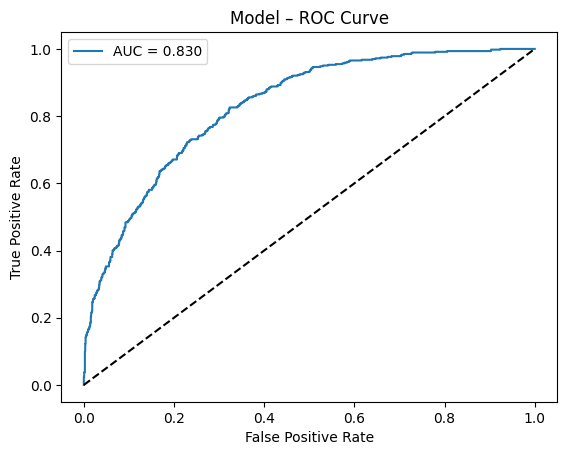

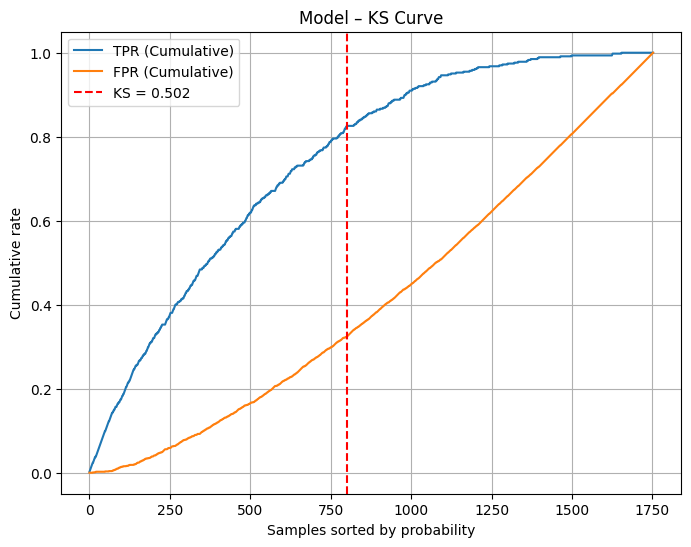

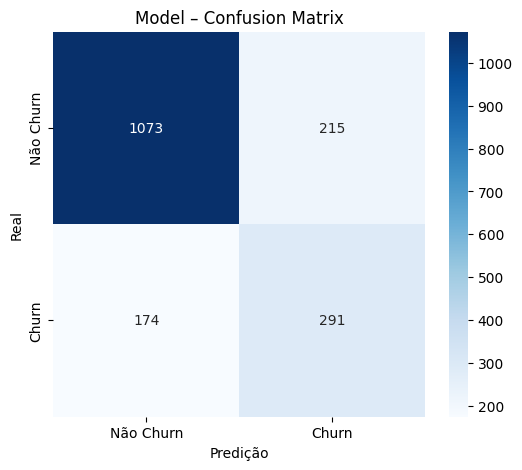

{'auc': np.float64(0.8298695986108329), 'ks': np.float64(0.5020486876377479)}

In [ ]:
show_results(model, X_test, y_test)

# Treinamento 2 - Otimização dos Hiperparâmetros

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)

print("Melhor KS:", study.best_value)
print("Melhores hiperparâmetros:")
study.best_params

[I 2025-12-18 00:42:17,459] A new study created in memory with name: no-name-08862ec8-6e44-4528-9a33-b5b3c26e11cb
[I 2025-12-18 00:42:19,346] Trial 0 finished with value: 0.563664596273292 and parameters: {'learning_rate': 0.01041104385702359, 'max_depth': 6, 'n_estimators': 788, 'subsample': 0.631328263502132, 'colsample_bytree': 0.7304637800818309, 'min_child_weight': 2, 'gamma': 0.6256000077366963, 'reg_alpha': 0.4802830833288586, 'reg_lambda': 4.4579184026341565}. Best is trial 0 with value: 0.563664596273292.
[I 2025-12-18 00:42:20,027] Trial 1 finished with value: 0.5419254658385093 and parameters: {'learning_rate': 0.2852056756192649, 'max_depth': 4, 'n_estimators': 580, 'subsample': 0.8939853136467693, 'colsample_bytree': 0.9296381999598962, 'min_child_weight': 2, 'gamma': 4.107099756119058, 'reg_alpha': 0.9215952128007787, 'reg_lambda': 1.546591716343174}. Best is trial 0 with value: 0.563664596273292.
[I 2025-12-18 00:42:20,273] Trial 2 finished with value: 0.5559006211180124

Melhor KS: 0.5652173913043479
Melhores hiperparâmetros:


{'learning_rate': 0.022210815489784333,
 'max_depth': 3,
 'n_estimators': 291,
 'subsample': 0.9491195480499326,
 'colsample_bytree': 0.8038319289389182,
 'min_child_weight': 4,
 'gamma': 2.009958018001118,
 'reg_alpha': 0.07405829642016026,
 'reg_lambda': 3.2234089309864835}

In [ ]:
best_params = study.best_params

final_model = xgb.XGBClassifier(
    **best_params,
    objective="binary:logistic",
    eval_metric="logloss",
    random_state=42,
    n_jobs=-1
)

final_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8038319289389182, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, feature_weights=None,
              gamma=2.009958018001118, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.022210815489784333,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=291, n_jobs=-1,
              num_parallel_tree=None, ...)

In [ ]:
results = {}

for split_name, X, y in [
    ("train", X_train, y_train),
    ("val",   X_val,   y_val),
    ("test",  X_test,  y_test)
]:
    y_prob = final_model.predict_proba(X)[:, 1]
    results[split_name] = evaluate_metrics(y, y_prob)

results


{'train': {'ks': np.float64(0.5890570430733411),
  'roc_auc': np.float64(0.8733254037198712),
  'accuracy': 0.7881257275902211,
  'precision': 0.7575442247658689,
  'recall': 0.8474970896391153,
  'mse': 0.14507915079593658,
  'cross_entropy': 0.4455476324676398},
 'val': {'ks': np.float64(0.5652173913043479),
  'roc_auc': np.float64(0.8497908910728753),
  'accuracy': 0.7732919254658385,
  'precision': 0.7634730538922155,
  'recall': 0.7919254658385093,
  'mse': 0.15708598494529724,
  'cross_entropy': 0.48055803259522933},
 'test': {'ks': np.float64(0.5565818473251853),
  'roc_auc': np.float64(0.8592733587123489),
  'accuracy': 0.7524244152880776,
  'precision': 0.521497919556172,
  'recall': 0.8086021505376344,
  'mse': 0.15567629039287567,
  'cross_entropy': 0.46505562954259366}}

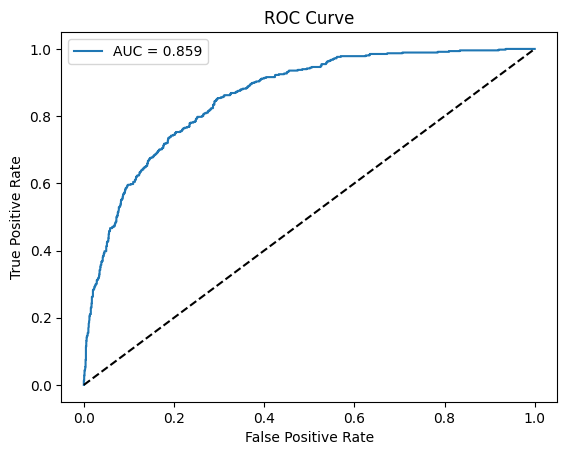

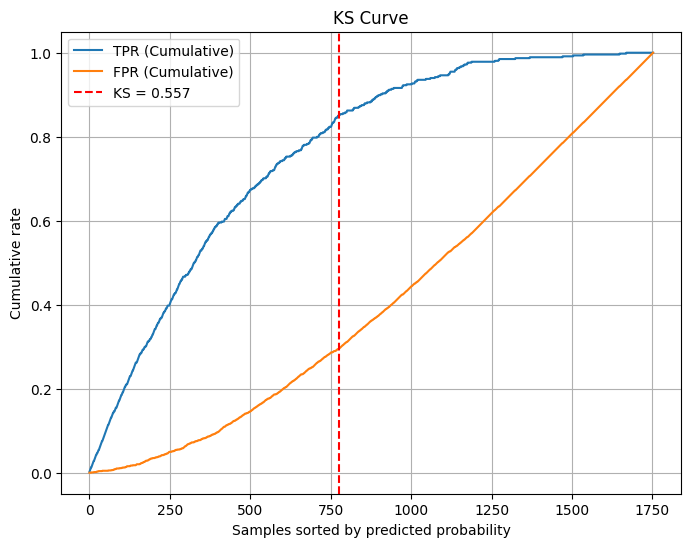

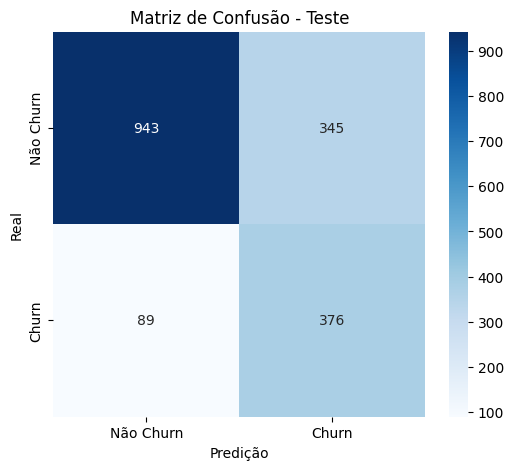

In [ ]:
show_results(final_model, X_test, y_test, results)


# Treinamento 3 - Fixação de Hiperparâmetros

## Max Depth

In [ ]:
def optuna_objective_xgb(trial, depth):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_int("max_depth", depth, depth),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 800),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


[I 2025-12-18 20:56:09,050] A new study created in memory with name: no-name-cab291c1-0caa-455c-aaa5-e3d239e48e52



===== MAX DEPTH = 2 =====


[I 2025-12-18 20:56:09,784] Trial 0 finished with value: 0.5559006211180124 and parameters: {'max_depth': 2, 'learning_rate': 0.13997098507463085, 'n_estimators': 723, 'subsample': 0.8158485965651416, 'colsample_bytree': 0.7918358795445806, 'min_child_weight': 10, 'gamma': 4.189916438403141, 'reg_alpha': 0.8718429819929489, 'reg_lambda': 4.384482046991668}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 20:56:10,567] Trial 1 finished with value: 0.5419254658385093 and parameters: {'max_depth': 2, 'learning_rate': 0.10302247690608418, 'n_estimators': 676, 'subsample': 0.6937079429652279, 'colsample_bytree': 0.7872085290439751, 'min_child_weight': 5, 'gamma': 0.23966593883512466, 'reg_alpha': 0.08582457550041966, 'reg_lambda': 3.784425712421605}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 20:56:10,905] Trial 2 finished with value: 0.5551242236024845 and parameters: {'max_depth': 2, 'learning_rate': 0.010803957778287816, 'n_estimators': 285, 'subsample': 

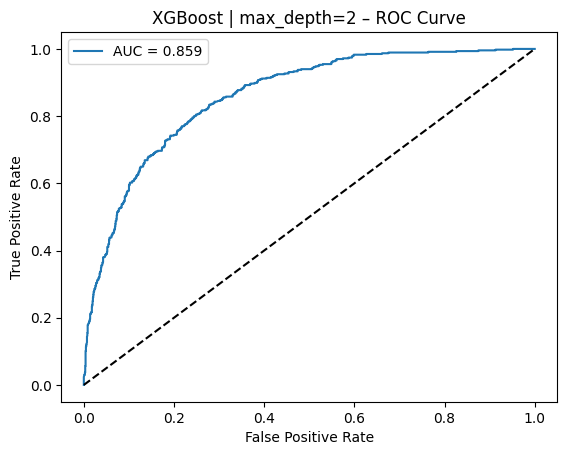

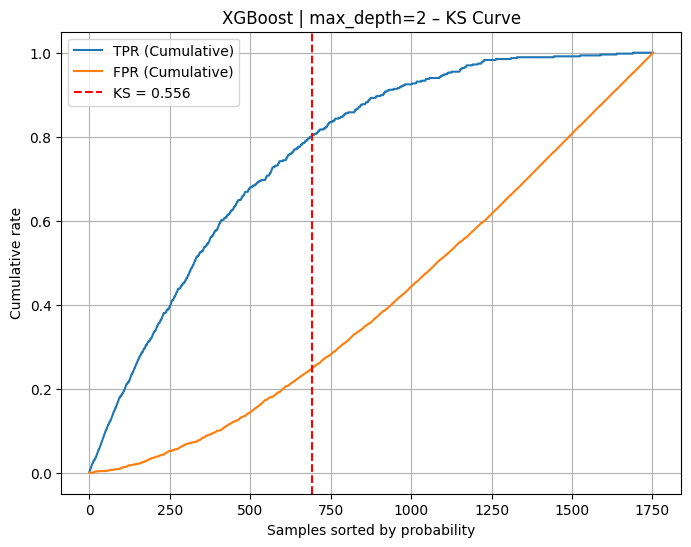

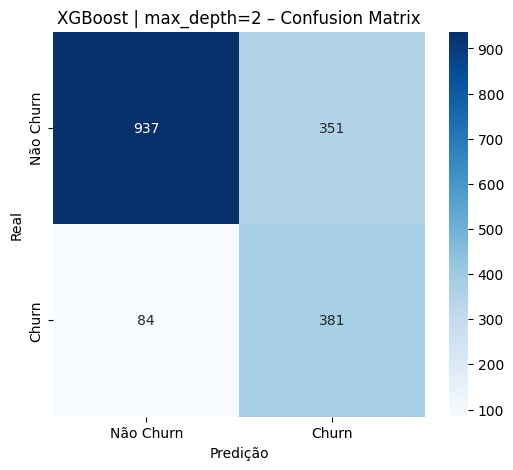

[I 2025-12-18 20:56:20,839] A new study created in memory with name: no-name-fd9536d6-a4f1-4b6d-9b98-e9be505a3082



===== MAX DEPTH = 3 =====


[I 2025-12-18 20:56:21,342] Trial 0 finished with value: 0.5559006211180124 and parameters: {'max_depth': 3, 'learning_rate': 0.010101616111220544, 'n_estimators': 384, 'subsample': 0.8652760702182, 'colsample_bytree': 0.8200231559449691, 'min_child_weight': 4, 'gamma': 0.8437438800076152, 'reg_alpha': 0.5223440602399486, 'reg_lambda': 0.8903759857897143}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 20:56:21,729] Trial 1 finished with value: 0.5496894409937888 and parameters: {'max_depth': 3, 'learning_rate': 0.033368073740953116, 'n_estimators': 276, 'subsample': 0.7241305286281032, 'colsample_bytree': 0.9995164717184386, 'min_child_weight': 2, 'gamma': 0.3239690193424605, 'reg_alpha': 0.7484987649969044, 'reg_lambda': 4.903296009829667}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 20:56:21,942] Trial 2 finished with value: 0.563664596273292 and parameters: {'max_depth': 3, 'learning_rate': 0.01466031218329179, 'n_estimators': 142, 'subsample': 0.68

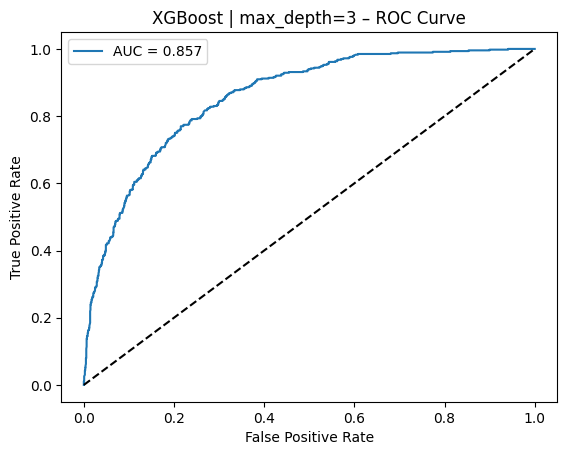

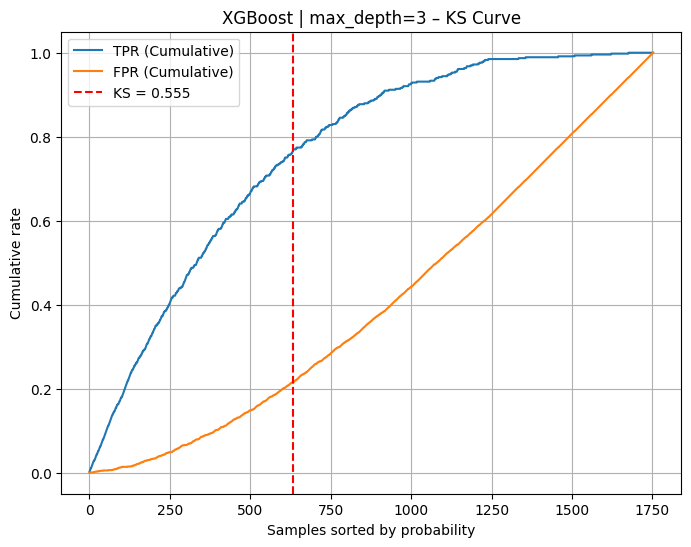

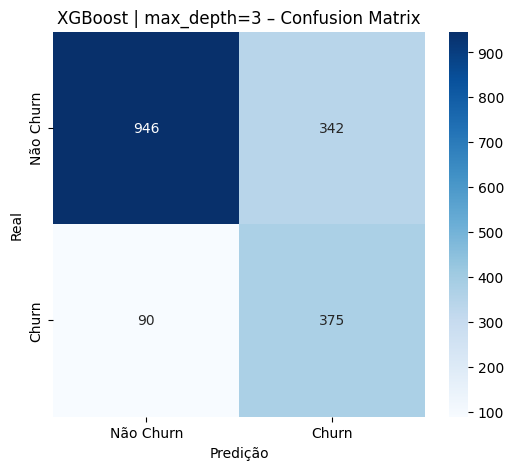

[I 2025-12-18 20:56:29,334] A new study created in memory with name: no-name-c637a61e-3dde-4c32-9ef6-508221f7f54f



===== MAX DEPTH = 4 =====


[I 2025-12-18 20:56:31,517] Trial 0 finished with value: 0.5512422360248448 and parameters: {'max_depth': 4, 'learning_rate': 0.1828740213493793, 'n_estimators': 495, 'subsample': 0.7252593807586726, 'colsample_bytree': 0.8799596513623058, 'min_child_weight': 1, 'gamma': 4.119233668492874, 'reg_alpha': 0.23117615382479506, 'reg_lambda': 4.659602146377829}. Best is trial 0 with value: 0.5512422360248448.
[I 2025-12-18 20:56:32,286] Trial 1 finished with value: 0.5613354037267081 and parameters: {'max_depth': 4, 'learning_rate': 0.08271201948718, 'n_estimators': 518, 'subsample': 0.6324166842964404, 'colsample_bytree': 0.6011736296458117, 'min_child_weight': 8, 'gamma': 3.2101976052441783, 'reg_alpha': 0.25290821466824565, 'reg_lambda': 4.982465388613825}. Best is trial 1 with value: 0.5613354037267081.
[I 2025-12-18 20:56:32,888] Trial 2 finished with value: 0.5395962732919255 and parameters: {'max_depth': 4, 'learning_rate': 0.056961514228087484, 'n_estimators': 469, 'subsample': 0.659

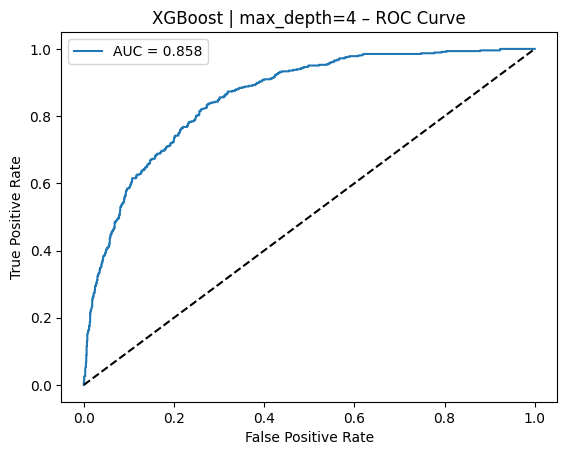

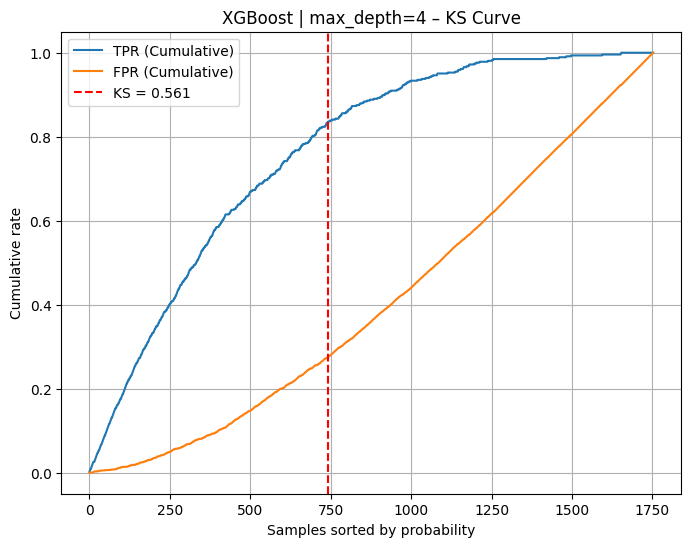

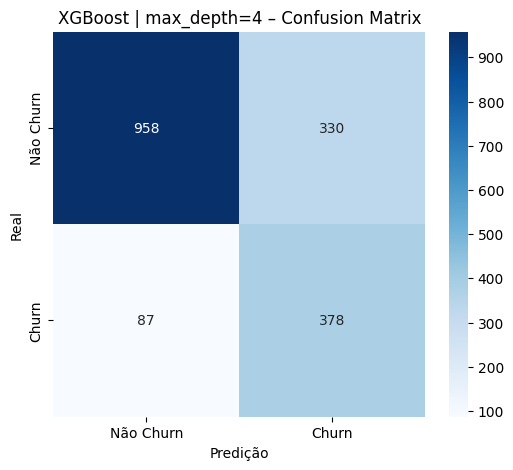

[I 2025-12-18 20:56:37,924] A new study created in memory with name: no-name-636edeae-3628-4b46-9ffb-c59bc19e8298



===== MAX DEPTH = 5 =====


[I 2025-12-18 20:56:38,213] Trial 0 finished with value: 0.5504658385093169 and parameters: {'max_depth': 5, 'learning_rate': 0.08415104511486216, 'n_estimators': 199, 'subsample': 0.7554780788969732, 'colsample_bytree': 0.9739807682915974, 'min_child_weight': 7, 'gamma': 2.334670630602117, 'reg_alpha': 0.2941739389275728, 'reg_lambda': 1.361033279176696}. Best is trial 0 with value: 0.5504658385093169.
[I 2025-12-18 20:56:38,633] Trial 1 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 0.02485635011556331, 'n_estimators': 234, 'subsample': 0.8323945308107614, 'colsample_bytree': 0.9335253080052616, 'min_child_weight': 10, 'gamma': 1.0238425077477709, 'reg_alpha': 0.6264286256427382, 'reg_lambda': 1.3976855868183096}. Best is trial 1 with value: 0.5512422360248448.
[I 2025-12-18 20:56:39,303] Trial 2 finished with value: 0.5535714285714286 and parameters: {'max_depth': 5, 'learning_rate': 0.024561099726548685, 'n_estimators': 583, 'subsample': 0

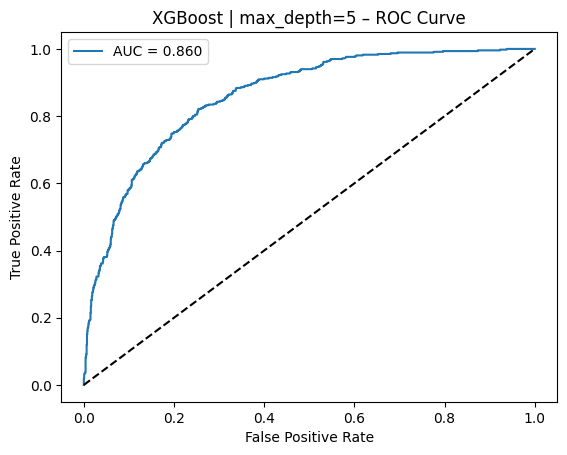

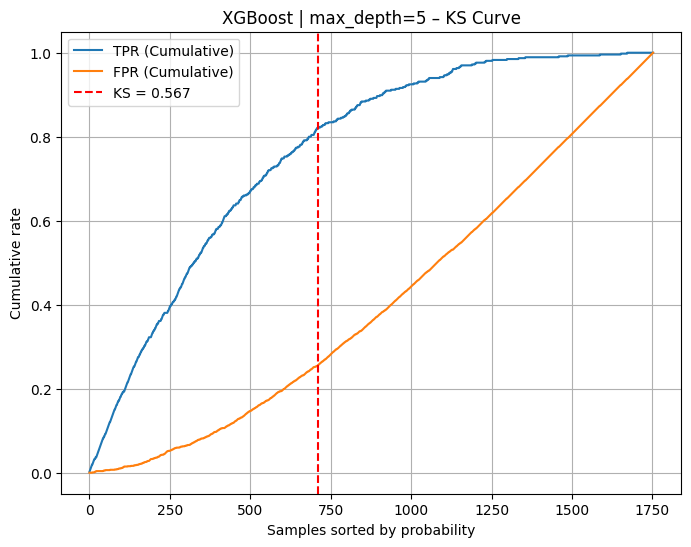

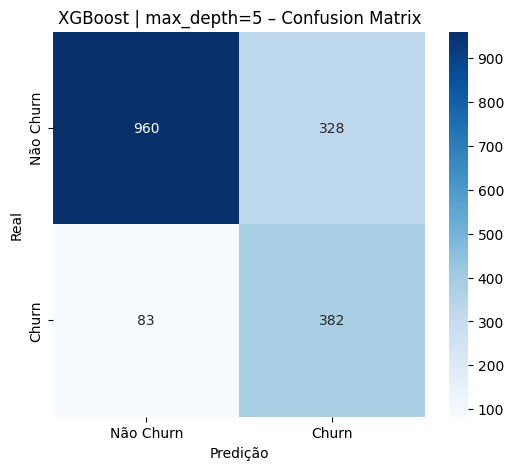

[I 2025-12-18 20:56:50,113] A new study created in memory with name: no-name-7aa0938c-2b4f-4971-ad16-ddc7f684b0c2



===== MAX DEPTH = 6 =====


[I 2025-12-18 20:56:50,345] Trial 0 finished with value: 0.531832298136646 and parameters: {'max_depth': 6, 'learning_rate': 0.23598592641623237, 'n_estimators': 169, 'subsample': 0.7117340761747273, 'colsample_bytree': 0.6444299029405383, 'min_child_weight': 3, 'gamma': 3.0948024391231392, 'reg_alpha': 0.8595339045191265, 'reg_lambda': 1.8834190524936694}. Best is trial 0 with value: 0.531832298136646.
[I 2025-12-18 20:56:51,177] Trial 1 finished with value: 0.5574534161490683 and parameters: {'max_depth': 6, 'learning_rate': 0.07427518030526974, 'n_estimators': 752, 'subsample': 0.6096422447598647, 'colsample_bytree': 0.6917183762277233, 'min_child_weight': 2, 'gamma': 2.996494208836395, 'reg_alpha': 0.42121748080146115, 'reg_lambda': 4.802536984283057}. Best is trial 1 with value: 0.5574534161490683.
[I 2025-12-18 20:56:51,902] Trial 2 finished with value: 0.5559006211180124 and parameters: {'max_depth': 6, 'learning_rate': 0.013309917859614493, 'n_estimators': 516, 'subsample': 0.6

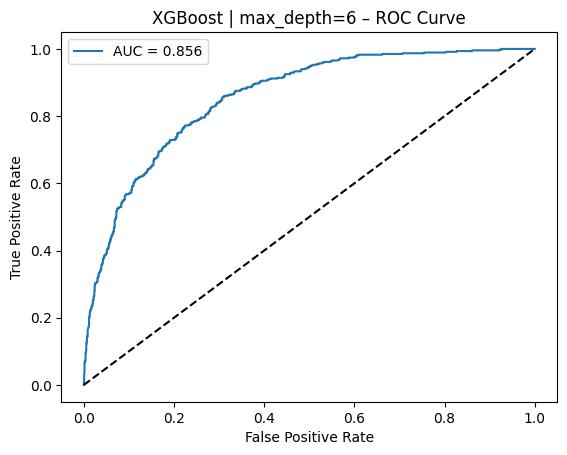

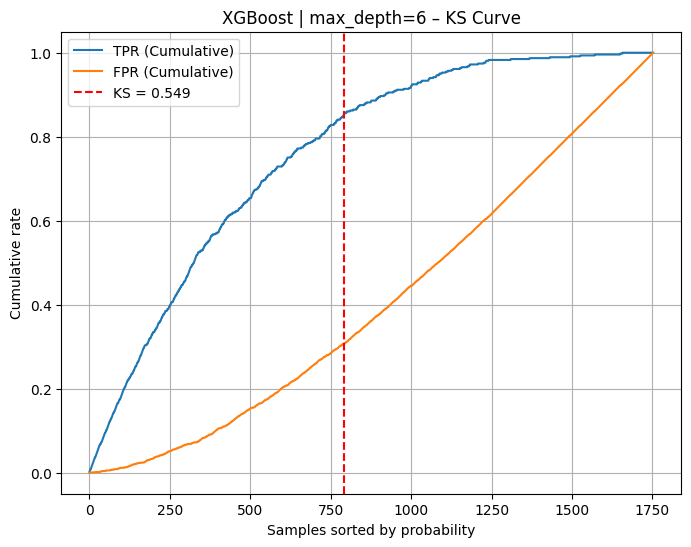

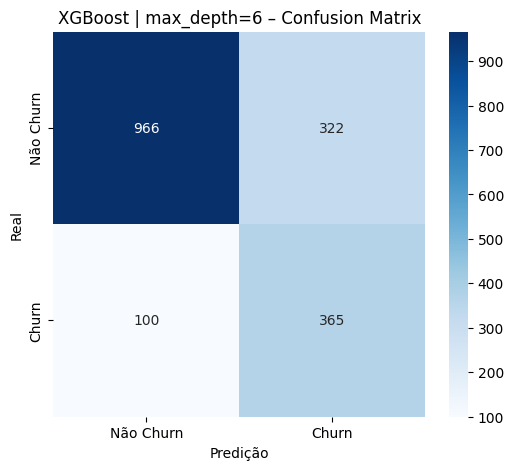

[I 2025-12-18 20:57:02,525] A new study created in memory with name: no-name-7f60d718-4067-49dd-8219-d6db9389600f



===== MAX DEPTH = 8 =====


[I 2025-12-18 20:57:02,891] Trial 0 finished with value: 0.5427018633540373 and parameters: {'max_depth': 8, 'learning_rate': 0.08866306592616348, 'n_estimators': 250, 'subsample': 0.8072638370150608, 'colsample_bytree': 0.788477572437544, 'min_child_weight': 10, 'gamma': 1.6962138464288201, 'reg_alpha': 0.0911634555015346, 'reg_lambda': 0.6852203157652978}. Best is trial 0 with value: 0.5427018633540373.
[I 2025-12-18 20:57:03,471] Trial 1 finished with value: 0.5217391304347827 and parameters: {'max_depth': 8, 'learning_rate': 0.09104402065576307, 'n_estimators': 382, 'subsample': 0.8564176549933529, 'colsample_bytree': 0.7790048068900517, 'min_child_weight': 9, 'gamma': 0.625511738514829, 'reg_alpha': 0.10177111720929666, 'reg_lambda': 3.0759045453494305}. Best is trial 0 with value: 0.5427018633540373.
[I 2025-12-18 20:57:04,535] Trial 2 finished with value: 0.5411490683229814 and parameters: {'max_depth': 8, 'learning_rate': 0.022275036308639133, 'n_estimators': 597, 'subsample': 

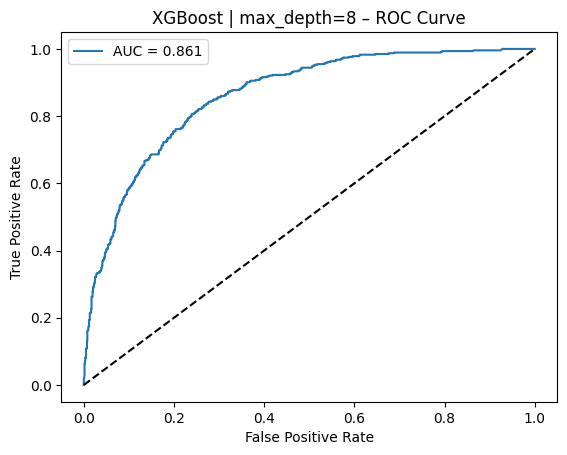

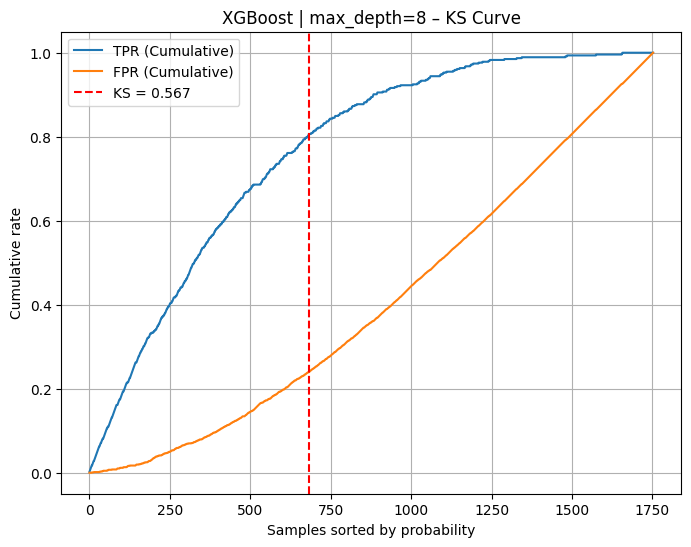

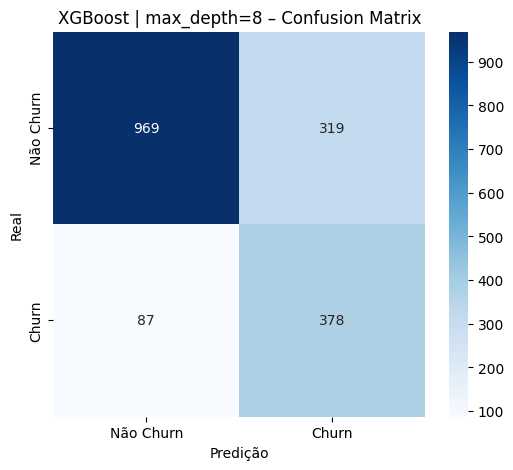

In [ ]:
DEPTHS = [2, 3, 4, 5, 6, 8]

all_results = []

for depth in DEPTHS:

    print(f"\n===== MAX DEPTH = {depth} =====")

    study = optuna.create_study(direction="maximize")
    study.optimize(
        lambda trial: optuna_objective_xgb(trial, depth),
        n_trials=15
    )

    best_params = {**study.best_params}

    # ─── Treina modelo final para ESTE depth ───────────────
    model = XGBClassifier(
        **best_params,
        eval_metric="logloss",
        random_state=42
    )

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    # ─── Avaliação + Gráficos ─────────────────────────────
    metrics = show_results(
        model=model,
        X=X_test,
        y=y_test,
        threshold=0.5,
        title_prefix=f"XGBoost | max_depth={depth}"
    )

    # ─── Log estruturado ──────────────────────────────────
    all_results.append({
        "max_depth": depth,
        "ks": metrics["ks"],
        "auc": metrics["auc"],
        **study.best_params
    })

In [ ]:
for result in all_results:
  print(result)

{'max_depth': 2, 'ks': np.float64(0.5558538702998731), 'auc': np.float64(0.8590688238829893), 'learning_rate': 0.02029283975798969, 'n_estimators': 534, 'subsample': 0.6141557320865864, 'colsample_bytree': 0.6026203659978121, 'min_child_weight': 3, 'gamma': 4.615918924513574, 'reg_alpha': 0.983546902153516, 'reg_lambda': 3.290814031743823}
{'max_depth': 3, 'ks': np.float64(0.5548303613170373), 'auc': np.float64(0.8569541841982236), 'learning_rate': 0.1939180438257009, 'n_estimators': 323, 'subsample': 0.951584276393034, 'colsample_bytree': 0.6647046508575419, 'min_child_weight': 9, 'gamma': 4.990024484589235, 'reg_alpha': 0.6383824333636935, 'reg_lambda': 1.1058484634576748}
{'max_depth': 4, 'ks': np.float64(0.5609380217725239), 'auc': np.float64(0.8579693448206772), 'learning_rate': 0.14986424852048816, 'n_estimators': 233, 'subsample': 0.6576735971083367, 'colsample_bytree': 0.6436128881070545, 'min_child_weight': 10, 'gamma': 4.193439837343397, 'reg_alpha': 0.7565997216062991, 'reg_

## Learning Rate e N estimators

In [ ]:
def optuna_objective_xgb(trial, lr, n_estimator):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_categorical("max_depth", [5, 8]),
        "learning_rate": trial.suggest_float("learning_rate", lr, lr, log=True),
        "n_estimators": trial.suggest_int("n_estimators", n_estimator, n_estimator),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


[I 2025-12-18 21:13:22,935] A new study created in memory with name: no-name-eccccac4-2a8b-4fa2-928d-a4a72f9988e4



===== LR = 0.1 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:13:23,199] Trial 0 finished with value: 0.5341614906832299 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 200, 'subsample': 0.732216286490369, 'colsample_bytree': 0.6489752449003745, 'min_child_weight': 1, 'gamma': 2.1797279764703554, 'reg_alpha': 0.6713624297164873, 'reg_lambda': 1.474420779480351}. Best is trial 0 with value: 0.5341614906832299.
[I 2025-12-18 21:13:23,497] Trial 1 finished with value: 0.5434782608695652 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 200, 'subsample': 0.8606377030586216, 'colsample_bytree': 0.9510841609725605, 'min_child_weight': 8, 'gamma': 1.7387643028466993, 'reg_alpha': 0.6757976243674988, 'reg_lambda': 2.165438966230922}. Best is trial 1 with value: 0.5434782608695652.
[I 2025-12-18 21:13:23,738] Trial 2 finished with value: 0.5481366459627329 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 200, 'subsample': 0.9750389724882579, 'colsample_bytree': 0.6994134223

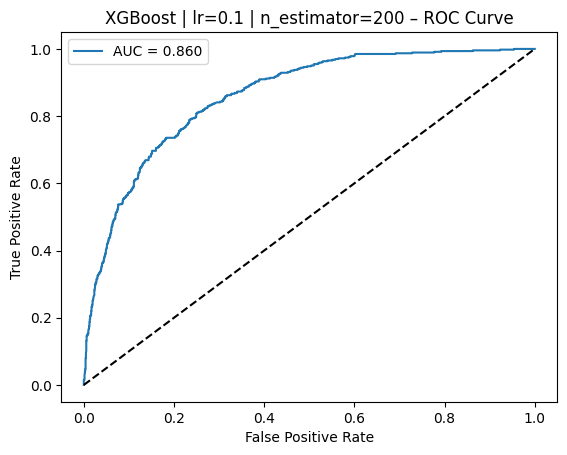

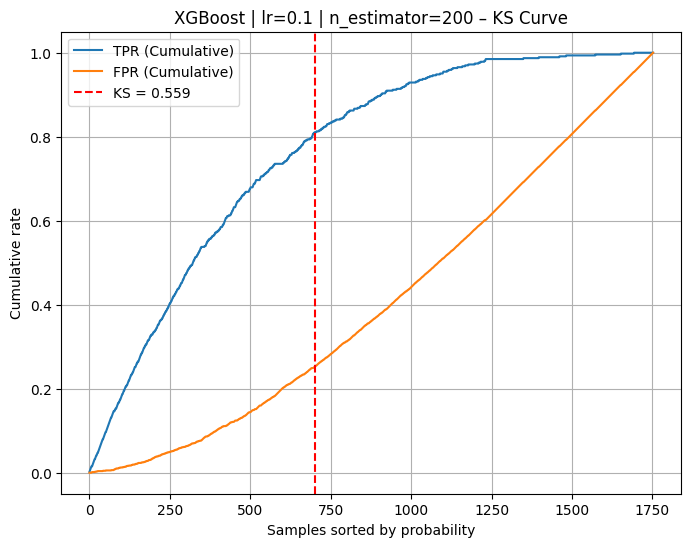

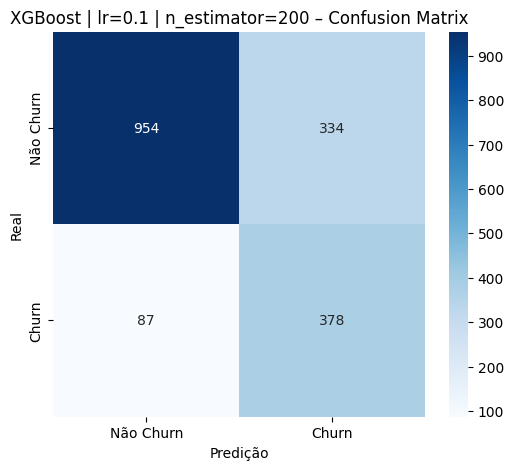

[I 2025-12-18 21:13:34,137] A new study created in memory with name: no-name-18b1b70c-3452-409e-bc17-878ecc046fdd



===== LR = 0.1 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:13:34,854] Trial 0 finished with value: 0.5069875776397516 and parameters: {'max_depth': 8, 'learning_rate': 0.1, 'n_estimators': 400, 'subsample': 0.888655415141468, 'colsample_bytree': 0.6342312610147584, 'min_child_weight': 9, 'gamma': 0.06666270913948114, 'reg_alpha': 0.2593049464730053, 'reg_lambda': 3.5326329206603555}. Best is trial 0 with value: 0.5069875776397516.
[I 2025-12-18 21:13:35,358] Trial 1 finished with value: 0.5372670807453417 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 400, 'subsample': 0.6057035540533181, 'colsample_bytree': 0.926606323035551, 'min_child_weight': 8, 'gamma': 1.999512818564138, 'reg_alpha': 0.7585770611042164, 'reg_lambda': 3.7911102117961355}. Best is trial 1 with value: 0.5372670807453417.
[I 2025-12-18 21:13:35,829] Trial 2 finished with value: 0.5566770186335404 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 400, 'subsample': 0.8795602714421557, 'colsample_bytree': 0.755835232

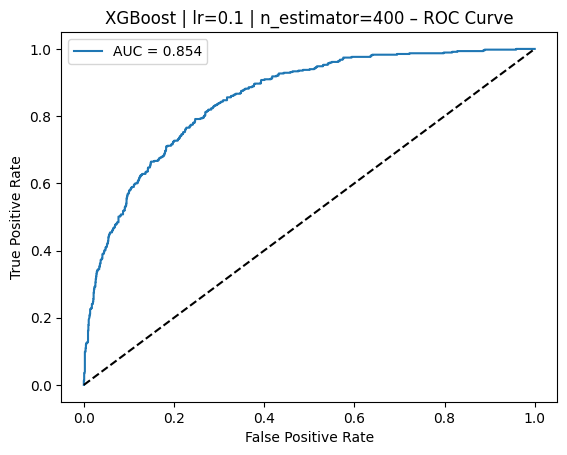

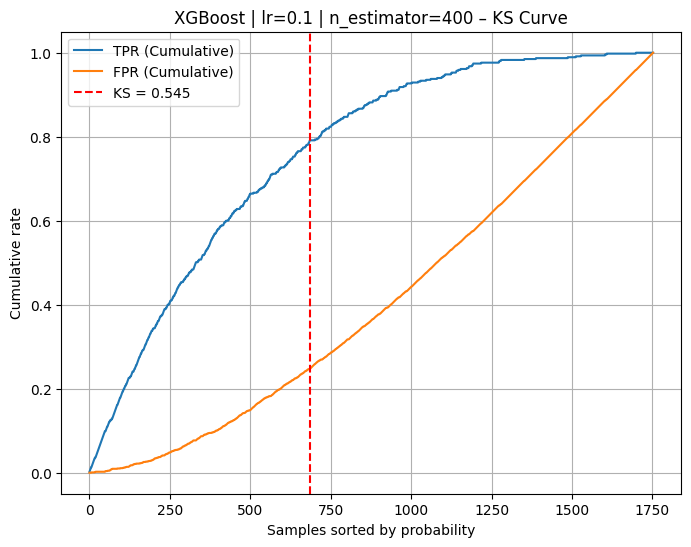

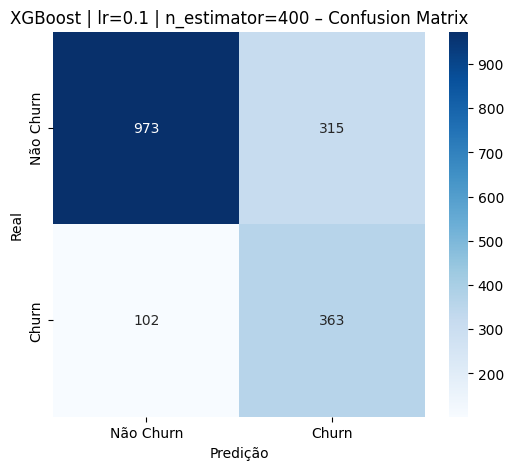

[I 2025-12-18 21:13:52,133] A new study created in memory with name: no-name-c16d681f-73b3-41d4-b849-ac017aa73d3c



===== LR = 0.1 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:13:54,745] Trial 0 finished with value: 0.5582298136645962 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 800, 'subsample': 0.873737130329278, 'colsample_bytree': 0.6970855513858231, 'min_child_weight': 8, 'gamma': 4.0837488747738675, 'reg_alpha': 0.1197379050669024, 'reg_lambda': 3.508061860520428}. Best is trial 0 with value: 0.5582298136645962.
[I 2025-12-18 21:13:55,736] Trial 1 finished with value: 0.5217391304347827 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 800, 'subsample': 0.8149163777420624, 'colsample_bytree': 0.8027844934056138, 'min_child_weight': 3, 'gamma': 0.7963253039041135, 'reg_alpha': 0.18403763151510655, 'reg_lambda': 2.4189203415936644}. Best is trial 0 with value: 0.5582298136645962.
[I 2025-12-18 21:13:56,577] Trial 2 finished with value: 0.5458074534161491 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 800, 'subsample': 0.9493909937923565, 'colsample_bytree': 0.82928460

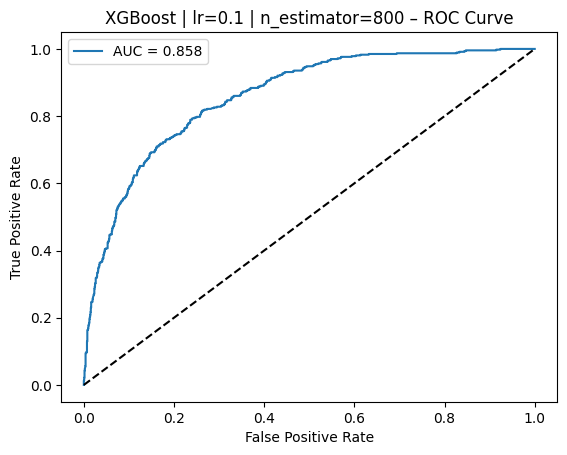

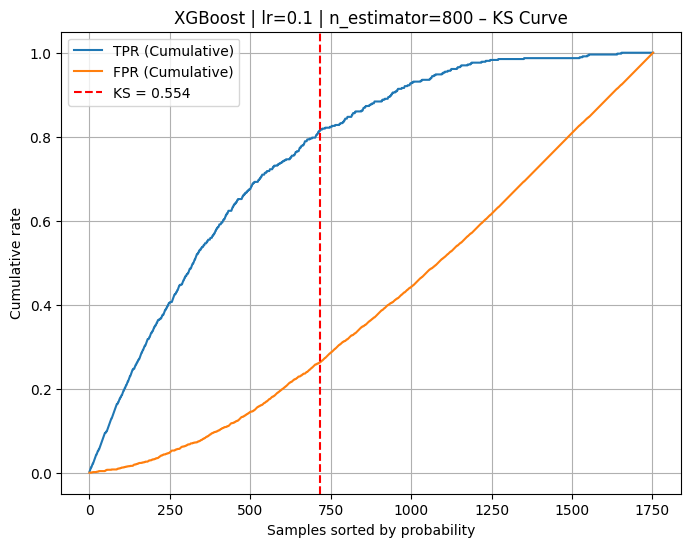

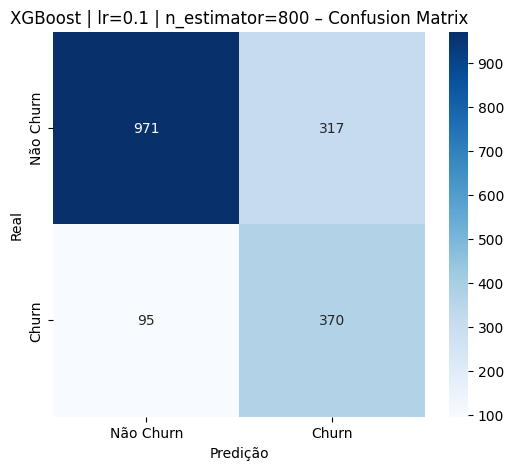

[I 2025-12-18 21:14:25,882] A new study created in memory with name: no-name-da6194b8-3cac-49dd-920b-561ae08f1471



===== LR = 0.1 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:14:27,145] Trial 0 finished with value: 0.5574534161490683 and parameters: {'max_depth': 8, 'learning_rate': 0.1, 'n_estimators': 1200, 'subsample': 0.859514010155842, 'colsample_bytree': 0.8930453045562461, 'min_child_weight': 10, 'gamma': 3.3887715455845617, 'reg_alpha': 0.5473272341202279, 'reg_lambda': 1.6969067315679576}. Best is trial 0 with value: 0.5574534161490683.
[I 2025-12-18 21:14:28,371] Trial 1 finished with value: 0.5605590062111802 and parameters: {'max_depth': 8, 'learning_rate': 0.1, 'n_estimators': 1200, 'subsample': 0.8609520749294497, 'colsample_bytree': 0.7156291075466511, 'min_child_weight': 5, 'gamma': 2.4118886069249905, 'reg_alpha': 0.5463786925931432, 'reg_lambda': 3.510938352662847}. Best is trial 1 with value: 0.5605590062111802.
[I 2025-12-18 21:14:29,577] Trial 2 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 1200, 'subsample': 0.961057611991889, 'colsample_bytree': 0.765139

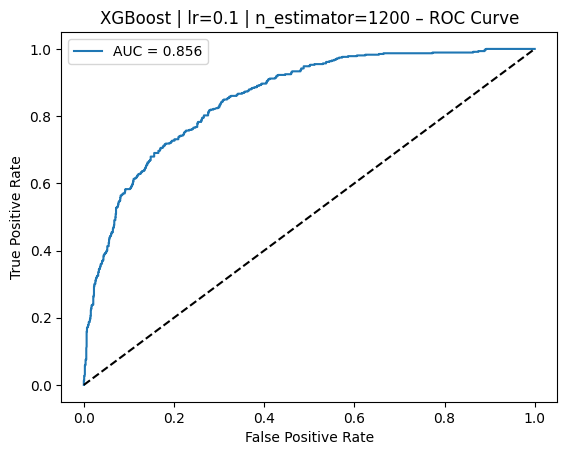

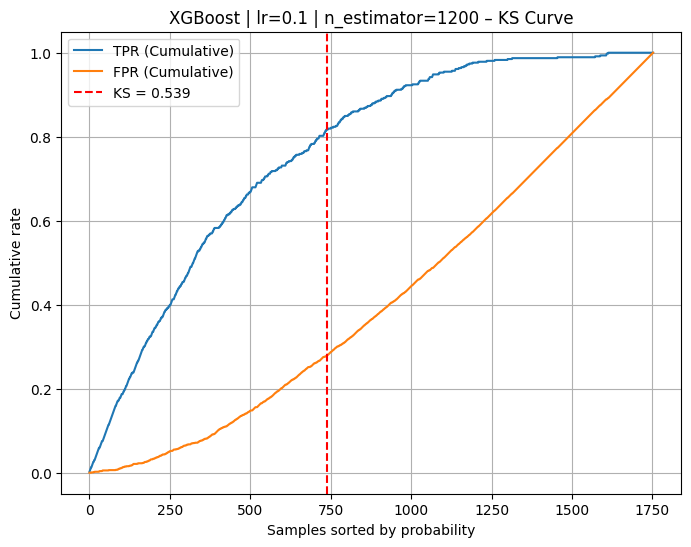

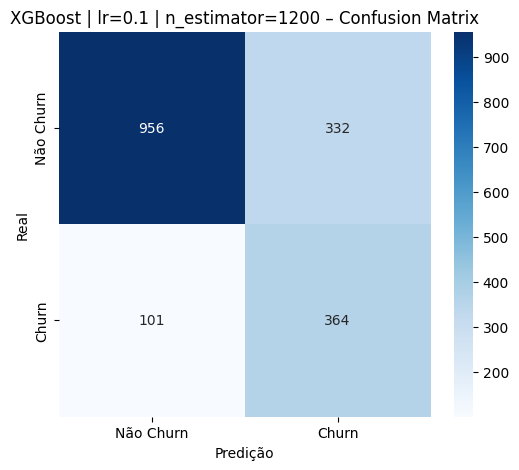

[I 2025-12-18 21:15:14,834] A new study created in memory with name: no-name-dc9cfb19-5d0b-4765-9849-a10861443a2e



===== LR = 0.05 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:15:15,199] Trial 0 finished with value: 0.5582298136645962 and parameters: {'max_depth': 5, 'learning_rate': 0.05, 'n_estimators': 200, 'subsample': 0.644023609516439, 'colsample_bytree': 0.7823139012112679, 'min_child_weight': 5, 'gamma': 1.392405143403836, 'reg_alpha': 0.05960103882993162, 'reg_lambda': 1.6311814055954026}. Best is trial 0 with value: 0.5582298136645962.
[I 2025-12-18 21:15:15,477] Trial 1 finished with value: 0.5559006211180124 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 200, 'subsample': 0.6876565953586801, 'colsample_bytree': 0.9122636188800213, 'min_child_weight': 5, 'gamma': 4.816942916982351, 'reg_alpha': 0.21247604572912315, 'reg_lambda': 4.773381488493662}. Best is trial 0 with value: 0.5582298136645962.
[I 2025-12-18 21:15:15,798] Trial 2 finished with value: 0.5628881987577639 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 200, 'subsample': 0.7312529132148133, 'colsample_bytree': 0.965666

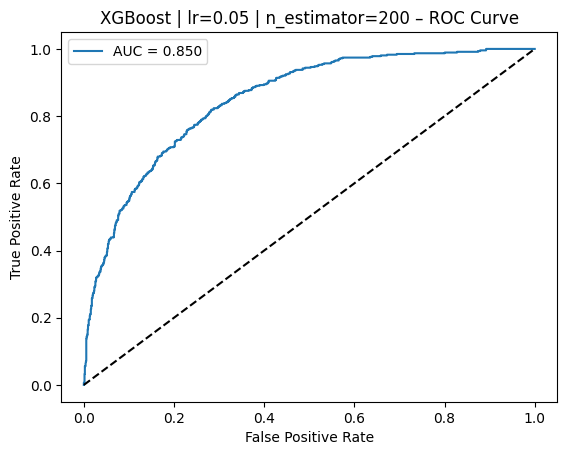

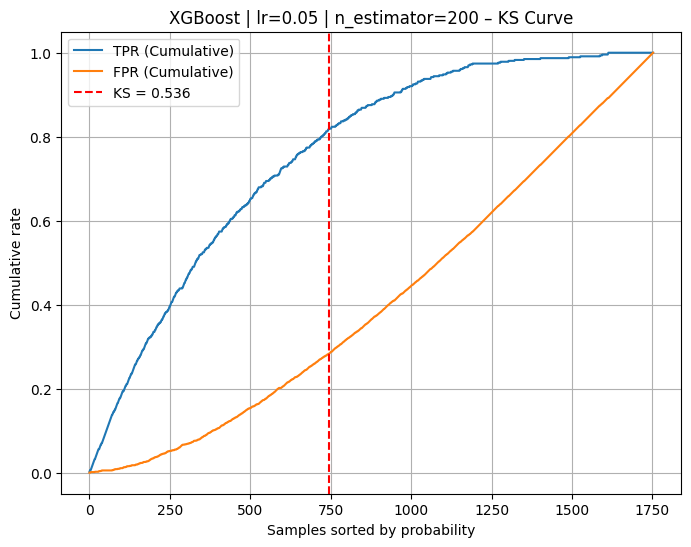

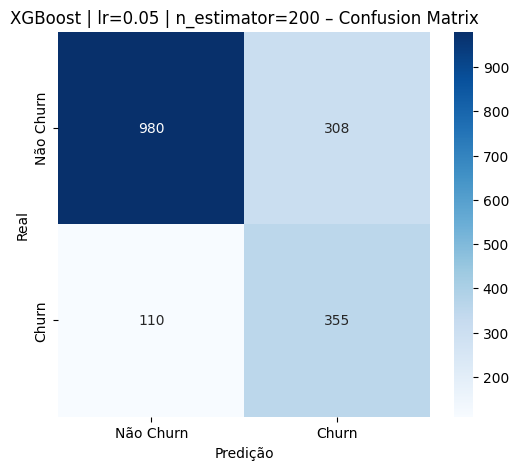

[I 2025-12-18 21:15:27,578] A new study created in memory with name: no-name-eb8fbdd8-8402-4fd3-9ee8-29835114e6ea



===== LR = 0.05 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:15:28,472] Trial 0 finished with value: 0.5295031055900621 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 400, 'subsample': 0.6877214847818053, 'colsample_bytree': 0.7816280232127626, 'min_child_weight': 6, 'gamma': 0.32834816098552877, 'reg_alpha': 0.4752216214665099, 'reg_lambda': 2.4481990040678854}. Best is trial 0 with value: 0.5295031055900621.
[I 2025-12-18 21:15:29,032] Trial 1 finished with value: 0.5442546583850931 and parameters: {'max_depth': 5, 'learning_rate': 0.05, 'n_estimators': 400, 'subsample': 0.7947570212487569, 'colsample_bytree': 0.7393908274351167, 'min_child_weight': 3, 'gamma': 1.1211753385876255, 'reg_alpha': 0.685548689770072, 'reg_lambda': 1.6856168642970233}. Best is trial 1 with value: 0.5442546583850931.
[I 2025-12-18 21:15:29,534] Trial 2 finished with value: 0.5566770186335404 and parameters: {'max_depth': 5, 'learning_rate': 0.05, 'n_estimators': 400, 'subsample': 0.7885651857562325, 'colsample_bytree': 0.9688

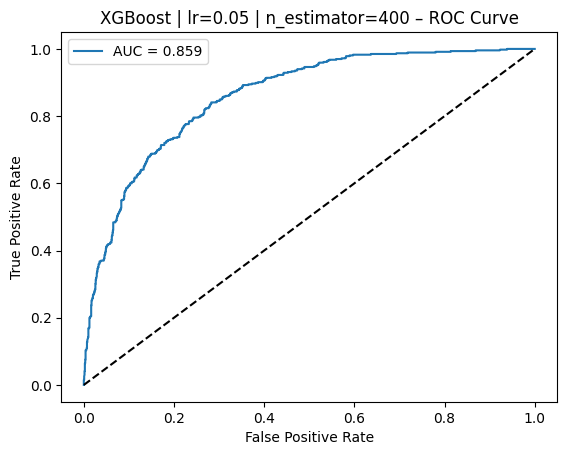

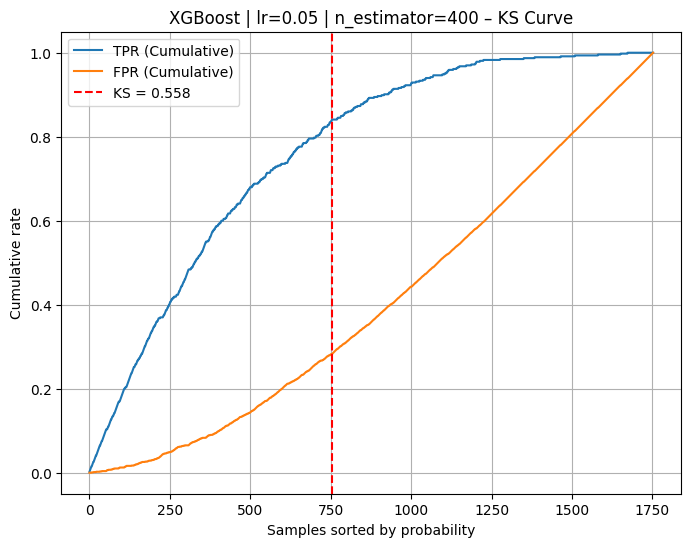

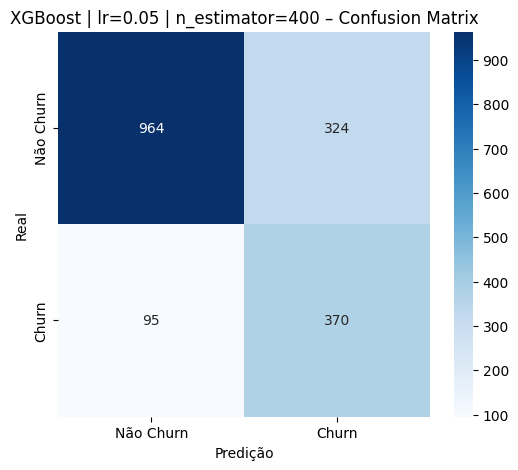

[I 2025-12-18 21:15:45,739] A new study created in memory with name: no-name-d3c6b8fc-48cd-49a2-82f4-776f3098b6f1



===== LR = 0.05 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:15:46,631] Trial 0 finished with value: 0.5590062111801242 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 800, 'subsample': 0.6850655195697223, 'colsample_bytree': 0.6253336013991114, 'min_child_weight': 2, 'gamma': 4.8797657412712745, 'reg_alpha': 0.05670105316129559, 'reg_lambda': 4.917870156193604}. Best is trial 0 with value: 0.5590062111801242.
[I 2025-12-18 21:15:47,462] Trial 1 finished with value: 0.5496894409937888 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 800, 'subsample': 0.7371761010380758, 'colsample_bytree': 0.7731511493183392, 'min_child_weight': 8, 'gamma': 4.796655350235942, 'reg_alpha': 0.0840485473785173, 'reg_lambda': 2.8874346065490837}. Best is trial 0 with value: 0.5590062111801242.
[I 2025-12-18 21:15:48,326] Trial 2 finished with value: 0.5582298136645962 and parameters: {'max_depth': 5, 'learning_rate': 0.05, 'n_estimators': 800, 'subsample': 0.859251861147745, 'colsample_bytree': 0.861517

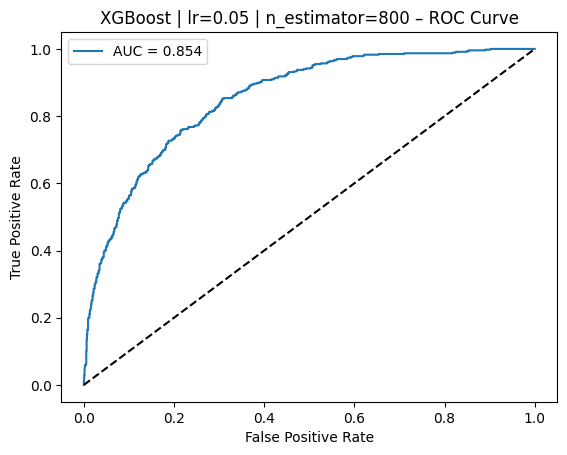

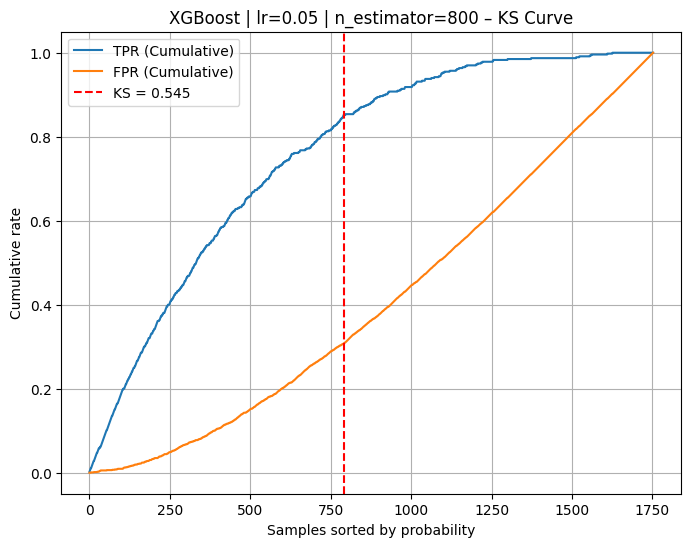

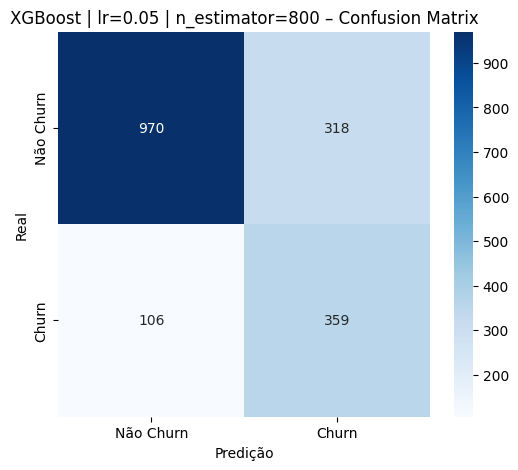

[I 2025-12-18 21:16:20,900] A new study created in memory with name: no-name-cd92d9e6-61f2-4c05-ab98-af3875e54c7f



===== LR = 0.05 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:16:22,819] Trial 0 finished with value: 0.5194099378881988 and parameters: {'max_depth': 5, 'learning_rate': 0.05, 'n_estimators': 1200, 'subsample': 0.6366671304531585, 'colsample_bytree': 0.8880495224849927, 'min_child_weight': 7, 'gamma': 0.22270689837098068, 'reg_alpha': 0.27632957606848296, 'reg_lambda': 2.753331779976694}. Best is trial 0 with value: 0.5194099378881988.
[I 2025-12-18 21:16:24,986] Trial 1 finished with value: 0.47670807453416153 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 1200, 'subsample': 0.6307111385460027, 'colsample_bytree': 0.9226877363264271, 'min_child_weight': 7, 'gamma': 0.23209775440903968, 'reg_alpha': 0.021386156959753766, 'reg_lambda': 3.4384891757188174}. Best is trial 0 with value: 0.5194099378881988.
[I 2025-12-18 21:16:26,238] Trial 2 finished with value: 0.5496894409937888 and parameters: {'max_depth': 8, 'learning_rate': 0.05, 'n_estimators': 1200, 'subsample': 0.7488478372681174, 'colsample_bytree'

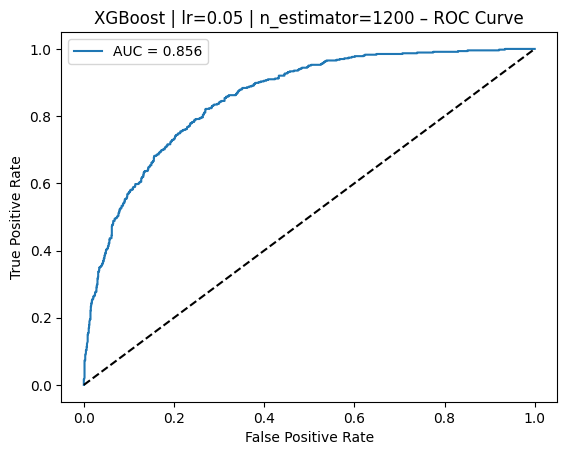

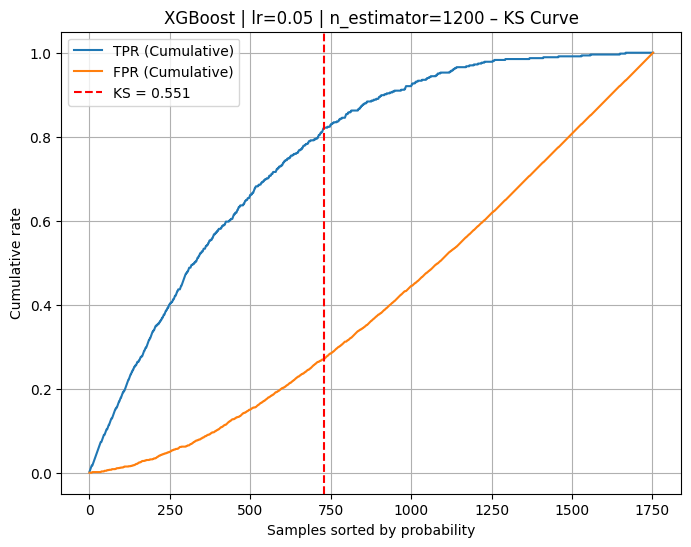

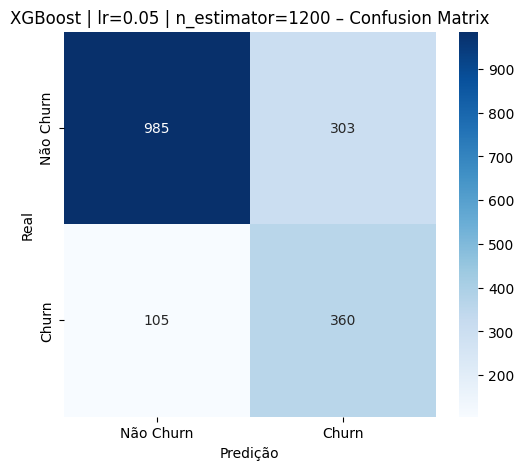

[I 2025-12-18 21:17:12,349] A new study created in memory with name: no-name-4d53d680-df2f-46d8-b706-c6e165402b3c



===== LR = 0.03 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:17:12,737] Trial 0 finished with value: 0.56444099378882 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 200, 'subsample': 0.6958677436449947, 'colsample_bytree': 0.9328165279271441, 'min_child_weight': 2, 'gamma': 4.9985116619229055, 'reg_alpha': 0.03990889647712981, 'reg_lambda': 1.6784207074318114}. Best is trial 0 with value: 0.56444099378882.
[I 2025-12-18 21:17:13,100] Trial 1 finished with value: 0.5535714285714286 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 200, 'subsample': 0.6558639738826528, 'colsample_bytree': 0.8195539582745, 'min_child_weight': 10, 'gamma': 3.518684042841507, 'reg_alpha': 0.022201415968379434, 'reg_lambda': 0.9875234646074164}. Best is trial 0 with value: 0.56444099378882.
[I 2025-12-18 21:17:13,424] Trial 2 finished with value: 0.5496894409937889 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 200, 'subsample': 0.6626087186949537, 'colsample_bytree': 0.8171544609

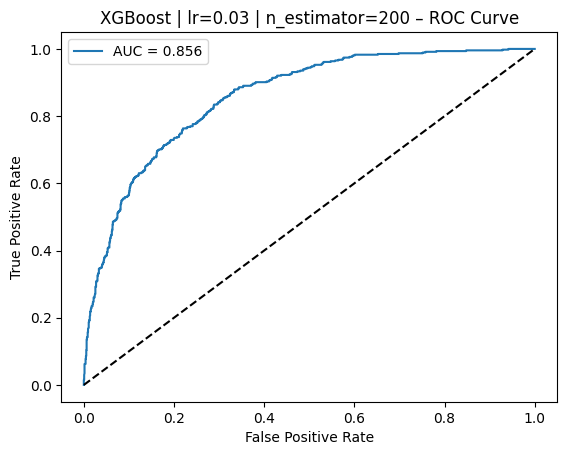

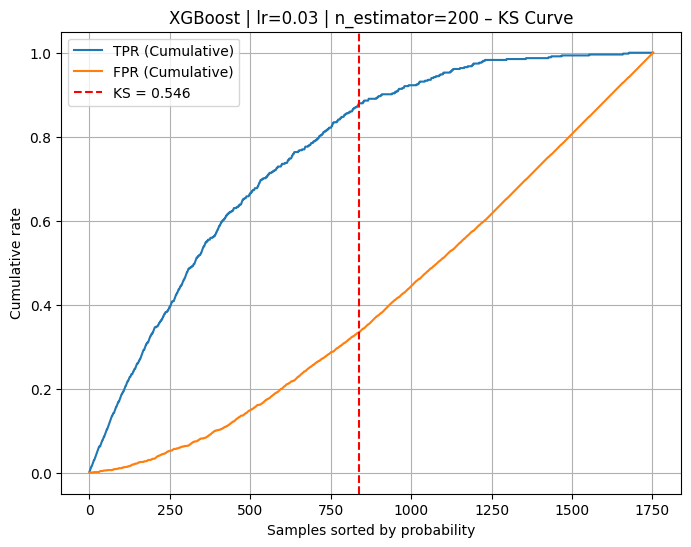

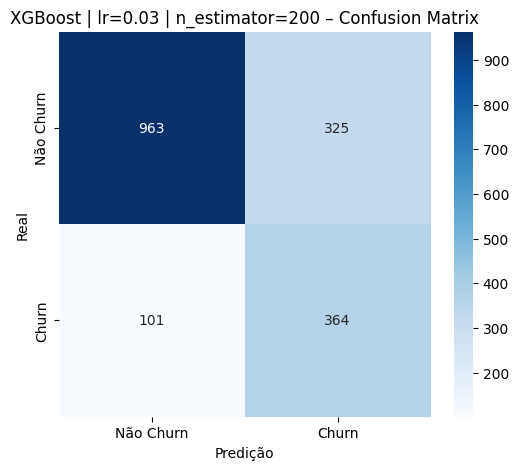

[I 2025-12-18 21:17:26,201] A new study created in memory with name: no-name-ae8a668a-8b90-4ea9-b5c0-613e404b1fe9



===== LR = 0.03 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:17:26,861] Trial 0 finished with value: 0.5481366459627329 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 400, 'subsample': 0.7188074814404692, 'colsample_bytree': 0.9818746814589545, 'min_child_weight': 7, 'gamma': 1.3812298547198383, 'reg_alpha': 0.5157031209819143, 'reg_lambda': 2.5583926019194663}. Best is trial 0 with value: 0.5481366459627329.
[I 2025-12-18 21:17:27,438] Trial 1 finished with value: 0.5527950310559007 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 400, 'subsample': 0.9023885459383628, 'colsample_bytree': 0.9992281104700338, 'min_child_weight': 6, 'gamma': 2.7873336167042995, 'reg_alpha': 0.5651100520590361, 'reg_lambda': 2.545059195736929}. Best is trial 1 with value: 0.5527950310559007.
[I 2025-12-18 21:17:27,958] Trial 2 finished with value: 0.5535714285714286 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 400, 'subsample': 0.6264075682051844, 'colsample_bytree': 0.87600

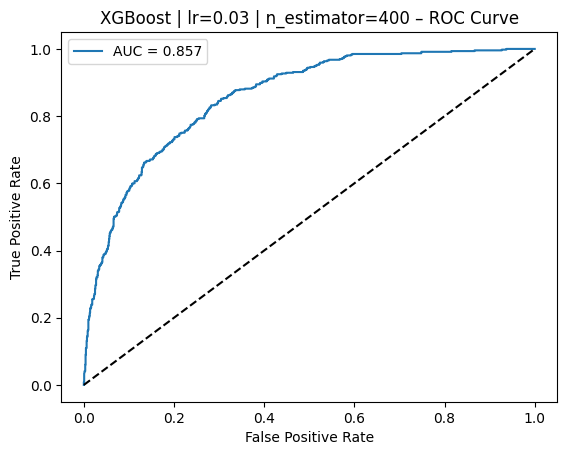

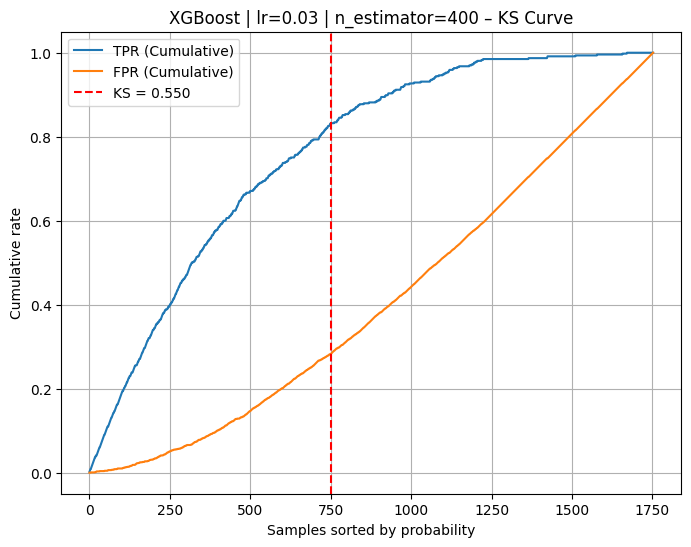

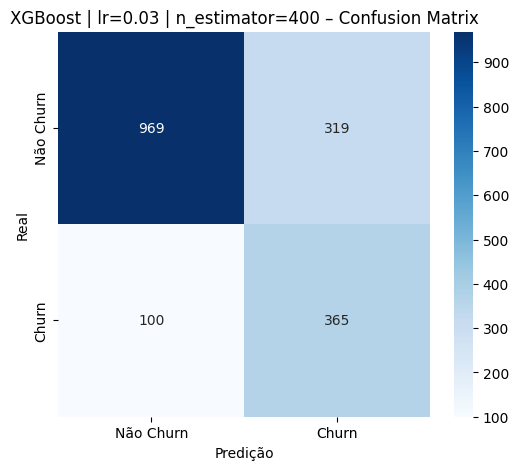

[I 2025-12-18 21:17:46,252] A new study created in memory with name: no-name-cdb5ae89-212f-4344-aaad-3df1b697dda3



===== LR = 0.03 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:17:49,150] Trial 0 finished with value: 0.5559006211180124 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 800, 'subsample': 0.9720111142287411, 'colsample_bytree': 0.6506538833979664, 'min_child_weight': 4, 'gamma': 4.399815967096805, 'reg_alpha': 0.9137762013322313, 'reg_lambda': 3.7774393062317446}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 21:17:50,433] Trial 1 finished with value: 0.5427018633540373 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 800, 'subsample': 0.7329437804143207, 'colsample_bytree': 0.9349891035476507, 'min_child_weight': 10, 'gamma': 1.236750070703894, 'reg_alpha': 0.746053453895723, 'reg_lambda': 4.291178736551418}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 21:17:51,360] Trial 2 finished with value: 0.5527950310559007 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 800, 'subsample': 0.7351587697829102, 'colsample_bytree': 0.8671005

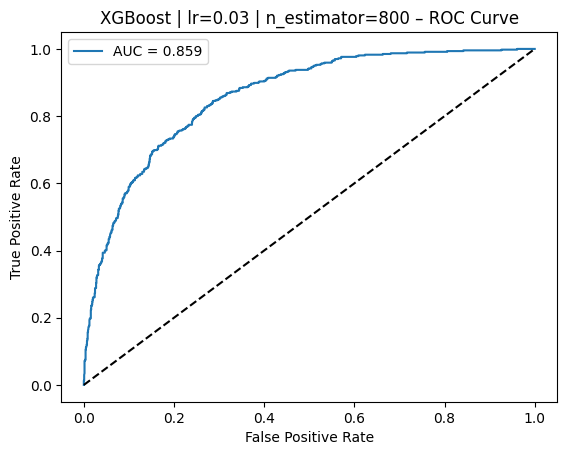

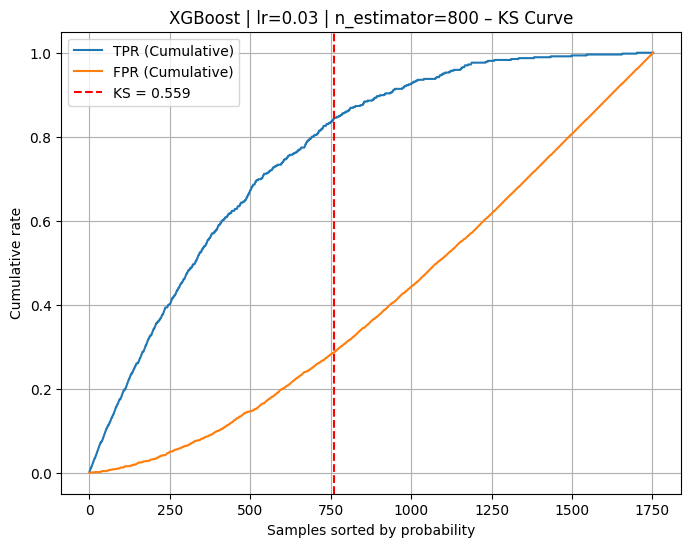

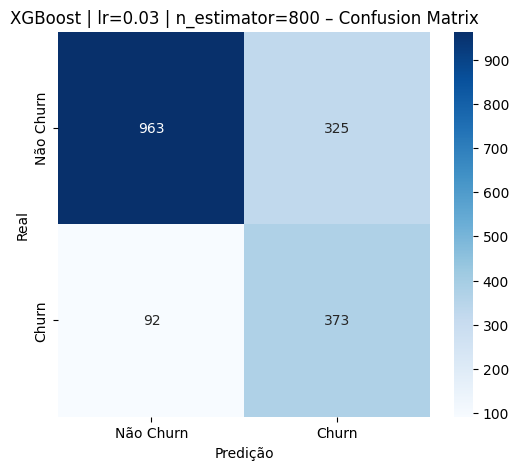

[I 2025-12-18 21:18:23,331] A new study created in memory with name: no-name-215d0d64-52c8-48e8-860f-c65d0c5251f3



===== LR = 0.03 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:18:25,049] Trial 0 finished with value: 0.5388198757763976 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 1200, 'subsample': 0.7395591325195348, 'colsample_bytree': 0.8812398619585595, 'min_child_weight': 5, 'gamma': 1.0338634502290738, 'reg_alpha': 0.027034416506505732, 'reg_lambda': 1.1080854704930565}. Best is trial 0 with value: 0.5388198757763976.
[I 2025-12-18 21:18:28,682] Trial 1 finished with value: 0.5504658385093167 and parameters: {'max_depth': 5, 'learning_rate': 0.03, 'n_estimators': 1200, 'subsample': 0.6958070357555948, 'colsample_bytree': 0.7336770290327612, 'min_child_weight': 4, 'gamma': 1.3348487469803993, 'reg_alpha': 0.6059862165106225, 'reg_lambda': 0.5550804529748897}. Best is trial 1 with value: 0.5504658385093167.
[I 2025-12-18 21:18:29,975] Trial 2 finished with value: 0.5559006211180124 and parameters: {'max_depth': 8, 'learning_rate': 0.03, 'n_estimators': 1200, 'subsample': 0.7953804265472858, 'colsample_bytree': 0

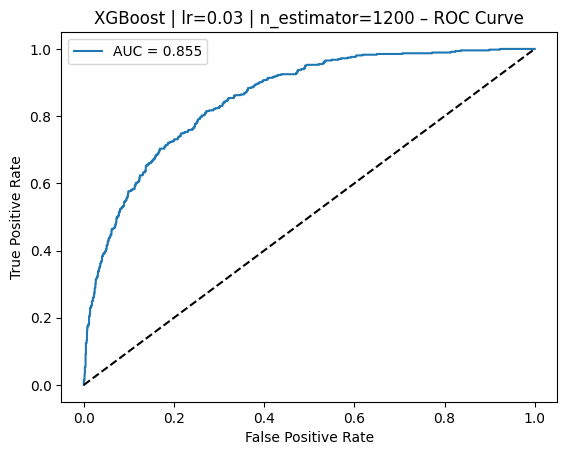

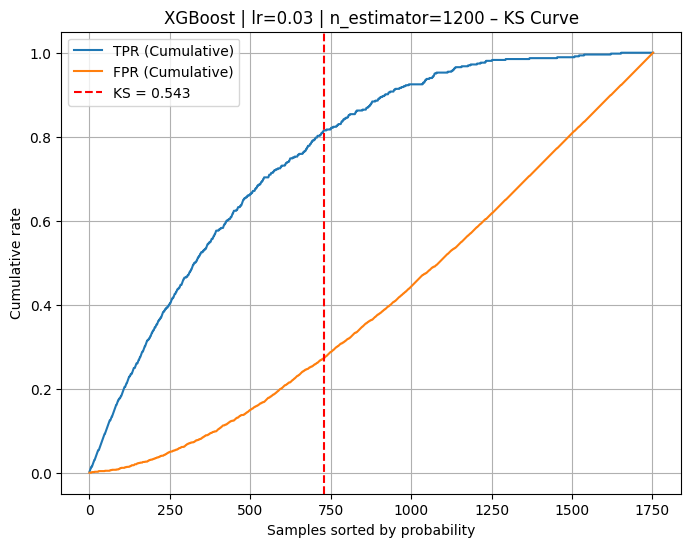

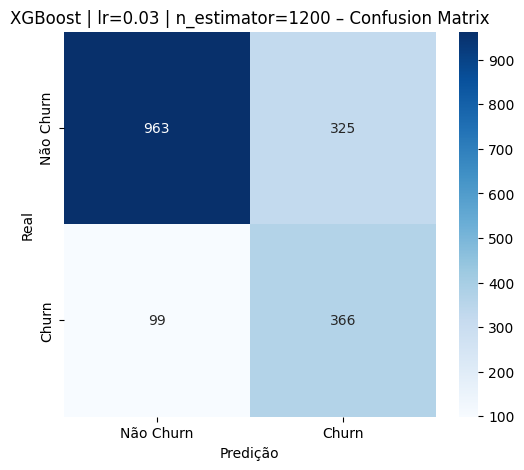

[I 2025-12-18 21:19:15,146] A new study created in memory with name: no-name-96ad429f-50a1-40e4-8ad2-afcf18d92b8e



===== LR = 0.01 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:19:15,579] Trial 0 finished with value: 0.5628881987577639 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 200, 'subsample': 0.7452009600546237, 'colsample_bytree': 0.7601853044974354, 'min_child_weight': 6, 'gamma': 3.2886714308080216, 'reg_alpha': 0.40409658871111387, 'reg_lambda': 2.925982530236751}. Best is trial 0 with value: 0.5628881987577639.
[I 2025-12-18 21:19:15,939] Trial 1 finished with value: 0.5675465838509317 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 200, 'subsample': 0.9246697001951859, 'colsample_bytree': 0.6382746811817335, 'min_child_weight': 1, 'gamma': 0.20770224384219993, 'reg_alpha': 0.6558580848607839, 'reg_lambda': 3.0242548228406942}. Best is trial 1 with value: 0.5675465838509317.
[I 2025-12-18 21:19:16,324] Trial 2 finished with value: 0.5659937888198758 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 200, 'subsample': 0.8813270524726671, 'colsample_bytree': 0.637

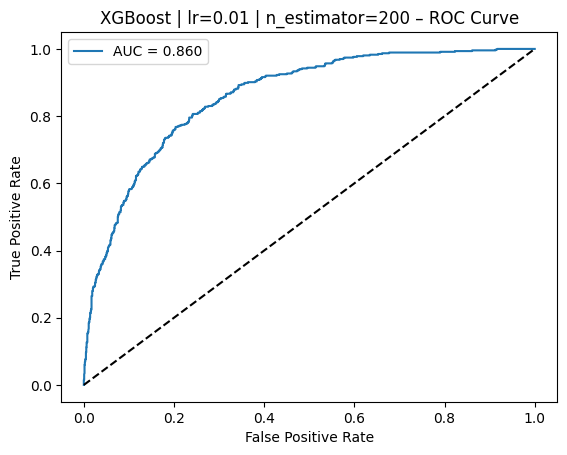

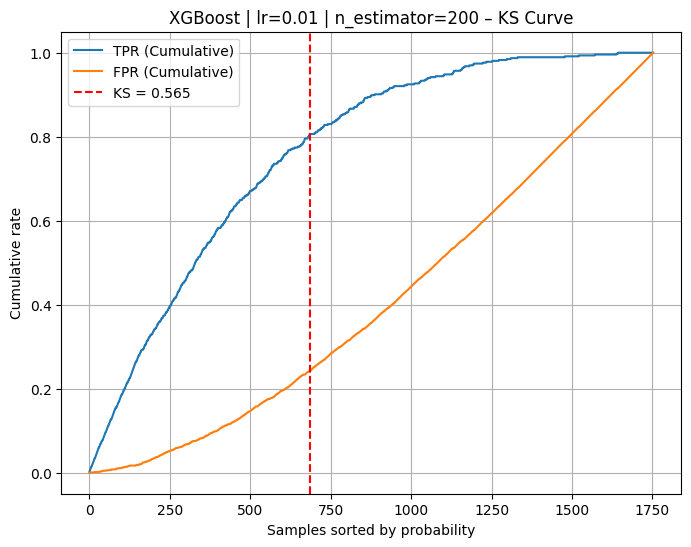

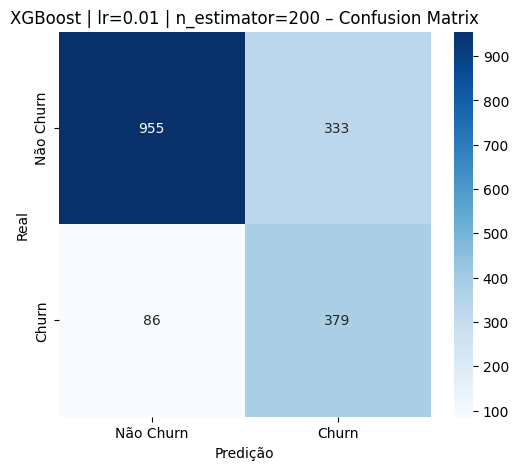

[I 2025-12-18 21:19:29,659] A new study created in memory with name: no-name-ed9c4c2c-d629-42a6-aebe-284eea2fbe85



===== LR = 0.01 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:19:30,398] Trial 0 finished with value: 0.5551242236024845 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 400, 'subsample': 0.7877128376438584, 'colsample_bytree': 0.779213655836365, 'min_child_weight': 6, 'gamma': 1.4308981047580853, 'reg_alpha': 0.6132508306872566, 'reg_lambda': 1.9464366473790342}. Best is trial 0 with value: 0.5551242236024845.
[I 2025-12-18 21:19:33,101] Trial 1 finished with value: 0.5512422360248448 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 400, 'subsample': 0.9052536665584364, 'colsample_bytree': 0.7017724213857229, 'min_child_weight': 3, 'gamma': 2.968049118926234, 'reg_alpha': 0.5830922299140445, 'reg_lambda': 4.4477242020048635}. Best is trial 0 with value: 0.5551242236024845.
[I 2025-12-18 21:19:34,096] Trial 2 finished with value: 0.5582298136645963 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 400, 'subsample': 0.8941457599241991, 'colsample_bytree': 0.660616

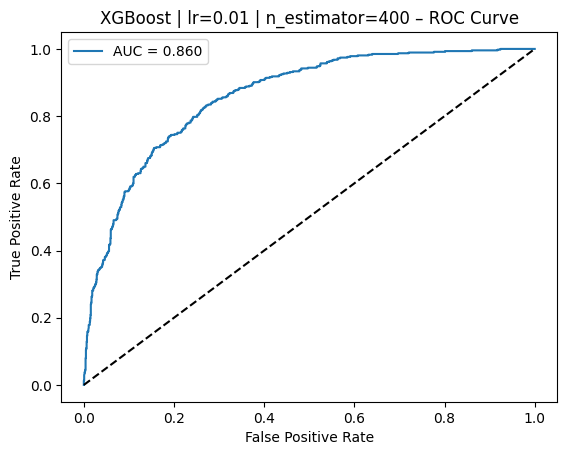

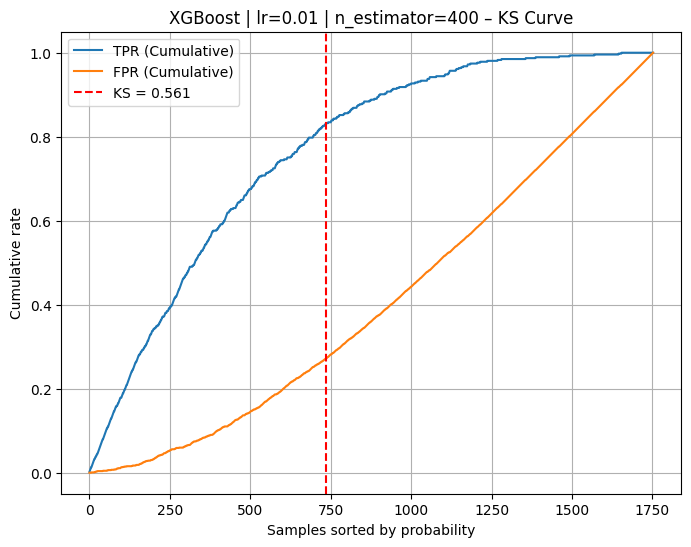

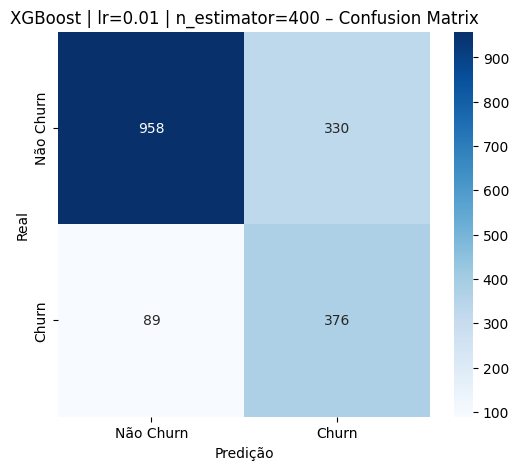

[I 2025-12-18 21:19:55,486] A new study created in memory with name: no-name-4008fae9-f101-4f00-9ace-282e1df72ee2



===== LR = 0.01 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:19:56,694] Trial 0 finished with value: 0.5489130434782609 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 800, 'subsample': 0.918121119730979, 'colsample_bytree': 0.9125773867284668, 'min_child_weight': 8, 'gamma': 2.834013368595146, 'reg_alpha': 0.5410591894610794, 'reg_lambda': 2.9297613404874117}. Best is trial 0 with value: 0.5489130434782609.
[I 2025-12-18 21:19:59,902] Trial 1 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 800, 'subsample': 0.9812570384568965, 'colsample_bytree': 0.700348484085937, 'min_child_weight': 5, 'gamma': 1.9883352553483369, 'reg_alpha': 0.18748329585701928, 'reg_lambda': 3.258576333723733}. Best is trial 1 with value: 0.5512422360248448.
[I 2025-12-18 21:20:00,938] Trial 2 finished with value: 0.5535714285714286 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 800, 'subsample': 0.8648743085390442, 'colsample_bytree': 0.6647359

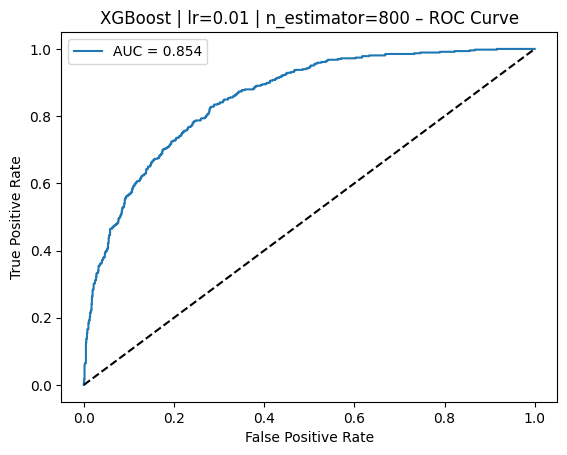

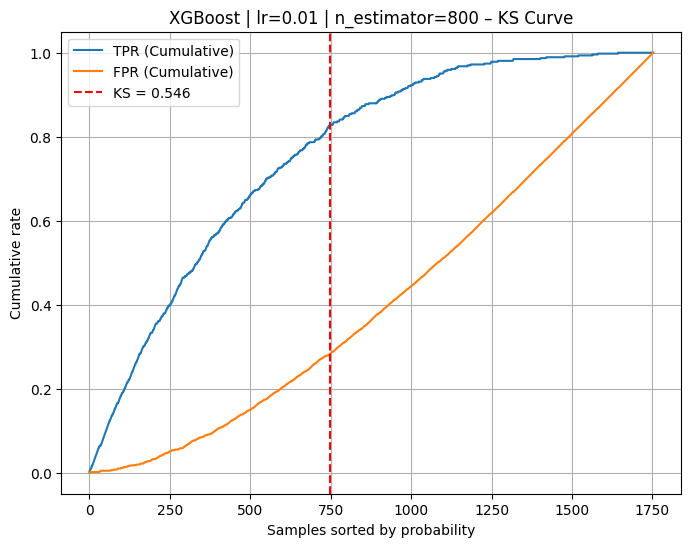

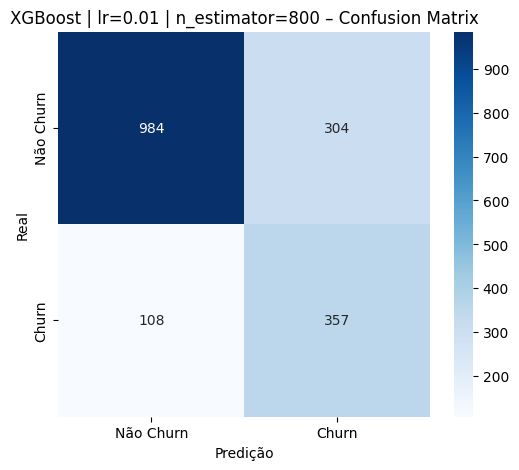

[I 2025-12-18 21:20:41,770] A new study created in memory with name: no-name-fd1b9a80-327a-4215-b093-c3836e545e8a



===== LR = 0.01 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:20:43,382] Trial 0 finished with value: 0.547360248447205 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 1200, 'subsample': 0.8735912655327249, 'colsample_bytree': 0.9436514564343255, 'min_child_weight': 6, 'gamma': 3.5392040401382765, 'reg_alpha': 0.5757505427862756, 'reg_lambda': 4.442747064669437}. Best is trial 0 with value: 0.547360248447205.
[I 2025-12-18 21:20:44,778] Trial 1 finished with value: 0.5566770186335404 and parameters: {'max_depth': 5, 'learning_rate': 0.01, 'n_estimators': 1200, 'subsample': 0.8112315627146085, 'colsample_bytree': 0.6462563891501408, 'min_child_weight': 1, 'gamma': 4.6371335450076625, 'reg_alpha': 0.7733459884187764, 'reg_lambda': 4.365066508927267}. Best is trial 1 with value: 0.5566770186335404.
[I 2025-12-18 21:20:47,230] Trial 2 finished with value: 0.5318322981366459 and parameters: {'max_depth': 8, 'learning_rate': 0.01, 'n_estimators': 1200, 'subsample': 0.941802767556144, 'colsample_bytree': 0.846482

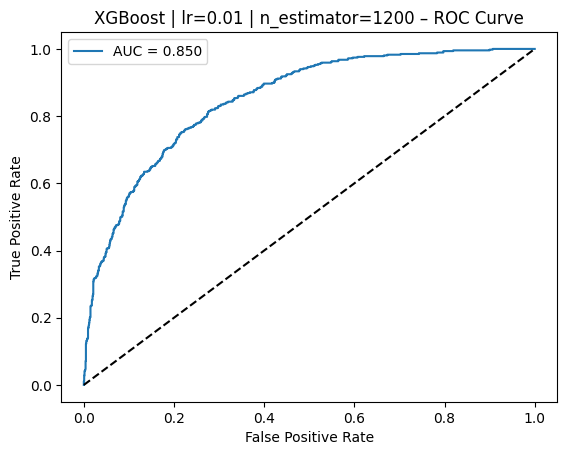

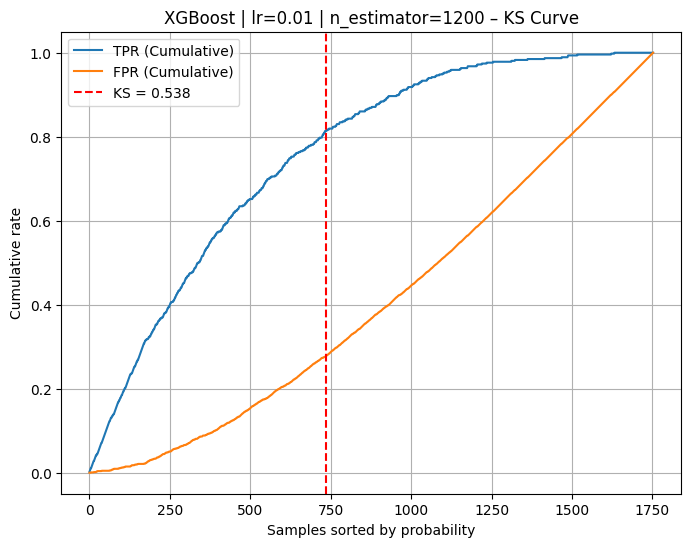

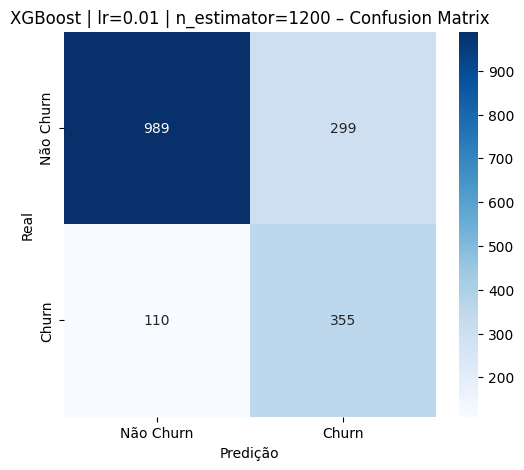

[I 2025-12-18 21:21:44,350] A new study created in memory with name: no-name-b00aa6bb-9588-49d8-8ff8-91c30f2c961f



===== LR = 0.005 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:21:44,870] Trial 0 finished with value: 0.5559006211180124 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 200, 'subsample': 0.7626042329104485, 'colsample_bytree': 0.7603216055711066, 'min_child_weight': 5, 'gamma': 1.9663467017234404, 'reg_alpha': 0.12449579809509814, 'reg_lambda': 0.9402723921611358}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 21:21:45,331] Trial 1 finished with value: 0.5520186335403727 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 200, 'subsample': 0.8887716268817545, 'colsample_bytree': 0.8697431700211053, 'min_child_weight': 6, 'gamma': 3.336399537072264, 'reg_alpha': 0.1325040848404816, 'reg_lambda': 3.258176338920027}. Best is trial 0 with value: 0.5559006211180124.
[I 2025-12-18 21:21:45,789] Trial 2 finished with value: 0.5543478260869565 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 200, 'subsample': 0.7030292942398195, 'colsample_bytree': 0.87

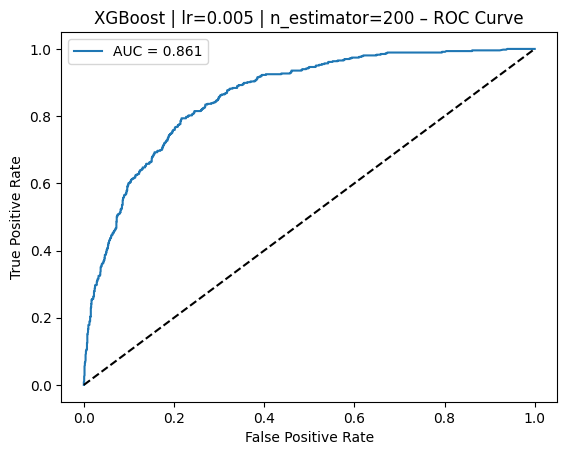

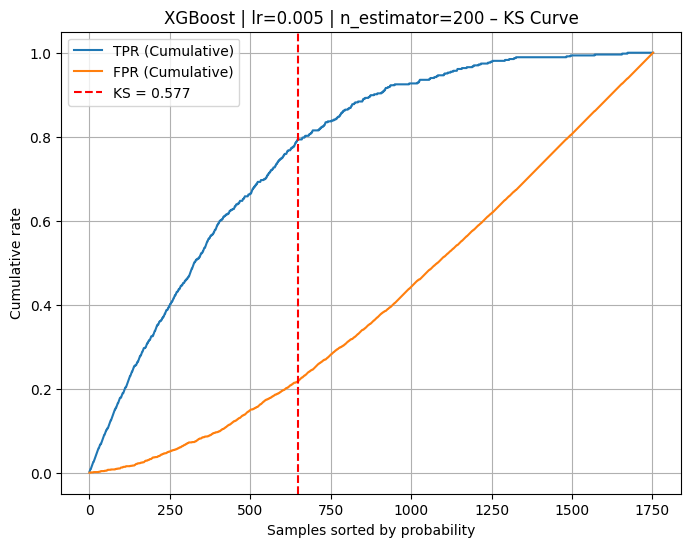

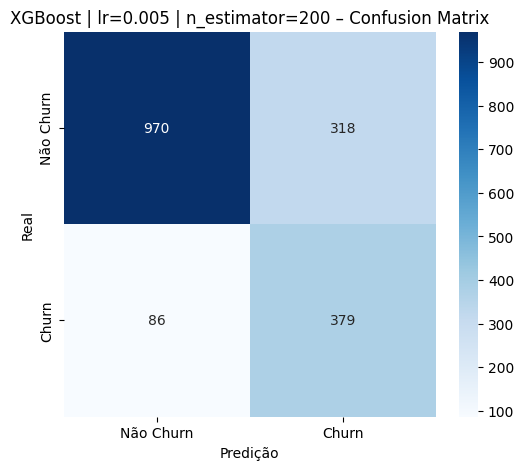

[I 2025-12-18 21:21:59,764] A new study created in memory with name: no-name-58ec46f0-1e34-40c1-a1cb-9c877c960b21



===== LR = 0.005 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:22:00,548] Trial 0 finished with value: 0.5597826086956521 and parameters: {'max_depth': 5, 'learning_rate': 0.005, 'n_estimators': 400, 'subsample': 0.7856753976989531, 'colsample_bytree': 0.6713126428200696, 'min_child_weight': 1, 'gamma': 2.304077110108138, 'reg_alpha': 0.0030066756790916305, 'reg_lambda': 1.7817393108398851}. Best is trial 0 with value: 0.5597826086956521.
[I 2025-12-18 21:22:01,492] Trial 1 finished with value: 0.5465838509316769 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 400, 'subsample': 0.8430467610861758, 'colsample_bytree': 0.941194010800936, 'min_child_weight': 5, 'gamma': 1.2098956517257387, 'reg_alpha': 0.050728958901752, 'reg_lambda': 1.8182812296593536}. Best is trial 0 with value: 0.5597826086956521.
[I 2025-12-18 21:22:02,163] Trial 2 finished with value: 0.5621118012422359 and parameters: {'max_depth': 5, 'learning_rate': 0.005, 'n_estimators': 400, 'subsample': 0.844433408754184, 'colsample_bytree': 0.74

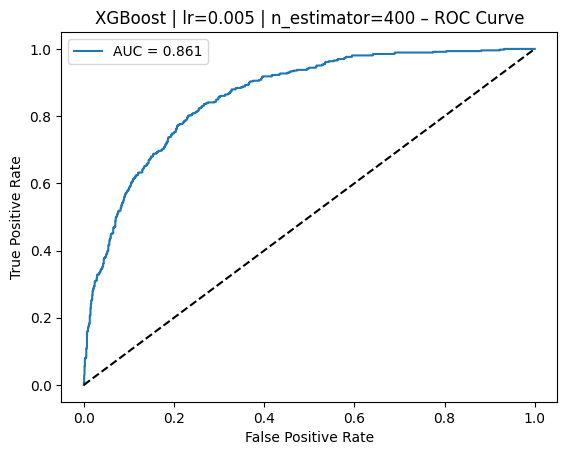

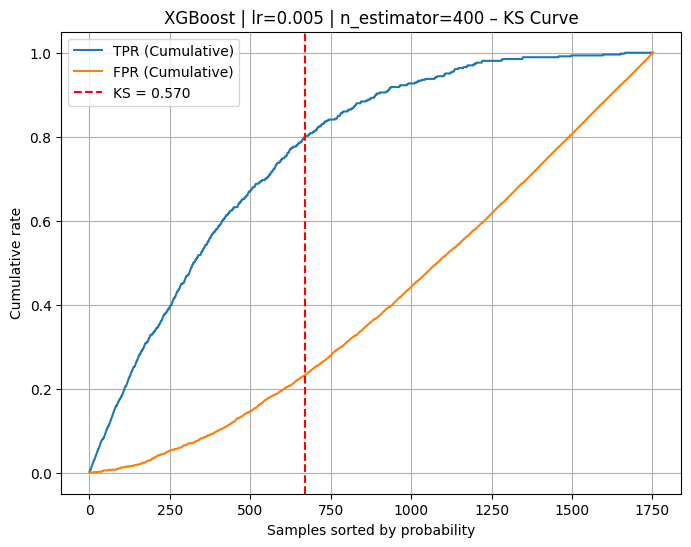

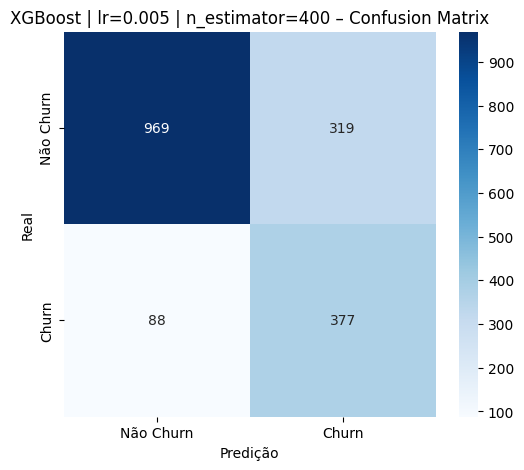

[I 2025-12-18 21:22:28,205] A new study created in memory with name: no-name-03e726ea-2ae0-49b3-9932-d4b3b7a4350a



===== LR = 0.005 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:22:29,627] Trial 0 finished with value: 0.5535714285714286 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 800, 'subsample': 0.9130700271836623, 'colsample_bytree': 0.6960454956058812, 'min_child_weight': 8, 'gamma': 3.402818511773364, 'reg_alpha': 0.5010622626419678, 'reg_lambda': 2.835470590797206}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 21:22:31,024] Trial 1 finished with value: 0.5512422360248447 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 800, 'subsample': 0.9598570050767865, 'colsample_bytree': 0.9709688164823971, 'min_child_weight': 8, 'gamma': 3.8746540432333925, 'reg_alpha': 0.3145937827175984, 'reg_lambda': 4.004393478606013}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 21:22:32,455] Trial 2 finished with value: 0.5621118012422359 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 800, 'subsample': 0.652840687440023, 'colsample_bytree': 0.60966

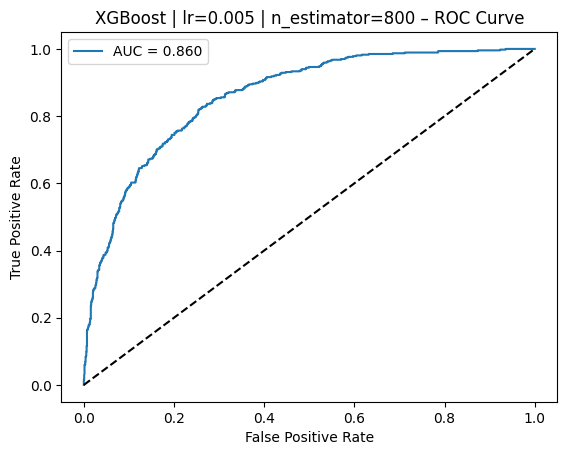

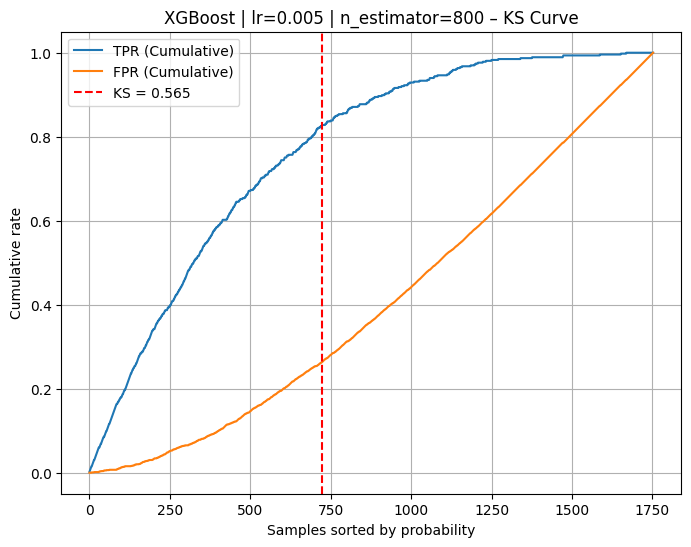

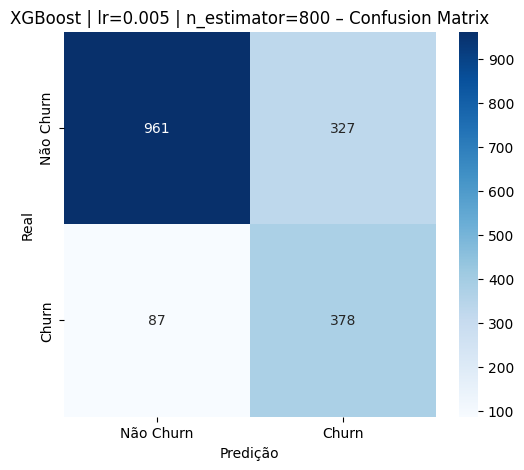

[I 2025-12-18 21:23:17,005] A new study created in memory with name: no-name-a4c9203f-97ad-48c1-a681-de69f8180c80



===== LR = 0.005 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:23:18,870] Trial 0 finished with value: 0.5535714285714286 and parameters: {'max_depth': 5, 'learning_rate': 0.005, 'n_estimators': 1200, 'subsample': 0.677025770203301, 'colsample_bytree': 0.8387978475510771, 'min_child_weight': 10, 'gamma': 2.031023300379279, 'reg_alpha': 0.4429407561226413, 'reg_lambda': 4.39723203982542}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 21:23:20,727] Trial 1 finished with value: 0.5574534161490683 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 1200, 'subsample': 0.8210420921908573, 'colsample_bytree': 0.8590284320981332, 'min_child_weight': 3, 'gamma': 3.7450627693870056, 'reg_alpha': 0.24072467883810056, 'reg_lambda': 1.938771590861124}. Best is trial 1 with value: 0.5574534161490683.
[I 2025-12-18 21:23:22,939] Trial 2 finished with value: 0.547360248447205 and parameters: {'max_depth': 8, 'learning_rate': 0.005, 'n_estimators': 1200, 'subsample': 0.8424743210172136, 'colsample_bytree': 0.87

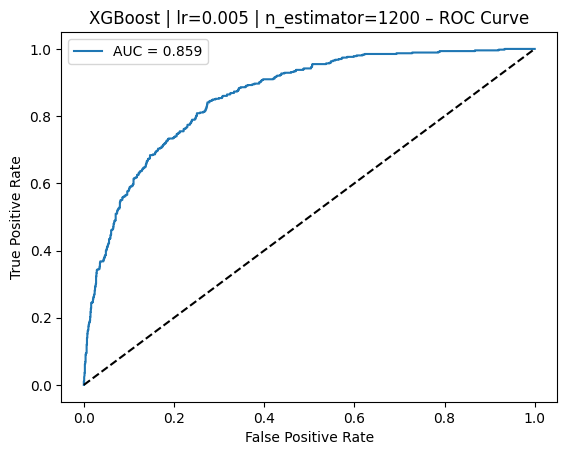

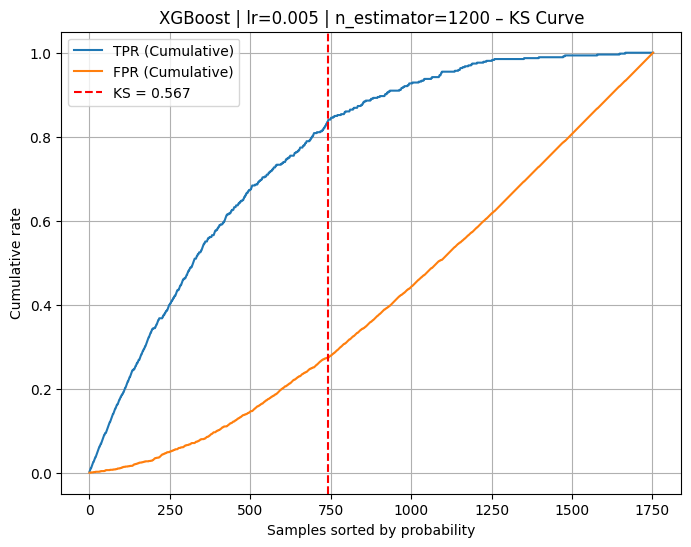

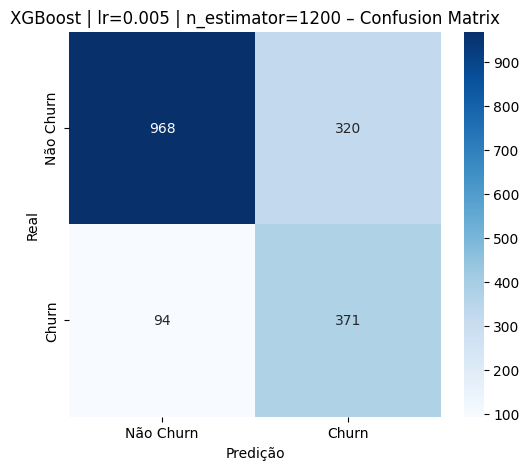

[I 2025-12-18 21:24:24,633] A new study created in memory with name: no-name-41c0343f-a638-4c0e-8cb8-292f1780cfcc



===== LR = 0.001 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:24:25,115] Trial 0 finished with value: 0.5613354037267081 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 200, 'subsample': 0.9194885006820326, 'colsample_bytree': 0.6662132789349323, 'min_child_weight': 2, 'gamma': 4.612034441838308, 'reg_alpha': 0.5823343023605719, 'reg_lambda': 3.3471671279518396}. Best is trial 0 with value: 0.5613354037267081.
[I 2025-12-18 21:24:25,581] Trial 1 finished with value: 0.56055900621118 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 200, 'subsample': 0.8783577067933944, 'colsample_bytree': 0.7230727065351221, 'min_child_weight': 10, 'gamma': 2.3703516741562316, 'reg_alpha': 0.3850591721012394, 'reg_lambda': 1.2611579272651727}. Best is trial 0 with value: 0.5613354037267081.
[I 2025-12-18 21:24:26,011] Trial 2 finished with value: 0.5590062111801243 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 200, 'subsample': 0.6311050795438703, 'colsample_bytree': 0.843

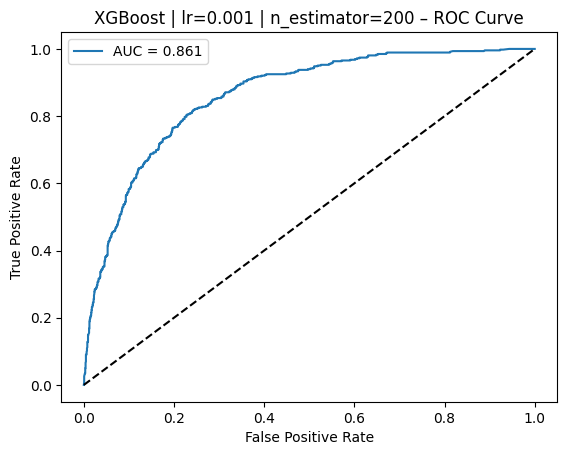

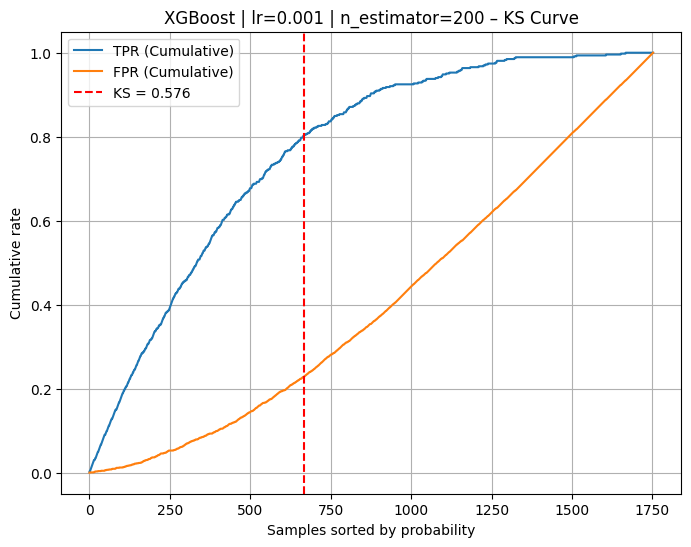

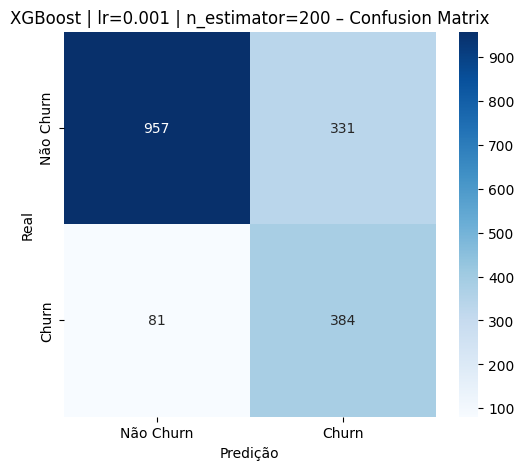

[I 2025-12-18 21:24:39,806] A new study created in memory with name: no-name-c28ec6ae-0c87-41fa-9903-97f417867cf9



===== LR = 0.001 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:24:40,607] Trial 0 finished with value: 0.562111801242236 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 400, 'subsample': 0.8671198988351658, 'colsample_bytree': 0.7671183664007264, 'min_child_weight': 3, 'gamma': 0.1629676154334031, 'reg_alpha': 0.4596143052532503, 'reg_lambda': 1.3505529783567098}. Best is trial 0 with value: 0.562111801242236.
[I 2025-12-18 21:24:41,573] Trial 1 finished with value: 0.5349378881987578 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 400, 'subsample': 0.9288811515666787, 'colsample_bytree': 0.9653099290281917, 'min_child_weight': 5, 'gamma': 0.012017536940255313, 'reg_alpha': 0.8039462831906771, 'reg_lambda': 1.7263248118764345}. Best is trial 0 with value: 0.562111801242236.
[I 2025-12-18 21:24:42,283] Trial 2 finished with value: 0.562888198757764 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 400, 'subsample': 0.6295178910832501, 'colsample_bytree': 0.782

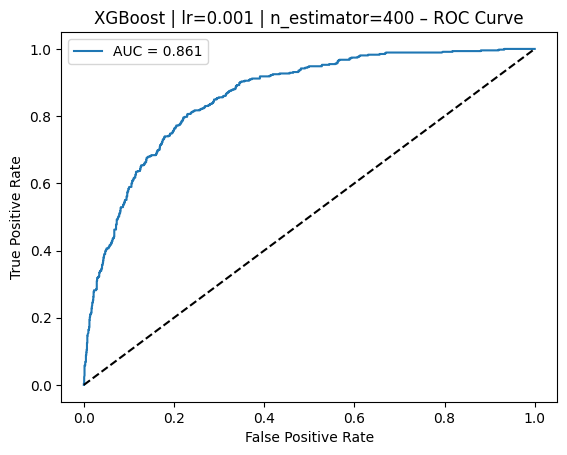

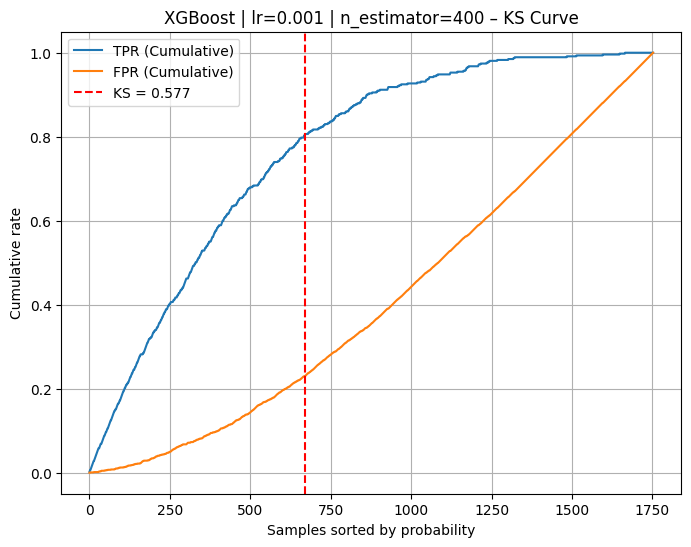

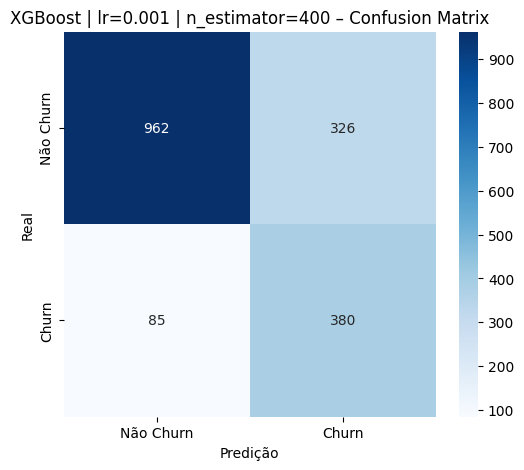

[I 2025-12-18 21:25:07,730] A new study created in memory with name: no-name-cb6ceddf-5791-493e-bf97-6e71b5b3b431



===== LR = 0.001 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:25:09,893] Trial 0 finished with value: 0.5652173913043479 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 800, 'subsample': 0.6002040984218538, 'colsample_bytree': 0.6105369207107231, 'min_child_weight': 9, 'gamma': 1.0748954520239606, 'reg_alpha': 0.7673631740274789, 'reg_lambda': 2.145051392648444}. Best is trial 0 with value: 0.5652173913043479.
[I 2025-12-18 21:25:12,939] Trial 1 finished with value: 0.5543478260869565 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 800, 'subsample': 0.759110990586964, 'colsample_bytree': 0.8069688378015699, 'min_child_weight': 6, 'gamma': 0.8369017107993532, 'reg_alpha': 0.09780347625070662, 'reg_lambda': 2.571494083477526}. Best is trial 0 with value: 0.5652173913043479.
[I 2025-12-18 21:25:14,302] Trial 2 finished with value: 0.5605590062111802 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 800, 'subsample': 0.7586084372928243, 'colsample_bytree': 0.992

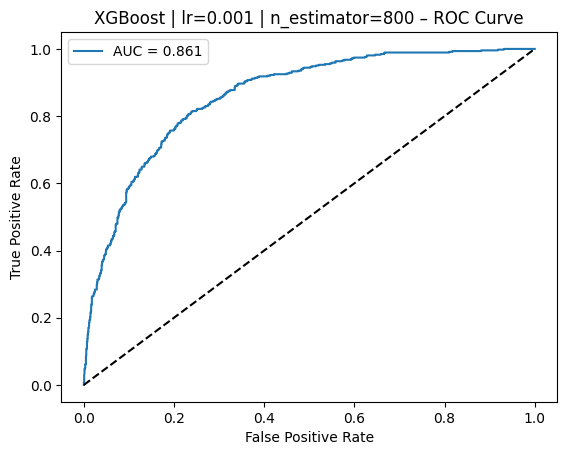

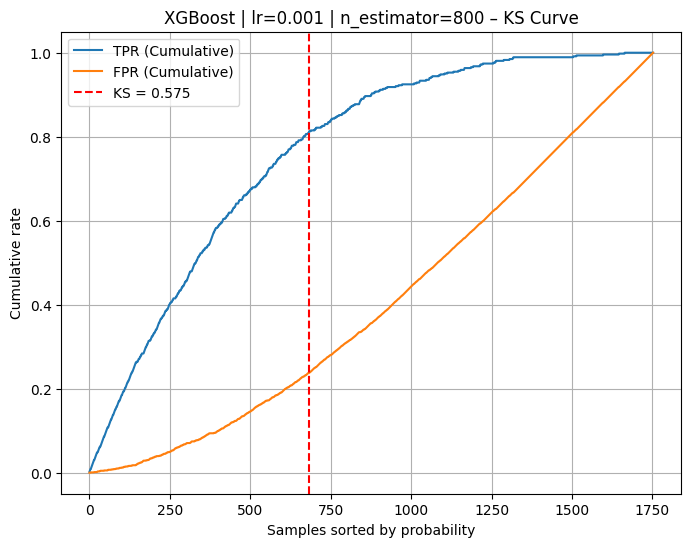

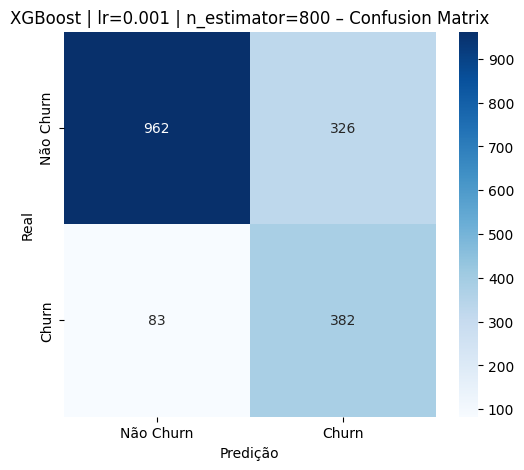

[I 2025-12-18 21:26:04,670] A new study created in memory with name: no-name-f0ef4e14-8849-46a4-a80a-9a7ba5e226aa



===== LR = 0.001 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:26:06,979] Trial 0 finished with value: 0.5722049689440994 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 1200, 'subsample': 0.6043515385738182, 'colsample_bytree': 0.6306667418258066, 'min_child_weight': 8, 'gamma': 2.2654040648360945, 'reg_alpha': 0.04145150814465237, 'reg_lambda': 1.0375651578884737}. Best is trial 0 with value: 0.5722049689440994.
[I 2025-12-18 21:26:09,000] Trial 1 finished with value: 0.5520186335403727 and parameters: {'max_depth': 5, 'learning_rate': 0.001, 'n_estimators': 1200, 'subsample': 0.7064627740966896, 'colsample_bytree': 0.8805771783008308, 'min_child_weight': 8, 'gamma': 1.963605593168699, 'reg_alpha': 0.14846237195569334, 'reg_lambda': 0.912469471486298}. Best is trial 0 with value: 0.5722049689440994.
[I 2025-12-18 21:26:11,621] Trial 2 finished with value: 0.5434782608695652 and parameters: {'max_depth': 8, 'learning_rate': 0.001, 'n_estimators': 1200, 'subsample': 0.8815051390516238, 'colsample_bytree': 

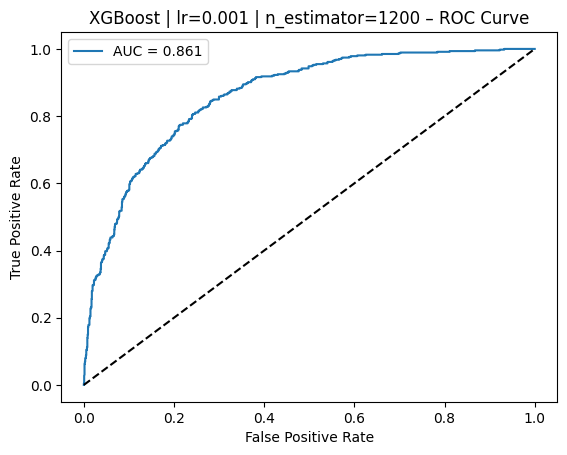

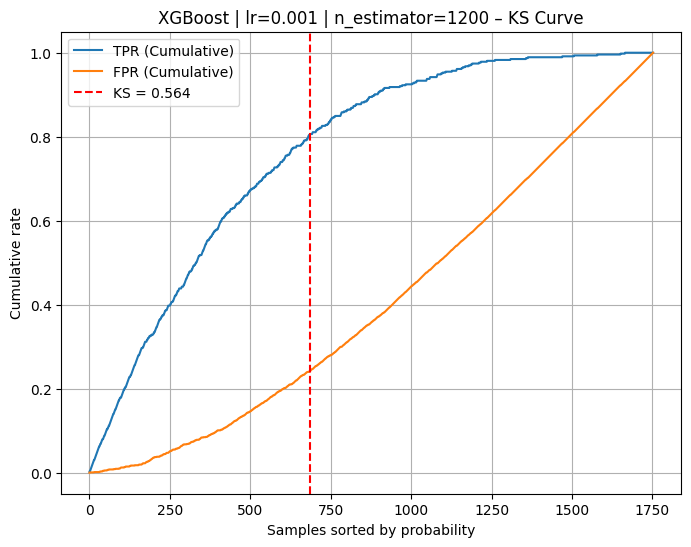

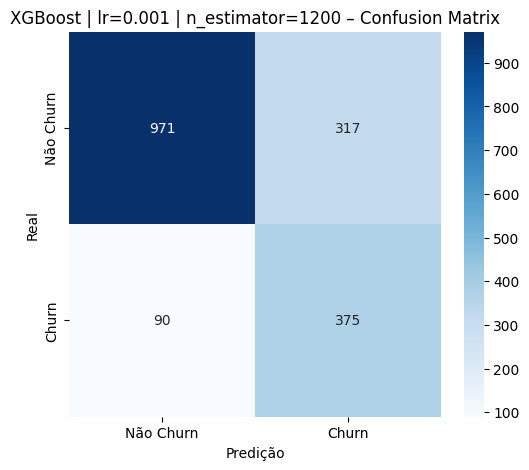

[I 2025-12-18 21:27:26,125] A new study created in memory with name: no-name-1da02c22-a322-4673-ac6b-af012d91e16b



===== LR = 0.0005 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:27:26,599] Trial 0 finished with value: 0.5667701863354038 and parameters: {'max_depth': 5, 'learning_rate': 0.0005, 'n_estimators': 200, 'subsample': 0.6014221696469618, 'colsample_bytree': 0.7441416874173894, 'min_child_weight': 10, 'gamma': 1.7027271786221698, 'reg_alpha': 0.201204955268653, 'reg_lambda': 0.9001358370350727}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:27:27,087] Trial 1 finished with value: 0.5675465838509317 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 200, 'subsample': 0.84184784096813, 'colsample_bytree': 0.636557611457509, 'min_child_weight': 2, 'gamma': 1.8067801341920546, 'reg_alpha': 0.9298693612774691, 'reg_lambda': 3.460888728750108}. Best is trial 1 with value: 0.5675465838509317.
[I 2025-12-18 21:27:27,475] Trial 2 finished with value: 0.5675465838509317 and parameters: {'max_depth': 5, 'learning_rate': 0.0005, 'n_estimators': 200, 'subsample': 0.6278058033377522, 'colsample_bytree': 0.72

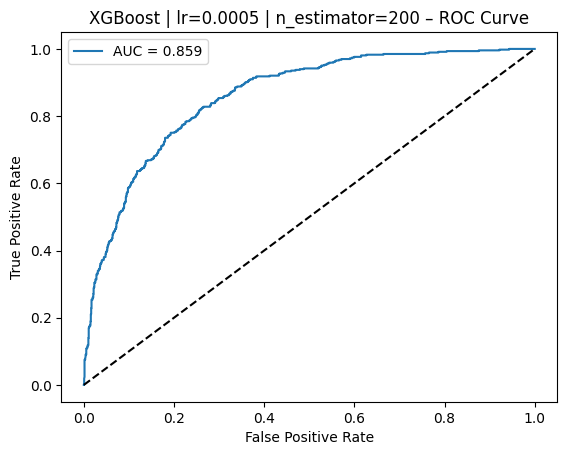

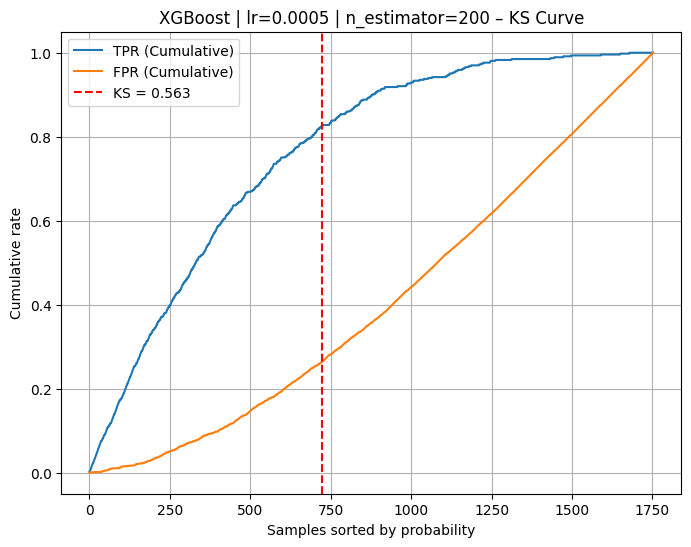

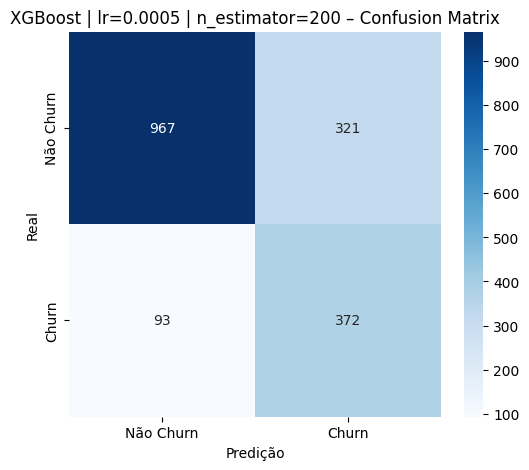

[I 2025-12-18 21:27:42,363] A new study created in memory with name: no-name-37781820-7e3b-45bd-99af-acbdbbf4f7a3



===== LR = 0.0005 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:27:43,155] Trial 0 finished with value: 0.56444099378882 and parameters: {'max_depth': 5, 'learning_rate': 0.0005, 'n_estimators': 400, 'subsample': 0.7669972234289099, 'colsample_bytree': 0.622711870482106, 'min_child_weight': 2, 'gamma': 4.524757530333971, 'reg_alpha': 0.08527380125670714, 'reg_lambda': 2.0779950744630002}. Best is trial 0 with value: 0.56444099378882.
[I 2025-12-18 21:27:43,930] Trial 1 finished with value: 0.5706521739130435 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 400, 'subsample': 0.8099357382203499, 'colsample_bytree': 0.6455631102300621, 'min_child_weight': 8, 'gamma': 4.563578218604683, 'reg_alpha': 0.4423296241613649, 'reg_lambda': 2.6985014558837044}. Best is trial 1 with value: 0.5706521739130435.
[I 2025-12-18 21:27:44,856] Trial 2 finished with value: 0.5559006211180124 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 400, 'subsample': 0.6889574642029047, 'colsample_bytree': 0.8457

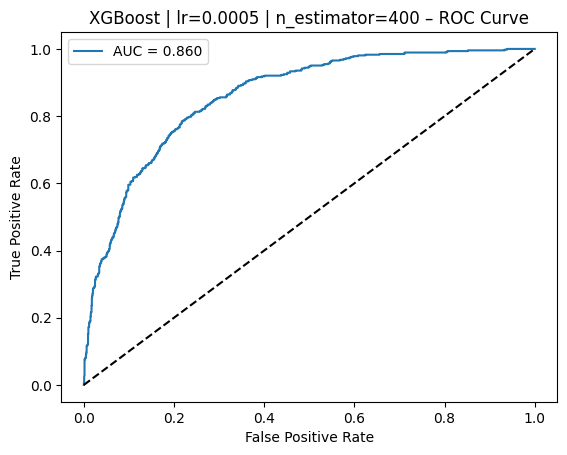

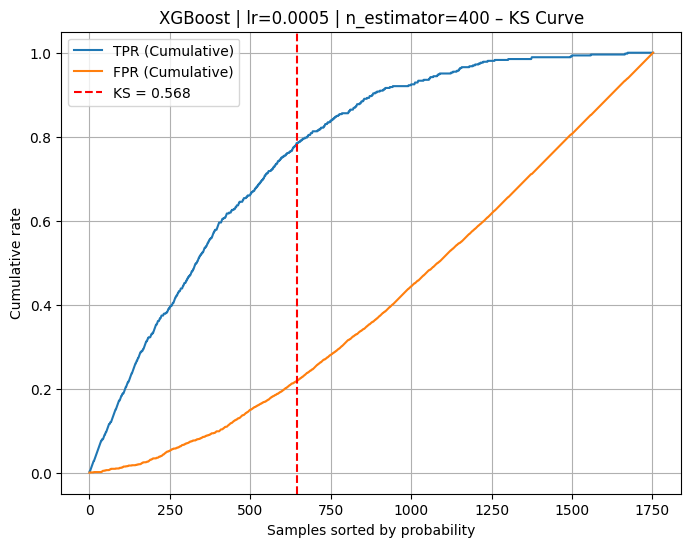

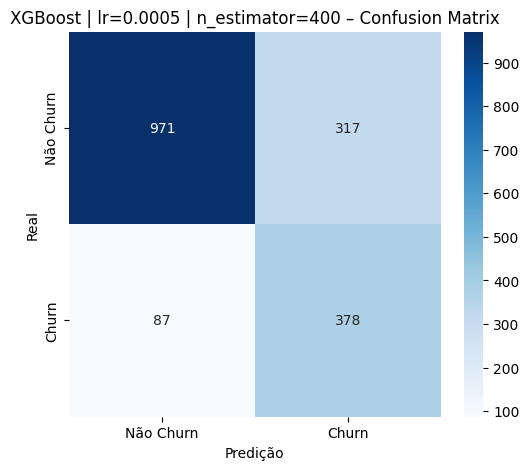

[I 2025-12-18 21:28:12,176] A new study created in memory with name: no-name-6656c0fe-0507-4506-95bb-c304979fd720



===== LR = 0.0005 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:28:15,653] Trial 0 finished with value: 0.5504658385093167 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 800, 'subsample': 0.7381141620291927, 'colsample_bytree': 0.9969479327042674, 'min_child_weight': 8, 'gamma': 1.2191843896989392, 'reg_alpha': 0.5124634520863462, 'reg_lambda': 4.383604663918656}. Best is trial 0 with value: 0.5504658385093167.
[I 2025-12-18 21:28:17,040] Trial 1 finished with value: 0.5582298136645962 and parameters: {'max_depth': 5, 'learning_rate': 0.0005, 'n_estimators': 800, 'subsample': 0.6657208400857452, 'colsample_bytree': 0.9293971631055605, 'min_child_weight': 7, 'gamma': 4.183041992047017, 'reg_alpha': 0.06101452654085626, 'reg_lambda': 2.331905621372589}. Best is trial 1 with value: 0.5582298136645962.
[I 2025-12-18 21:28:18,871] Trial 2 finished with value: 0.5419254658385093 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 800, 'subsample': 0.9499751823165091, 'colsample_bytree': 0.

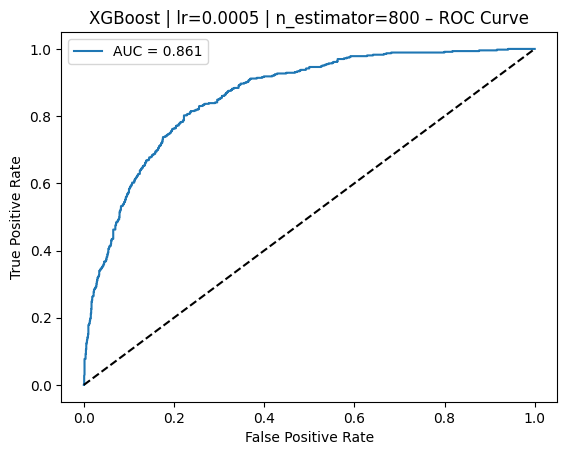

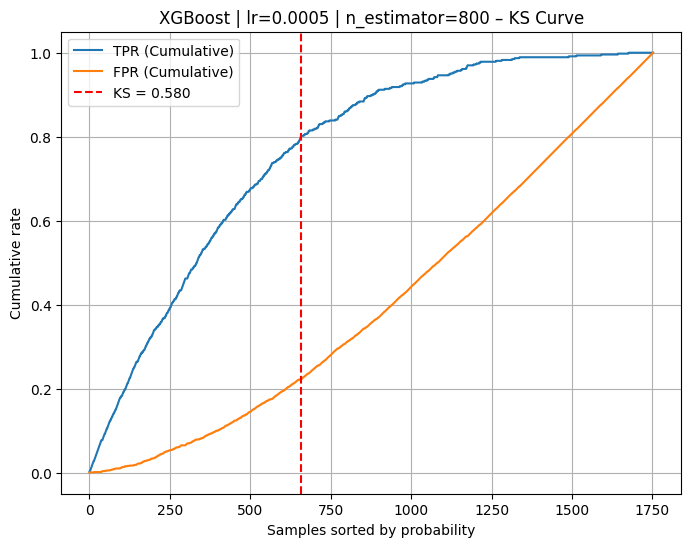

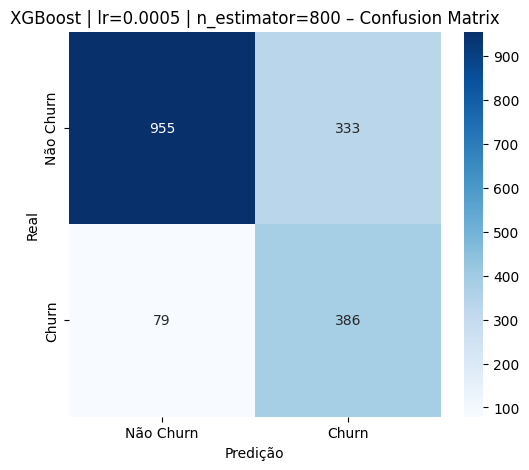

[I 2025-12-18 21:29:06,930] A new study created in memory with name: no-name-0bbc3d0f-3c0b-462c-ae6b-a151ac591f3f



===== LR = 0.0005 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:29:09,312] Trial 0 finished with value: 0.5590062111801243 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 1200, 'subsample': 0.9996286071590839, 'colsample_bytree': 0.7429164375399463, 'min_child_weight': 10, 'gamma': 4.467101865593934, 'reg_alpha': 0.11320262422741867, 'reg_lambda': 1.0487550961447325}. Best is trial 0 with value: 0.5590062111801243.
[I 2025-12-18 21:29:11,328] Trial 1 finished with value: 0.5597826086956521 and parameters: {'max_depth': 5, 'learning_rate': 0.0005, 'n_estimators': 1200, 'subsample': 0.8540857004652492, 'colsample_bytree': 0.9089536551003263, 'min_child_weight': 1, 'gamma': 3.8445410348748865, 'reg_alpha': 0.835776749309737, 'reg_lambda': 3.9433192185531776}. Best is trial 1 with value: 0.5597826086956521.
[I 2025-12-18 21:29:13,623] Trial 2 finished with value: 0.5652173913043479 and parameters: {'max_depth': 8, 'learning_rate': 0.0005, 'n_estimators': 1200, 'subsample': 0.6411263284705425, 'colsample_bytree

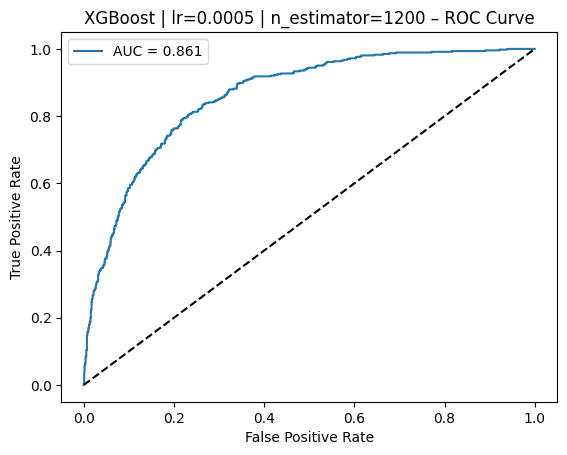

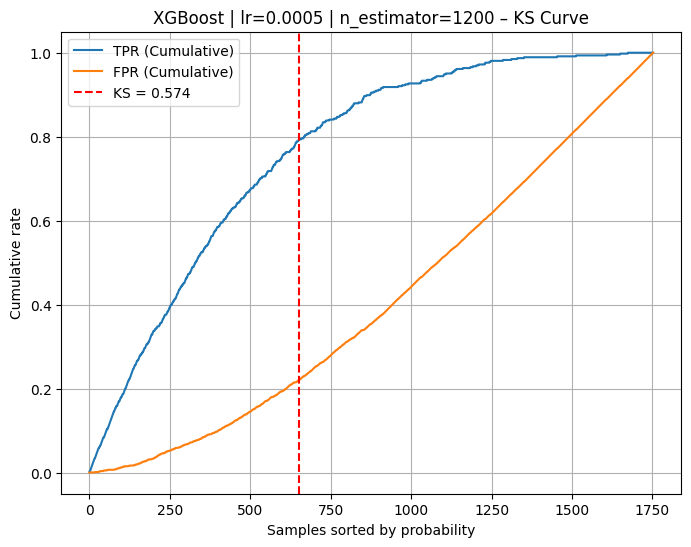

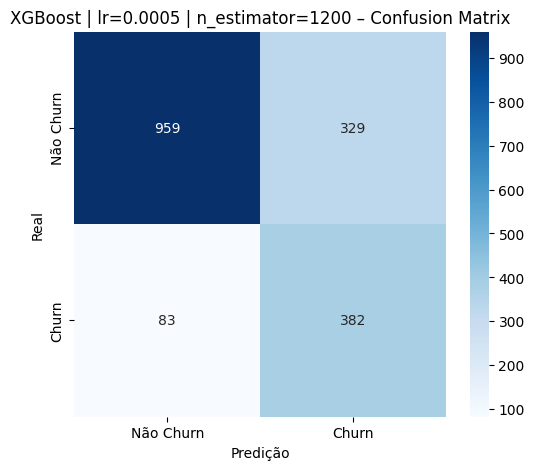

[I 2025-12-18 21:30:27,878] A new study created in memory with name: no-name-d13589c6-8789-4602-9db7-019ff87539f9



===== LR = 0.0001 ===== N_ESTIMATOR = 200


[I 2025-12-18 21:30:28,380] Trial 0 finished with value: 0.5667701863354038 and parameters: {'max_depth': 5, 'learning_rate': 0.0001, 'n_estimators': 200, 'subsample': 0.8855872447502917, 'colsample_bytree': 0.7468380690719082, 'min_child_weight': 9, 'gamma': 4.751398425915731, 'reg_alpha': 0.8107353070400741, 'reg_lambda': 3.93374653772453}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:30:28,836] Trial 1 finished with value: 0.5551242236024845 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 200, 'subsample': 0.7994307251804781, 'colsample_bytree': 0.8174665779636742, 'min_child_weight': 10, 'gamma': 1.881669217701144, 'reg_alpha': 0.43461516045208215, 'reg_lambda': 4.591682150958749}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:30:29,327] Trial 2 finished with value: 0.5481366459627329 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 200, 'subsample': 0.7376547235579798, 'colsample_bytree': 0.9

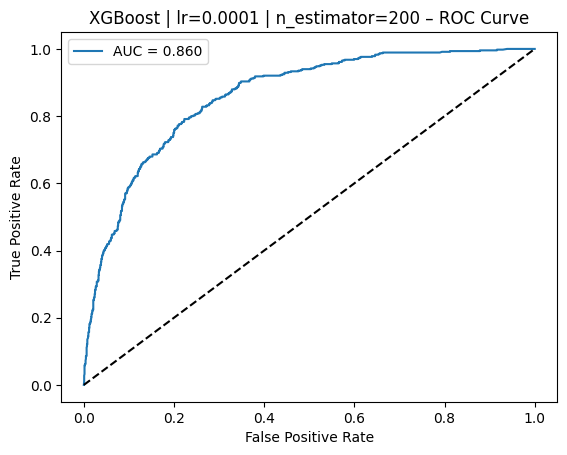

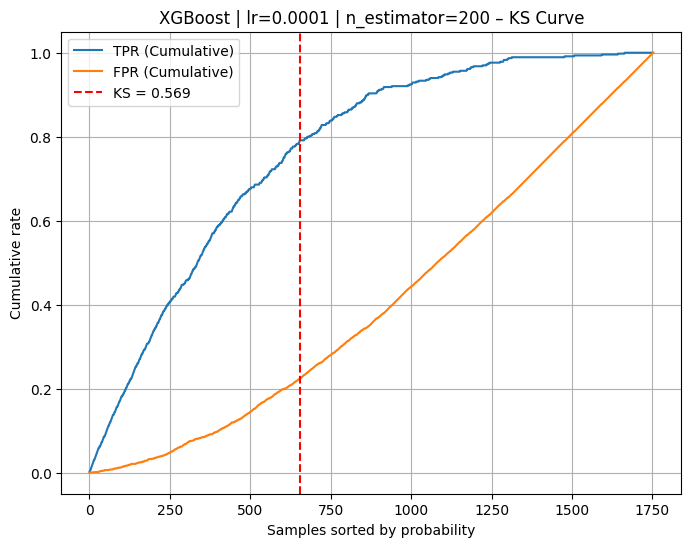

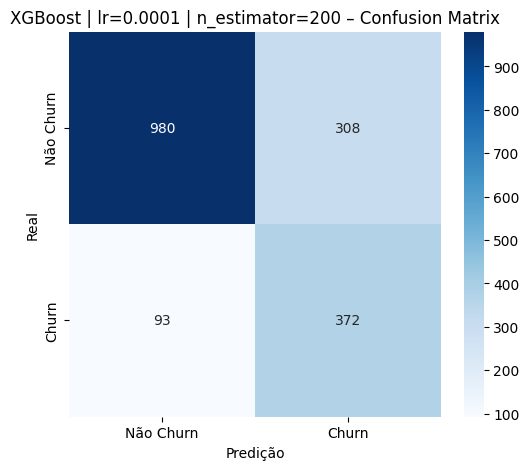

[I 2025-12-18 21:30:44,145] A new study created in memory with name: no-name-6bc647c5-9486-4f51-a52c-ee896c291ba9



===== LR = 0.0001 ===== N_ESTIMATOR = 400


[I 2025-12-18 21:30:44,983] Trial 0 finished with value: 0.5667701863354038 and parameters: {'max_depth': 5, 'learning_rate': 0.0001, 'n_estimators': 400, 'subsample': 0.7869842143628731, 'colsample_bytree': 0.6934955506874603, 'min_child_weight': 5, 'gamma': 1.5845136207806658, 'reg_alpha': 0.285561050992692, 'reg_lambda': 1.04189099282249}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:30:45,873] Trial 1 finished with value: 0.5613354037267081 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 400, 'subsample': 0.7630336752588556, 'colsample_bytree': 0.6844722403910273, 'min_child_weight': 4, 'gamma': 0.26718827719689253, 'reg_alpha': 0.8167492773293152, 'reg_lambda': 3.7963907197796516}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:30:46,647] Trial 2 finished with value: 0.5574534161490683 and parameters: {'max_depth': 5, 'learning_rate': 0.0001, 'n_estimators': 400, 'subsample': 0.6285850094859391, 'colsample_bytree': 0.

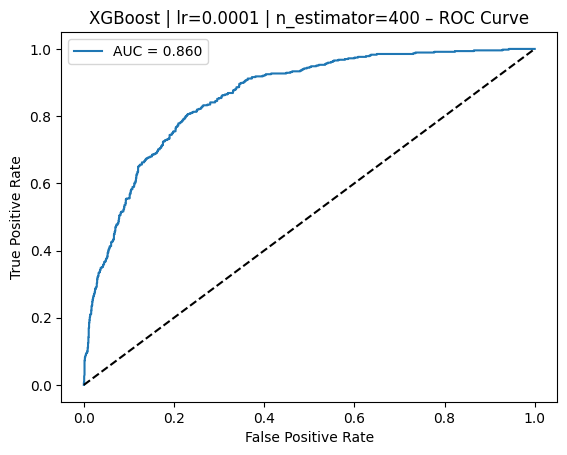

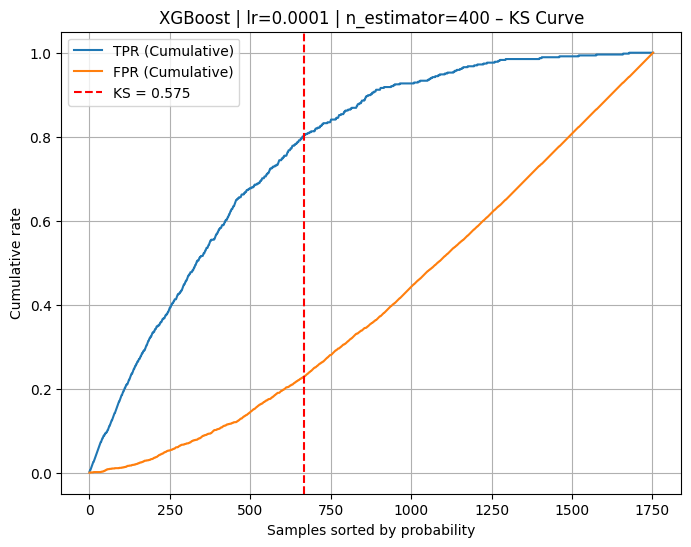

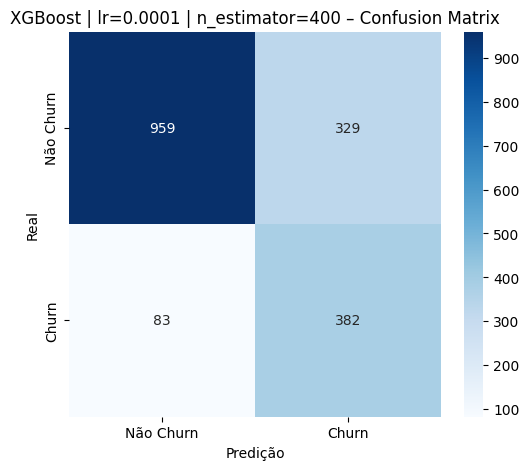

[I 2025-12-18 21:31:12,121] A new study created in memory with name: no-name-b071d87d-3754-494b-915b-2636c63ad9c9



===== LR = 0.0001 ===== N_ESTIMATOR = 800


[I 2025-12-18 21:31:13,553] Trial 0 finished with value: 0.5667701863354038 and parameters: {'max_depth': 5, 'learning_rate': 0.0001, 'n_estimators': 800, 'subsample': 0.6273487148088034, 'colsample_bytree': 0.7531799503200424, 'min_child_weight': 10, 'gamma': 4.298835539870868, 'reg_alpha': 0.2914433873488149, 'reg_lambda': 0.6896042345009086}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:31:16,963] Trial 1 finished with value: 0.5613354037267081 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 800, 'subsample': 0.7319116067178011, 'colsample_bytree': 0.829337146895533, 'min_child_weight': 10, 'gamma': 3.0907957892194187, 'reg_alpha': 0.4073007642566203, 'reg_lambda': 3.6230818083191236}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:31:18,695] Trial 2 finished with value: 0.5574534161490683 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 800, 'subsample': 0.7540273943394294, 'colsample_bytree': 

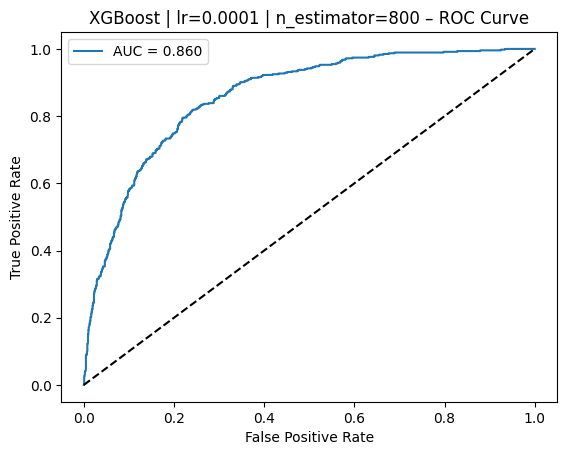

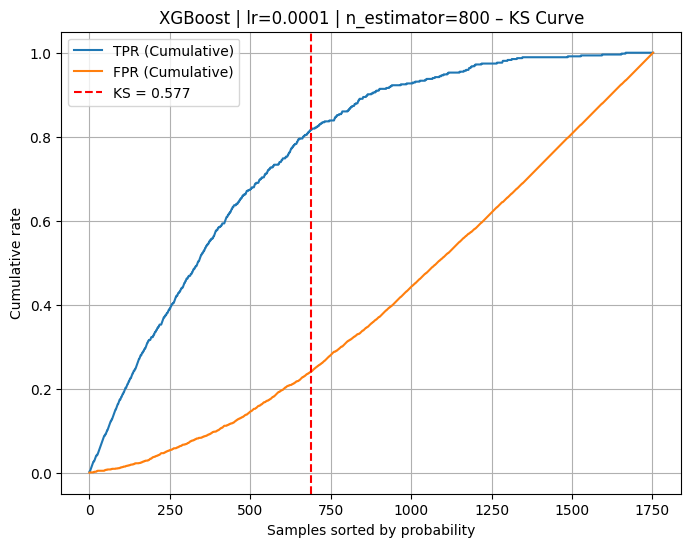

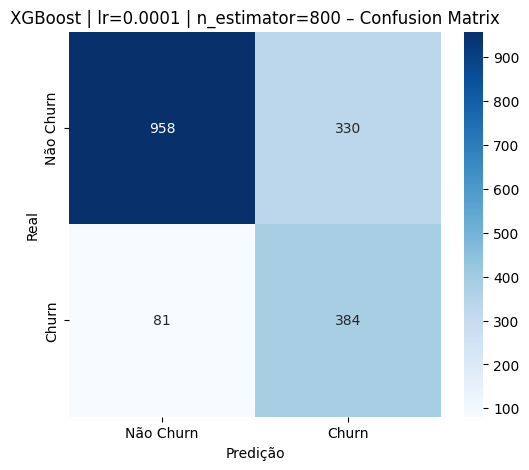

[I 2025-12-18 21:32:05,469] A new study created in memory with name: no-name-e824f3f8-3f66-429c-9dbe-650028a52e9c



===== LR = 0.0001 ===== N_ESTIMATOR = 1200


[I 2025-12-18 21:32:09,639] Trial 0 finished with value: 0.5597826086956522 and parameters: {'max_depth': 5, 'learning_rate': 0.0001, 'n_estimators': 1200, 'subsample': 0.6980724059844342, 'colsample_bytree': 0.8407285898506487, 'min_child_weight': 10, 'gamma': 4.591056476369737, 'reg_alpha': 0.5170990499972862, 'reg_lambda': 4.754785576257335}. Best is trial 0 with value: 0.5597826086956522.
[I 2025-12-18 21:32:12,083] Trial 1 finished with value: 0.5535714285714286 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 1200, 'subsample': 0.6588672007229088, 'colsample_bytree': 0.8791956327245922, 'min_child_weight': 1, 'gamma': 3.2040226566989753, 'reg_alpha': 0.8538923865840252, 'reg_lambda': 3.0050457108421824}. Best is trial 0 with value: 0.5597826086956522.
[I 2025-12-18 21:32:14,876] Trial 2 finished with value: 0.53027950310559 and parameters: {'max_depth': 8, 'learning_rate': 0.0001, 'n_estimators': 1200, 'subsample': 0.9568593704089675, 'colsample_bytree': 

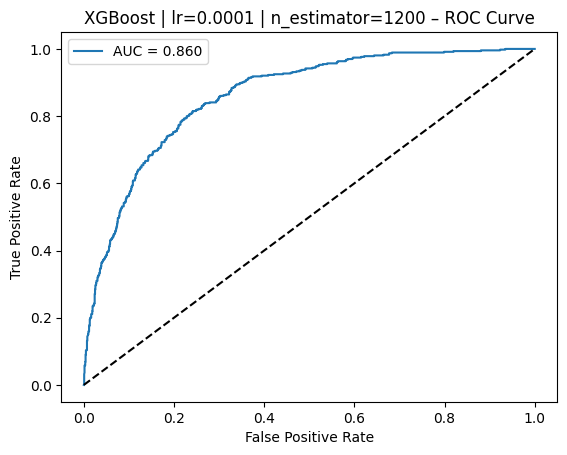

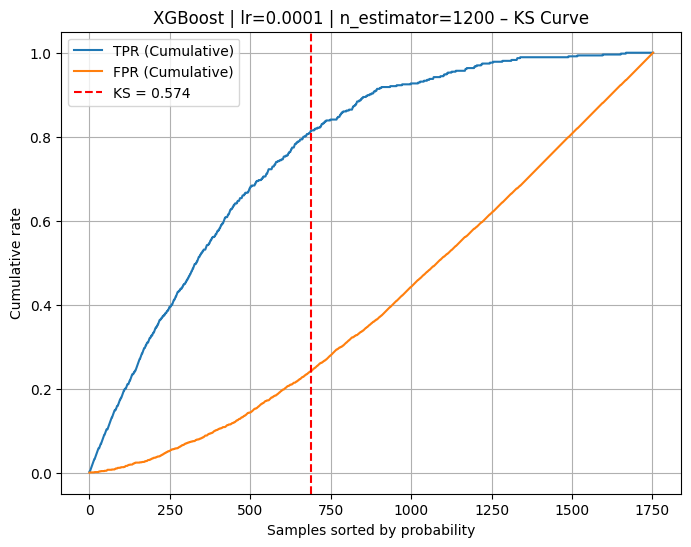

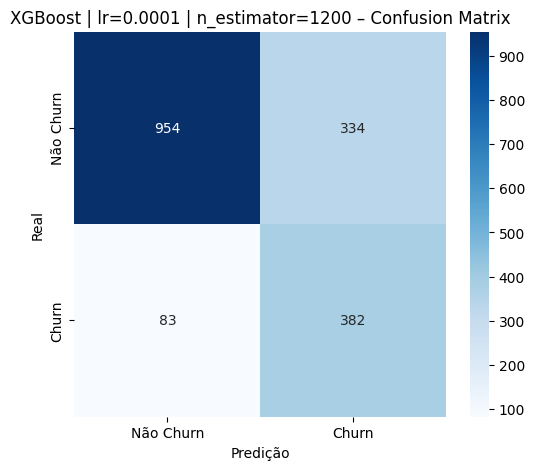

In [ ]:
LR = [0.1, 0.05, 0.03, 0.01, 0.005, 0.001, 0.0005, 0.0001]
N_ESTIMATORS = [200, 400, 800, 1200]

all_results = []

for lr in LR:
  for n_estimator in N_ESTIMATORS:
      print(f"\n===== LR = {lr} ===== N_ESTIMATOR = {n_estimator}")

      study = optuna.create_study(direction="maximize")
      study.optimize(
          lambda trial: optuna_objective_xgb(trial, lr, n_estimator),
          n_trials=30
      )

      best_params = {**study.best_params}

      # ─── Treina modelo final para ESTE lr ───────────────
      model = XGBClassifier(
          **best_params,
          eval_metric="logloss",
          random_state=42
      )

      model.fit(
          X_train, y_train,
          eval_set=[(X_val, y_val)],
          verbose=False
      )

      # ─── Avaliação + Gráficos ─────────────────────────────
      metrics = show_results(
          model=model,
          X=X_test,
          y=y_test,
          threshold=0.5,
          title_prefix=f"XGBoost | lr={lr} | n_estimator={n_estimator}"
      )

      # ─── Log estruturado ──────────────────────────────────
      all_results.append({
          "lr": lr,
          "n_estimator": n_estimator,
          "ks": metrics["ks"],
          "auc": metrics["auc"],
          **study.best_params
      })

In [ ]:
for result in all_results:
  print(result)

{'lr': 0.1, 'n_estimator': 200, 'ks': np.float64(0.5591998931409872), 'auc': np.float64(0.8599412275429105), 'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 200, 'subsample': 0.6531839150766705, 'colsample_bytree': 0.7433587797261484, 'min_child_weight': 4, 'gamma': 4.881756747024353, 'reg_alpha': 0.8230082852931125, 'reg_lambda': 4.92916992654222}
{'lr': 0.1, 'n_estimator': 400, 'ks': np.float64(0.5445034395244774), 'auc': np.float64(0.8535054765244106), 'max_depth': 5, 'learning_rate': 0.1, 'n_estimators': 400, 'subsample': 0.9140651974567295, 'colsample_bytree': 0.6947483423048265, 'min_child_weight': 7, 'gamma': 1.941135011027459, 'reg_alpha': 0.37258393179278537, 'reg_lambda': 2.7873905465212303}
{'lr': 0.1, 'n_estimator': 800, 'ks': np.float64(0.5540055433112937), 'auc': np.float64(0.8581371468643557), 'max_depth': 8, 'learning_rate': 0.1, 'n_estimators': 800, 'subsample': 0.6411345327485433, 'colsample_bytree': 0.6773866497900863, 'min_child_weight': 4, 'gamma': 3.78836055

In [ ]:
df = pd.DataFrame(all_results)

# Converter ks e auc (estão como np.float64)
df["ks"] = df["ks"].astype(float)
df["auc"] = df["auc"].astype(float)

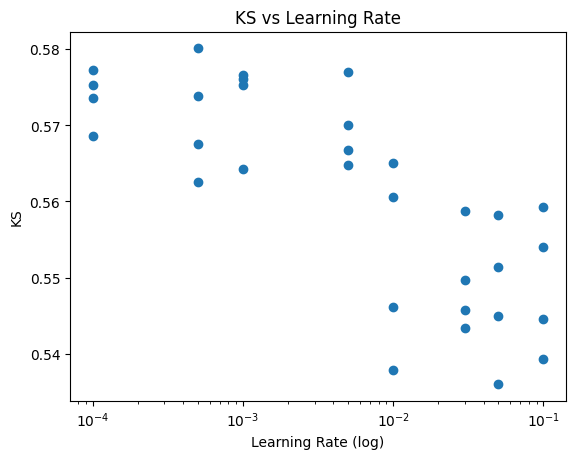

In [ ]:
plt.figure()
plt.scatter(df["learning_rate"], df["ks"])
plt.xscale("log")
plt.xlabel("Learning Rate (log)")
plt.ylabel("KS")
plt.title("KS vs Learning Rate")
plt.show()

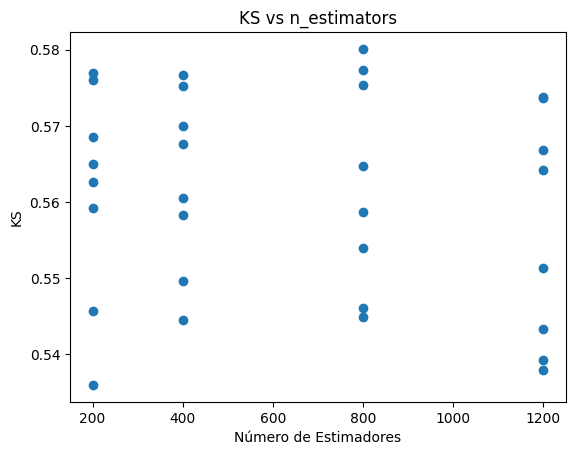

In [ ]:
plt.figure()
plt.scatter(df["n_estimators"], df["ks"])
plt.xlabel("Número de Estimadores")
plt.ylabel("KS")
plt.title("KS vs n_estimators")
plt.show()

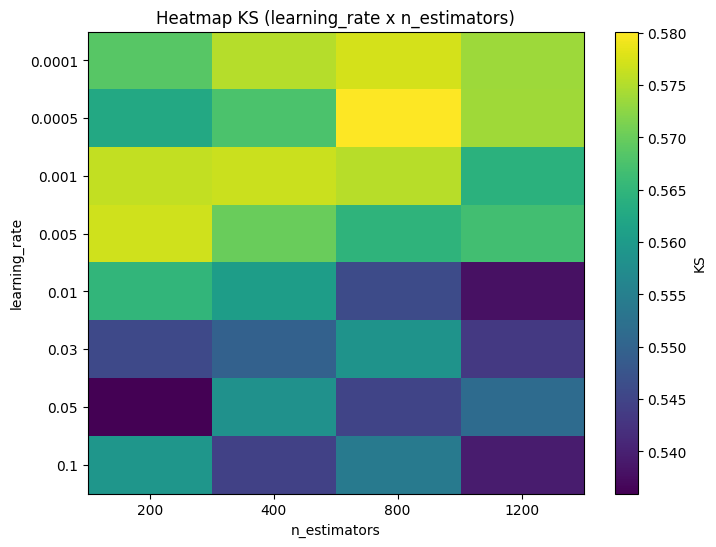

In [ ]:
pivot = df.pivot_table(
    values="ks",
    index="learning_rate",
    columns="n_estimators",
    aggfunc="mean"
)

plt.figure(figsize=(8,6))
plt.imshow(pivot, aspect="auto")
plt.colorbar(label="KS")
plt.xticks(range(len(pivot.columns)), pivot.columns)
plt.yticks(range(len(pivot.index)), pivot.index)
plt.xlabel("n_estimators")
plt.ylabel("learning_rate")
plt.title("Heatmap KS (learning_rate x n_estimators)")
plt.show()


## Subsample e Colcamples

In [ ]:
def optuna_objective_xgb(trial, subsample, colsample_bytree):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_categorical("max_depth", [5, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 0.00001, 0.0005, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [800, 1200, 1600]),
        "subsample": trial.suggest_float("subsample", subsample, subsample),
        "colsample_bytree": trial.suggest_float("colsample_bytree", colsample_bytree, colsample_bytree),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


[I 2025-12-18 21:40:53,769] A new study created in memory with name: no-name-ca0df108-34b0-4425-9a6e-8751f08b3cd6



===== SUBSAMPLE = 0.6 ===== COLSAMPLE_BYTREE = 0.6


[I 2025-12-18 21:40:55,008] Trial 0 finished with value: 0.5690993788819876 and parameters: {'max_depth': 5, 'learning_rate': 2.810577537545436e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.6, 'min_child_weight': 4, 'gamma': 0.45039645146134566, 'reg_alpha': 0.6405475363316143, 'reg_lambda': 3.835890092492625}. Best is trial 0 with value: 0.5690993788819876.
[I 2025-12-18 21:41:00,357] Trial 1 finished with value: 0.563664596273292 and parameters: {'max_depth': 8, 'learning_rate': 0.00020303267653587703, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.6, 'min_child_weight': 4, 'gamma': 0.5197178071496522, 'reg_alpha': 0.34658341169079065, 'reg_lambda': 1.1848182049796545}. Best is trial 0 with value: 0.5690993788819876.
[I 2025-12-18 21:41:03,224] Trial 2 finished with value: 0.5667701863354038 and parameters: {'max_depth': 8, 'learning_rate': 0.00011996752971074722, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.6, 'min_child_weight': 6

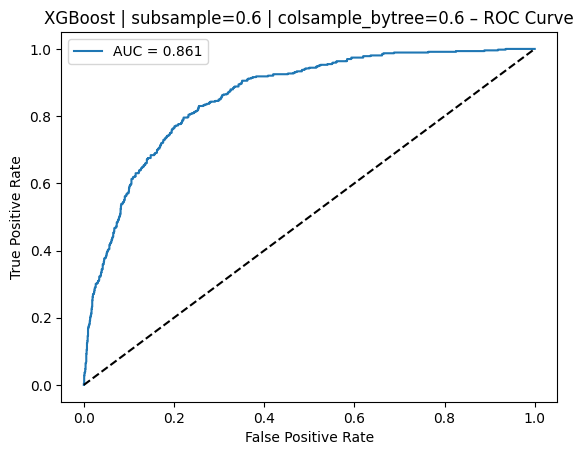

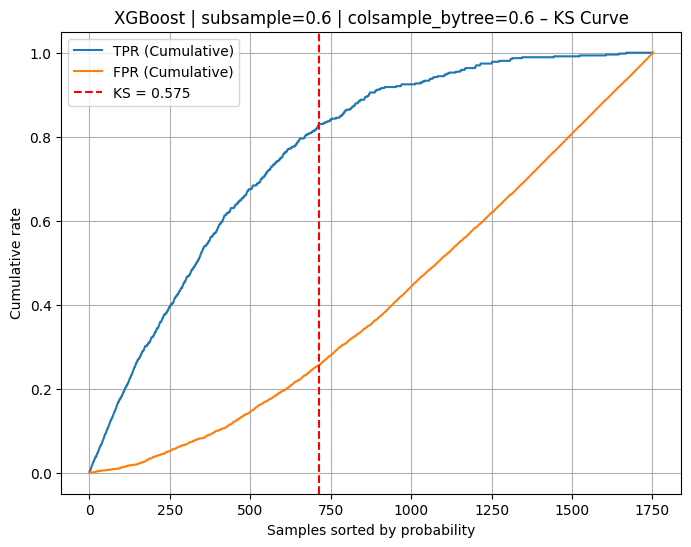

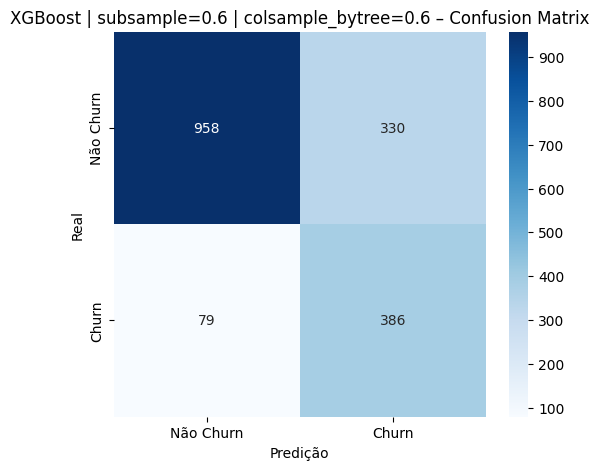

[I 2025-12-18 21:42:00,598] A new study created in memory with name: no-name-b2c4f90f-0354-4dd7-8261-046eb81d7322



===== SUBSAMPLE = 0.6 ===== COLSAMPLE_BYTREE = 0.8


[I 2025-12-18 21:42:04,620] Trial 0 finished with value: 0.5597826086956521 and parameters: {'max_depth': 8, 'learning_rate': 5.988311284452444e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 10, 'gamma': 1.9621455231662428, 'reg_alpha': 0.031538275812367456, 'reg_lambda': 0.7037383801511052}. Best is trial 0 with value: 0.5597826086956521.
[I 2025-12-18 21:42:05,913] Trial 1 finished with value: 0.5636645962732919 and parameters: {'max_depth': 5, 'learning_rate': 3.484319097327041e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 3, 'gamma': 4.484955968695983, 'reg_alpha': 0.737217665975053, 'reg_lambda': 1.5576698089933476}. Best is trial 1 with value: 0.5636645962732919.
[I 2025-12-18 21:42:08,518] Trial 2 finished with value: 0.5613354037267082 and parameters: {'max_depth': 5, 'learning_rate': 5.8653043923797294e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 9

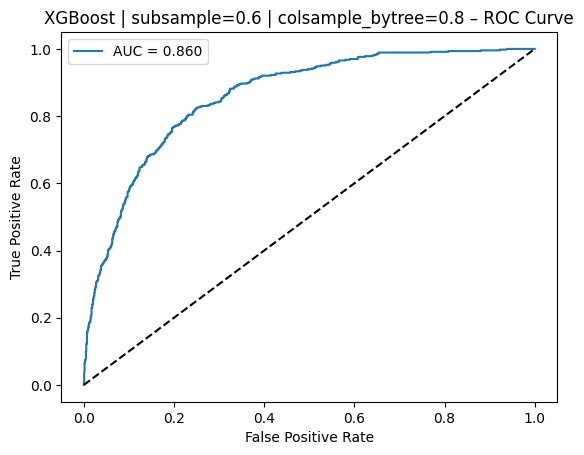

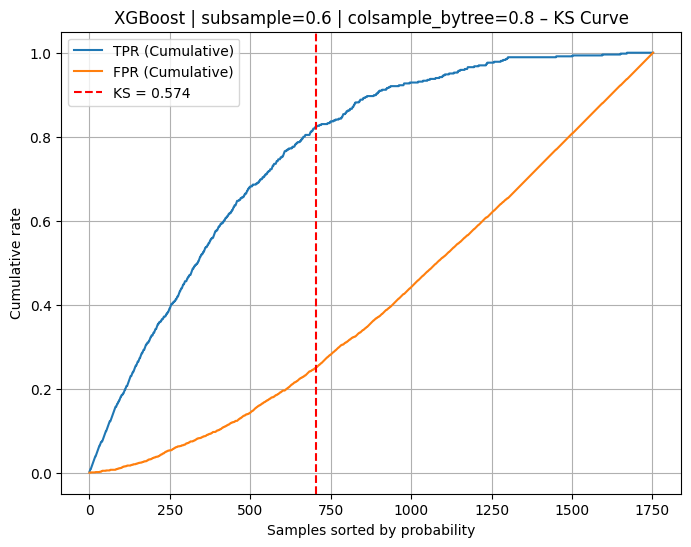

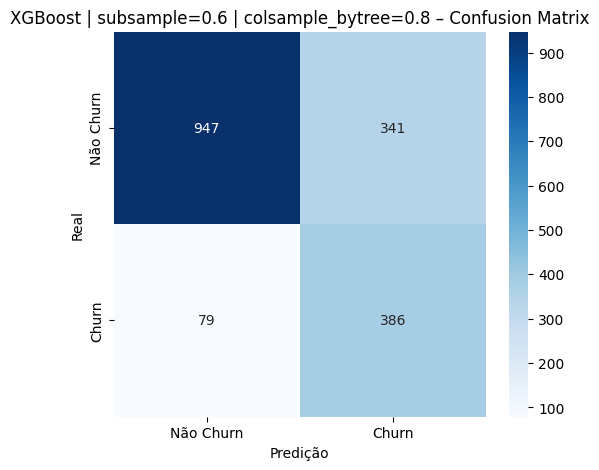

[I 2025-12-18 21:43:08,311] A new study created in memory with name: no-name-8450ab5c-6c8c-45ae-8c03-e2e95f82cbe2



===== SUBSAMPLE = 0.6 ===== COLSAMPLE_BYTREE = 1.0


[I 2025-12-18 21:43:09,702] Trial 0 finished with value: 0.5566770186335404 and parameters: {'max_depth': 5, 'learning_rate': 1.9472612205295274e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 1.0, 'min_child_weight': 5, 'gamma': 1.1853904460538485, 'reg_alpha': 0.19356566834880107, 'reg_lambda': 2.930341892269228}. Best is trial 0 with value: 0.5566770186335404.
[I 2025-12-18 21:43:12,274] Trial 1 finished with value: 0.547360248447205 and parameters: {'max_depth': 8, 'learning_rate': 0.0002574690629806677, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 1.0, 'min_child_weight': 2, 'gamma': 1.5824017171567721, 'reg_alpha': 0.022174722894757082, 'reg_lambda': 4.893704449708401}. Best is trial 0 with value: 0.5566770186335404.
[I 2025-12-18 21:43:13,633] Trial 2 finished with value: 0.5574534161490683 and parameters: {'max_depth': 5, 'learning_rate': 8.144856634557036e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 1.0, 'min_child_weight': 4, 

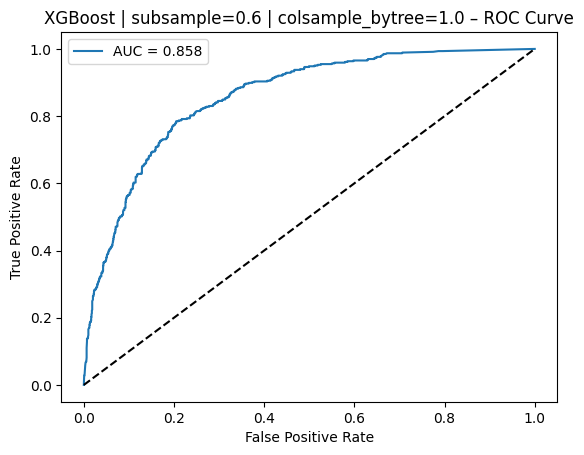

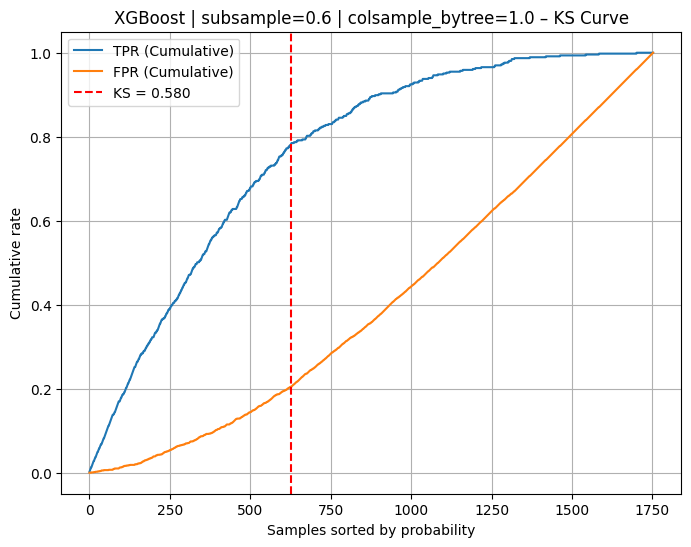

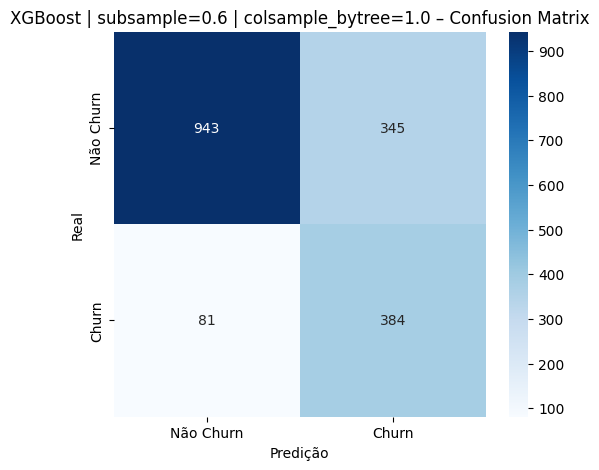

[I 2025-12-18 21:44:08,814] A new study created in memory with name: no-name-53ae5f5f-bf24-4255-aed5-daa217bb3409



===== SUBSAMPLE = 0.8 ===== COLSAMPLE_BYTREE = 0.6


[I 2025-12-18 21:44:12,306] Trial 0 finished with value: 0.5659937888198758 and parameters: {'max_depth': 5, 'learning_rate': 4.649888331217971e-05, 'n_estimators': 800, 'subsample': 0.8, 'colsample_bytree': 0.6, 'min_child_weight': 2, 'gamma': 3.1722261322746608, 'reg_alpha': 0.7865520663243353, 'reg_lambda': 2.77382627089282}. Best is trial 0 with value: 0.5659937888198758.
[I 2025-12-18 21:44:14,858] Trial 1 finished with value: 0.5683229813664596 and parameters: {'max_depth': 5, 'learning_rate': 0.00033278190541528093, 'n_estimators': 1600, 'subsample': 0.8, 'colsample_bytree': 0.6, 'min_child_weight': 9, 'gamma': 0.3392979396416995, 'reg_alpha': 0.7155828994245278, 'reg_lambda': 2.5900068087936896}. Best is trial 1 with value: 0.5683229813664596.
[I 2025-12-18 21:44:17,438] Trial 2 finished with value: 0.5698757763975155 and parameters: {'max_depth': 5, 'learning_rate': 3.853467783803342e-05, 'n_estimators': 1600, 'subsample': 0.8, 'colsample_bytree': 0.6, 'min_child_weight': 6, '

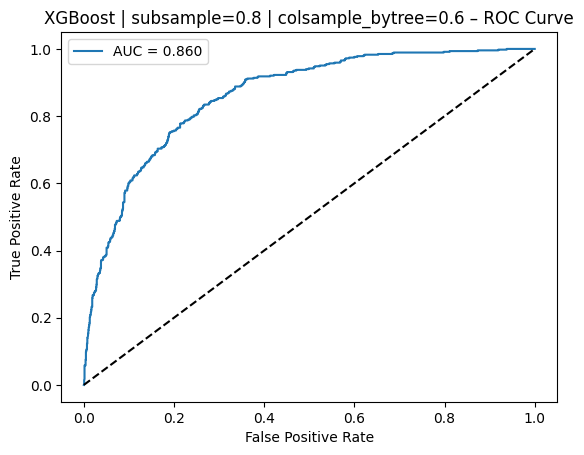

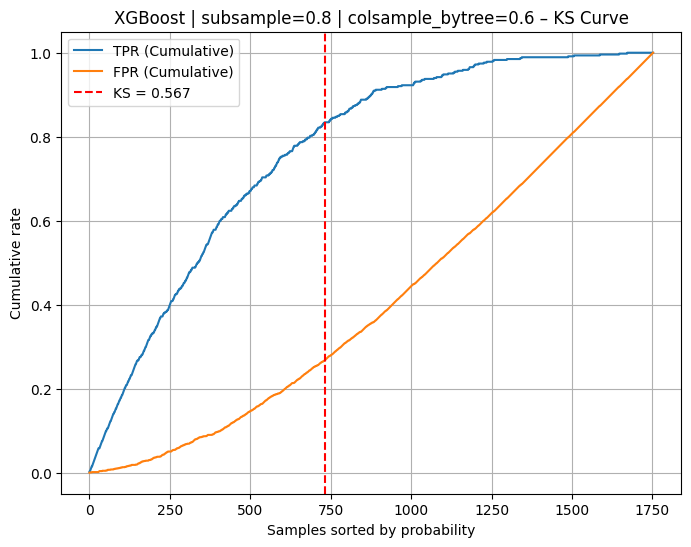

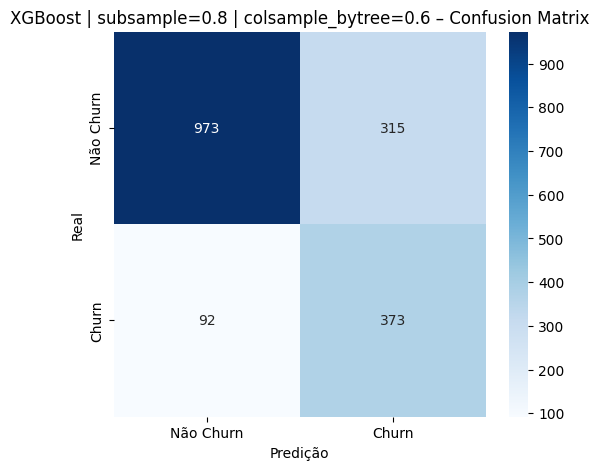

[I 2025-12-18 21:45:44,765] A new study created in memory with name: no-name-4990420a-7de1-467b-9e7d-d6cca307aab5



===== SUBSAMPLE = 0.8 ===== COLSAMPLE_BYTREE = 0.8


[I 2025-12-18 21:45:47,339] Trial 0 finished with value: 0.5605590062111802 and parameters: {'max_depth': 5, 'learning_rate': 0.00014192079719375285, 'n_estimators': 1600, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 6, 'gamma': 1.6938308023413788, 'reg_alpha': 0.08852868719129137, 'reg_lambda': 4.88082998197364}. Best is trial 0 with value: 0.5605590062111802.
[I 2025-12-18 21:45:50,248] Trial 1 finished with value: 0.5582298136645962 and parameters: {'max_depth': 8, 'learning_rate': 3.921120385376241e-05, 'n_estimators': 1600, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 10, 'gamma': 1.4066336862975222, 'reg_alpha': 0.44377233327642585, 'reg_lambda': 4.889211727515763}. Best is trial 0 with value: 0.5605590062111802.
[I 2025-12-18 21:45:52,190] Trial 2 finished with value: 0.56055900621118 and parameters: {'max_depth': 5, 'learning_rate': 4.866332934967624e-05, 'n_estimators': 1200, 'subsample': 0.8, 'colsample_bytree': 0.8, 'min_child_weight': 2, 

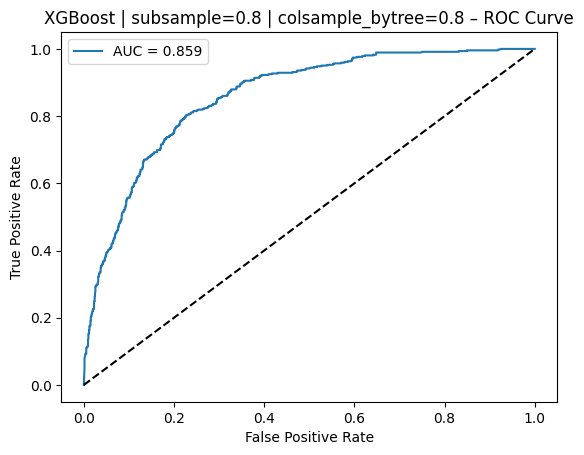

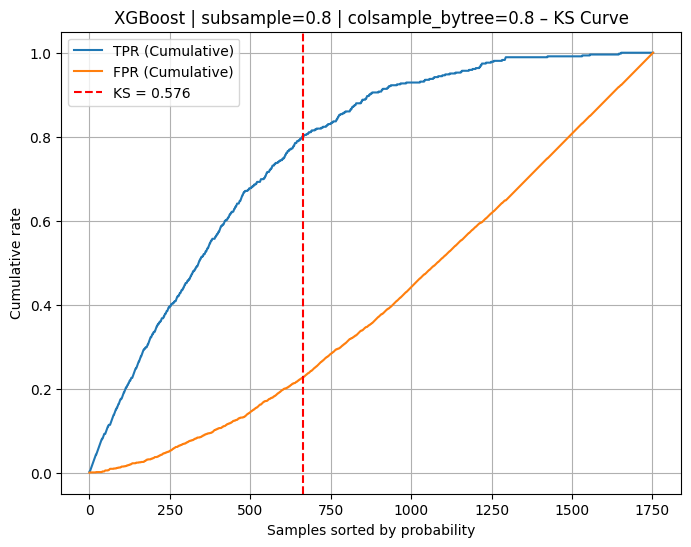

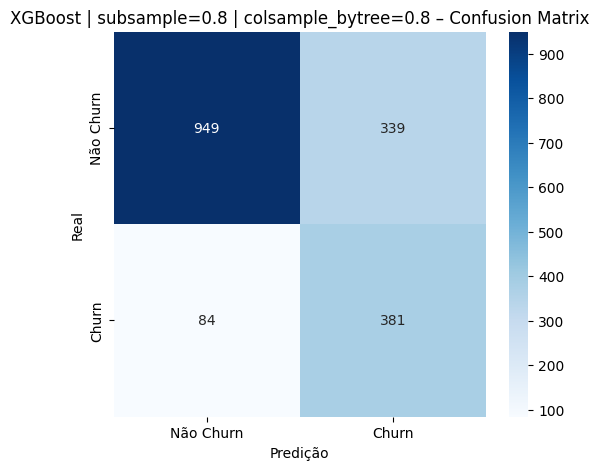

[I 2025-12-18 21:46:45,627] A new study created in memory with name: no-name-fea38d7e-e432-49fc-9f39-68d0513d8e7d



===== SUBSAMPLE = 0.8 ===== COLSAMPLE_BYTREE = 1.0


[I 2025-12-18 21:46:50,034] Trial 0 finished with value: 0.548913043478261 and parameters: {'max_depth': 8, 'learning_rate': 0.00045447490711846055, 'n_estimators': 1200, 'subsample': 0.8, 'colsample_bytree': 1.0, 'min_child_weight': 8, 'gamma': 0.3110779305924377, 'reg_alpha': 0.05532452373213381, 'reg_lambda': 4.172417204422224}. Best is trial 0 with value: 0.548913043478261.
[I 2025-12-18 21:46:52,006] Trial 1 finished with value: 0.5590062111801243 and parameters: {'max_depth': 5, 'learning_rate': 1.433273256190191e-05, 'n_estimators': 1200, 'subsample': 0.8, 'colsample_bytree': 1.0, 'min_child_weight': 7, 'gamma': 2.6197594754841442, 'reg_alpha': 0.7747864171104728, 'reg_lambda': 1.9166783672050955}. Best is trial 1 with value: 0.5590062111801243.
[I 2025-12-18 21:46:54,581] Trial 2 finished with value: 0.5427018633540373 and parameters: {'max_depth': 8, 'learning_rate': 2.972544194607369e-05, 'n_estimators': 1200, 'subsample': 0.8, 'colsample_bytree': 1.0, 'min_child_weight': 2, 

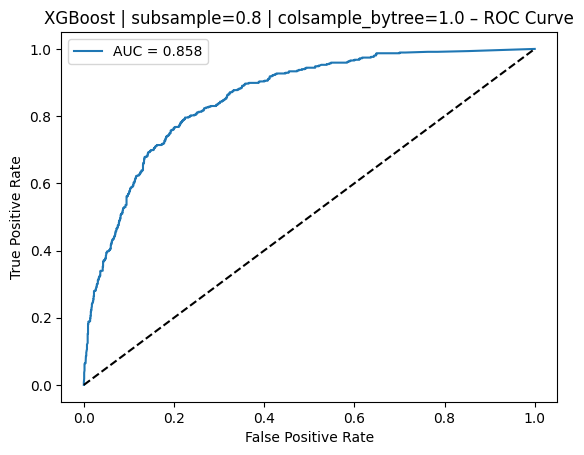

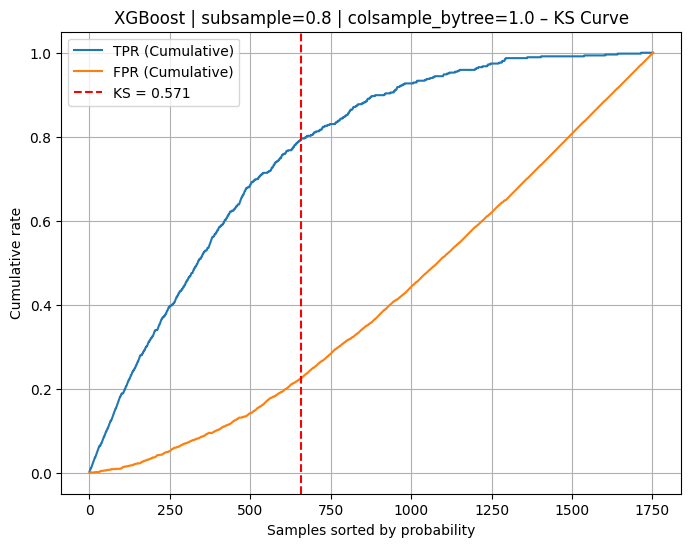

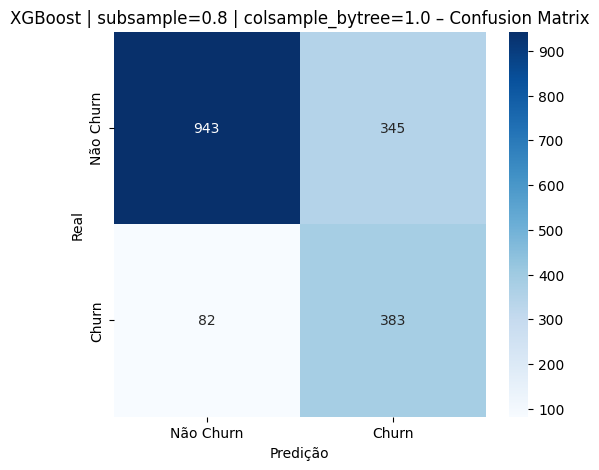

[I 2025-12-18 21:48:10,123] A new study created in memory with name: no-name-2911b7b6-147d-4693-8cd1-e401e32bd289



===== SUBSAMPLE = 1.0 ===== COLSAMPLE_BYTREE = 0.6


[I 2025-12-18 21:48:12,106] Trial 0 finished with value: 0.562888198757764 and parameters: {'max_depth': 5, 'learning_rate': 2.612528361824047e-05, 'n_estimators': 1200, 'subsample': 1.0, 'colsample_bytree': 0.6, 'min_child_weight': 1, 'gamma': 4.1253176826968545, 'reg_alpha': 0.6497049339119427, 'reg_lambda': 2.4185167803545298}. Best is trial 0 with value: 0.562888198757764.
[I 2025-12-18 21:48:14,503] Trial 1 finished with value: 0.5597826086956522 and parameters: {'max_depth': 8, 'learning_rate': 0.00012658638695012928, 'n_estimators': 1200, 'subsample': 1.0, 'colsample_bytree': 0.6, 'min_child_weight': 4, 'gamma': 1.4421999391228957, 'reg_alpha': 0.06073286450548454, 'reg_lambda': 4.874204770536166}. Best is trial 0 with value: 0.562888198757764.
[I 2025-12-18 21:48:18,625] Trial 2 finished with value: 0.5652173913043479 and parameters: {'max_depth': 8, 'learning_rate': 3.35780122912636e-05, 'n_estimators': 1200, 'subsample': 1.0, 'colsample_bytree': 0.6, 'min_child_weight': 9, 'g

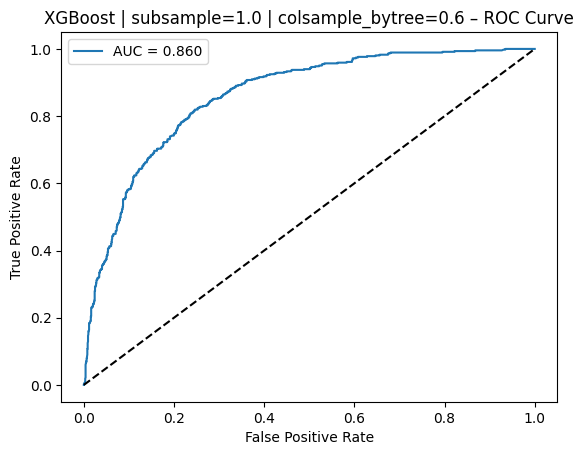

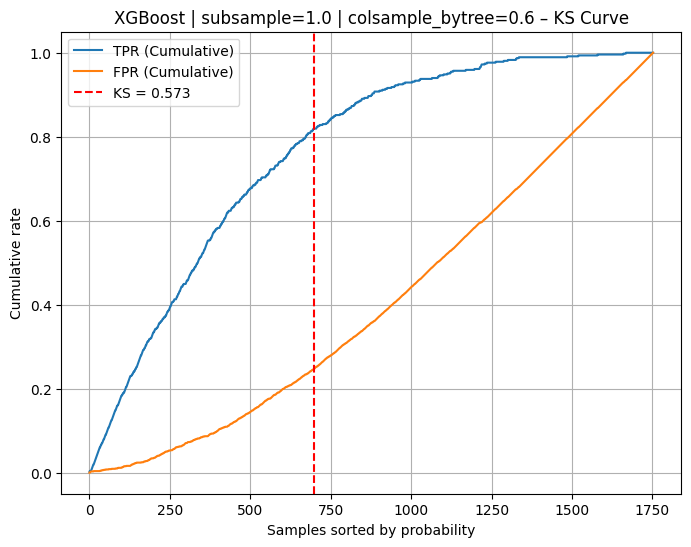

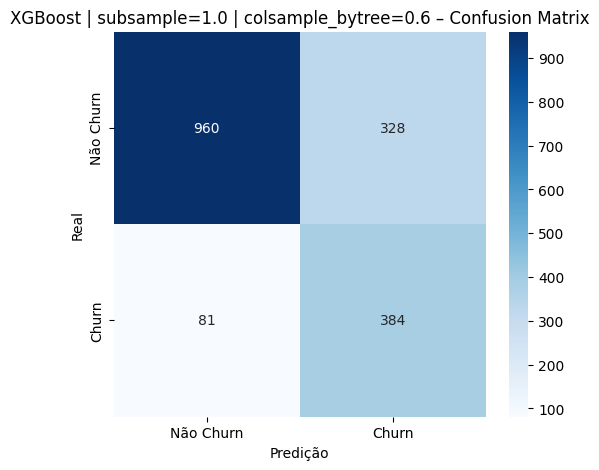

[I 2025-12-18 21:49:33,722] A new study created in memory with name: no-name-07bda07b-130d-4525-9cf9-a6edeea5ffe4



===== SUBSAMPLE = 1.0 ===== COLSAMPLE_BYTREE = 0.8


[I 2025-12-18 21:49:37,889] Trial 0 finished with value: 0.5667701863354038 and parameters: {'max_depth': 5, 'learning_rate': 2.988981264278039e-05, 'n_estimators': 1200, 'subsample': 1.0, 'colsample_bytree': 0.8, 'min_child_weight': 10, 'gamma': 0.06649745707343058, 'reg_alpha': 0.8352020447126992, 'reg_lambda': 4.834000958486855}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:49:40,969] Trial 1 finished with value: 0.5566770186335404 and parameters: {'max_depth': 8, 'learning_rate': 3.0313112384632937e-05, 'n_estimators': 1600, 'subsample': 1.0, 'colsample_bytree': 0.8, 'min_child_weight': 7, 'gamma': 2.837810879108151, 'reg_alpha': 0.9365833465054085, 'reg_lambda': 3.39986423905464}. Best is trial 0 with value: 0.5667701863354038.
[I 2025-12-18 21:49:42,451] Trial 2 finished with value: 0.5667701863354037 and parameters: {'max_depth': 8, 'learning_rate': 6.191922982377556e-05, 'n_estimators': 800, 'subsample': 1.0, 'colsample_bytree': 0.8, 'min_child_weight': 4, '

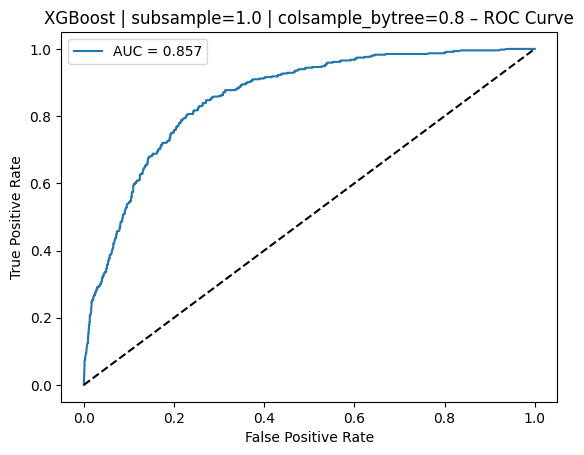

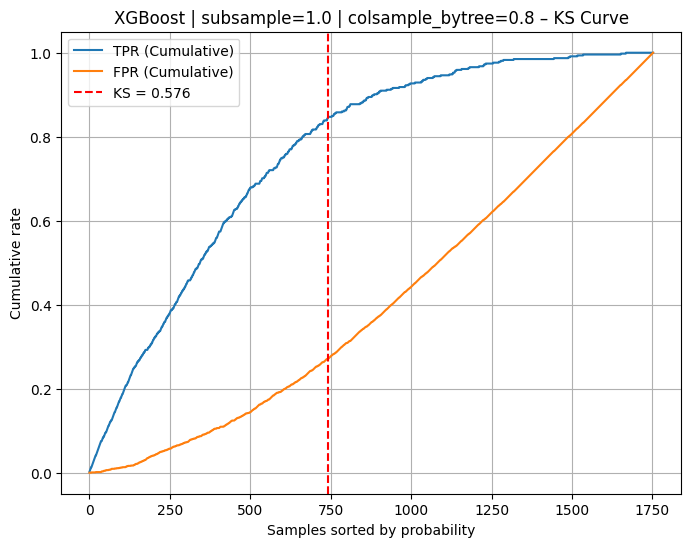

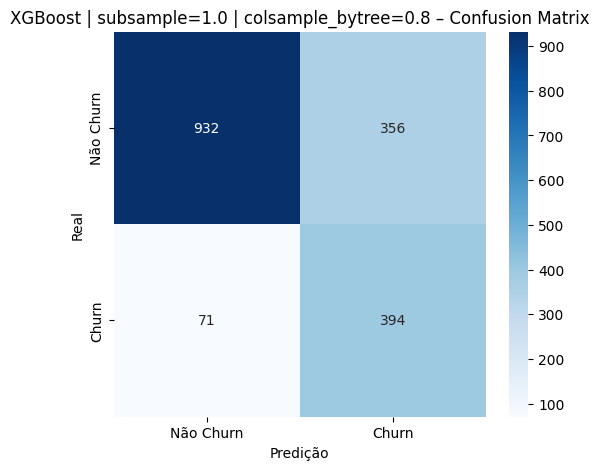

[I 2025-12-18 21:51:02,166] A new study created in memory with name: no-name-b740f87b-22be-41f9-ae30-ef29ad0f4ad0



===== SUBSAMPLE = 1.0 ===== COLSAMPLE_BYTREE = 1.0


[I 2025-12-18 21:51:04,733] Trial 0 finished with value: 0.5419254658385093 and parameters: {'max_depth': 8, 'learning_rate': 0.00010925278525085667, 'n_estimators': 1200, 'subsample': 1.0, 'colsample_bytree': 1.0, 'min_child_weight': 2, 'gamma': 2.9010148332986256, 'reg_alpha': 0.8821522923626925, 'reg_lambda': 4.789740373102419}. Best is trial 0 with value: 0.5419254658385093.
[I 2025-12-18 21:51:08,214] Trial 1 finished with value: 0.5590062111801242 and parameters: {'max_depth': 5, 'learning_rate': 0.0003342246821950332, 'n_estimators': 800, 'subsample': 1.0, 'colsample_bytree': 1.0, 'min_child_weight': 3, 'gamma': 4.082830993381502, 'reg_alpha': 0.6313984340763236, 'reg_lambda': 2.5798305636968846}. Best is trial 1 with value: 0.5590062111801242.
[I 2025-12-18 21:51:11,710] Trial 2 finished with value: 0.5427018633540373 and parameters: {'max_depth': 8, 'learning_rate': 0.0004463151419632316, 'n_estimators': 1600, 'subsample': 1.0, 'colsample_bytree': 1.0, 'min_child_weight': 7, '

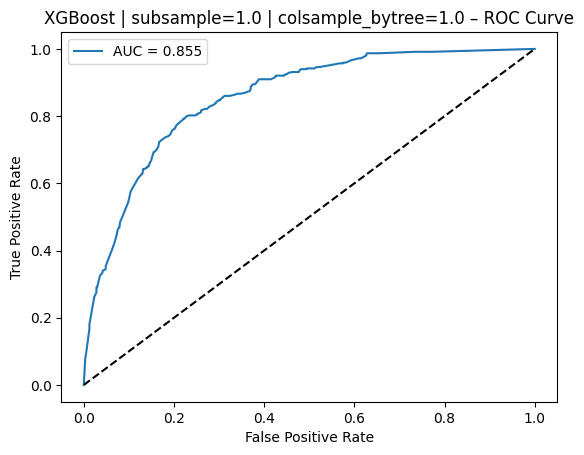

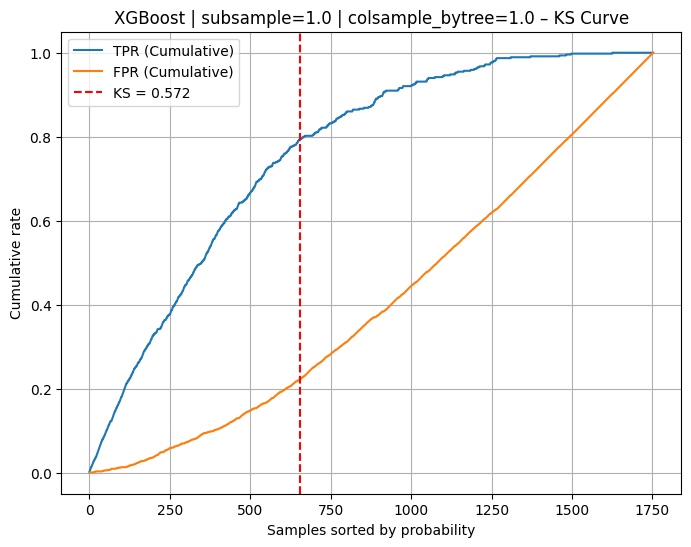

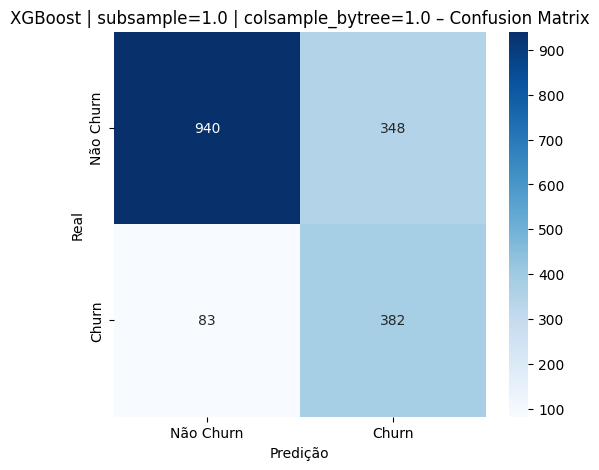

In [ ]:
SUBSAMPLE = [0.6, 0.8, 1.0]
COLSAMPLE_BYTREE = [0.6, 0.8, 1.0]

all_results = []

for subsample in SUBSAMPLE:
  for colsample_bytree in COLSAMPLE_BYTREE:
      print(f"\n===== SUBSAMPLE = {subsample} ===== COLSAMPLE_BYTREE = {colsample_bytree}")

      study = optuna.create_study(direction="maximize")
      study.optimize(
          lambda trial: optuna_objective_xgb(trial, subsample, colsample_bytree),
          n_trials=30
      )

      best_params = {**study.best_params}

      # ─── Treina modelo final para ESTE subsample ───────────────
      model = XGBClassifier(
          **best_params,
          eval_metric="logloss",
          random_state=42
      )

      model.fit(
          X_train, y_train,
          eval_set=[(X_val, y_val)],
          verbose=False
      )

      # ─── Avaliação + Gráficos ─────────────────────────────
      metrics = show_results(
          model=model,
          X=X_test,
          y=y_test,
          threshold=0.5,
          title_prefix=f"XGBoost | subsample={subsample} | colsample_bytree={colsample_bytree}"
      )

      # ─── Log estruturado ──────────────────────────────────
      all_results.append({
          "subsample": subsample,
          "colsample_bytree": colsample_bytree,
          "ks": metrics["ks"],
          "auc": metrics["auc"],
          **study.best_params
      })

In [ ]:
for result in all_results:
  print(result)

{'subsample': 0.6, 'colsample_bytree': 0.6, 'ks': np.float64(0.5746727442730247), 'auc': np.float64(0.8607451746476992), 'max_depth': 5, 'learning_rate': 0.0004903872969684238, 'n_estimators': 800, 'min_child_weight': 4, 'gamma': 1.315189409901124, 'reg_alpha': 0.4034822001584707, 'reg_lambda': 3.7372558790856214}
{'subsample': 0.6, 'colsample_bytree': 0.8, 'ks': np.float64(0.5744323114940225), 'auc': np.float64(0.8602860148266881), 'max_depth': 5, 'learning_rate': 0.000474564988861162, 'n_estimators': 800, 'min_child_weight': 5, 'gamma': 2.430126867217688, 'reg_alpha': 0.38354814806507037, 'reg_lambda': 1.9051048191769904}
{'subsample': 0.6, 'colsample_bytree': 1.0, 'ks': np.float64(0.5799772924597608), 'auc': np.float64(0.8576278968810526), 'max_depth': 5, 'learning_rate': 0.00018191397768973136, 'n_estimators': 800, 'min_child_weight': 10, 'gamma': 3.443864791258996, 'reg_alpha': 0.07906054151244907, 'reg_lambda': 4.9421613265729905}
{'subsample': 0.8, 'colsample_bytree': 0.6, 'ks':

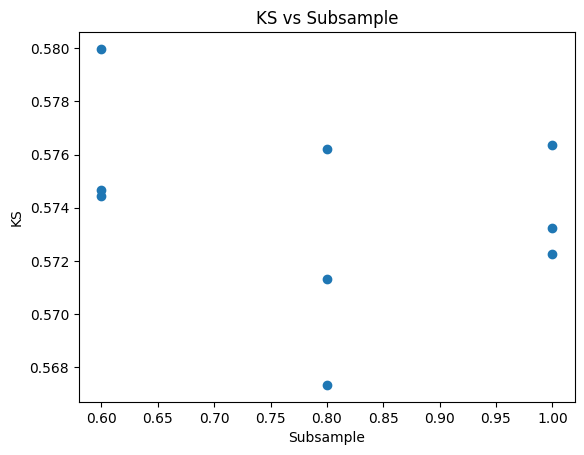

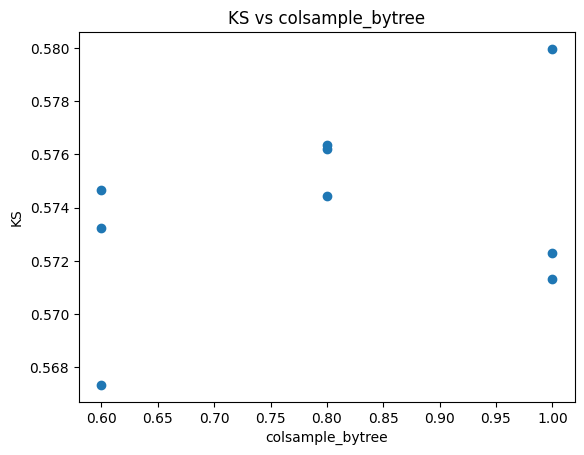

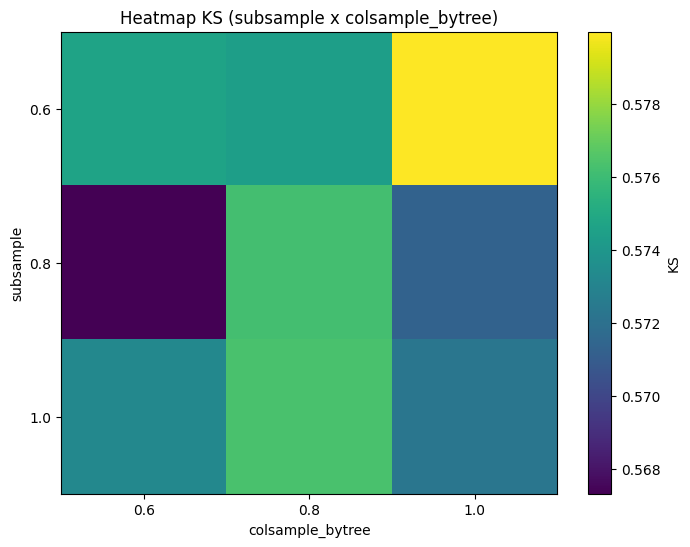

In [ ]:
df = pd.DataFrame(all_results)

# Converter ks e auc (estão como np.float64)
df["ks"] = df["ks"].astype(float)
df["auc"] = df["auc"].astype(float)

plt.figure()
plt.scatter(df["subsample"], df["ks"])
plt.xlabel("Subsample")
plt.ylabel("KS")
plt.title("KS vs Subsample")
plt.show()

plt.figure()
plt.scatter(df["colsample_bytree"], df["ks"])
plt.xlabel("colsample_bytree")
plt.ylabel("KS")
plt.title("KS vs colsample_bytree")
plt.show()

pivot = df.pivot_table(
    values="ks",
    index="subsample",
    columns="colsample_bytree",
    aggfunc="mean"
)

plt.figure(figsize=(8,6))
plt.imshow(pivot, aspect="auto")
plt.colorbar(label="KS")
plt.xticks(range(len(pivot.columns)), pivot.columns)
plt.yticks(range(len(pivot.index)), pivot.index)
plt.xlabel("colsample_bytree")
plt.ylabel("subsample")
plt.title("Heatmap KS (subsample x colsample_bytree)")
plt.show()


## min child weight e gamma

In [ ]:
def optuna_objective_xgb(trial, min_child_weight, gamma):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_categorical("max_depth", [5, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 0.00001, 0.0005, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [800, 1200, 1600]),
        "subsample": trial.suggest_categorical("subsample", [0.6]),
        "colsample_bytree": trial.suggest_categorical("colsample_bytree", [0.8, 0.1]),
        "min_child_weight": trial.suggest_int("min_child_weight", min_child_weight, min_child_weight),
        "gamma": trial.suggest_float("gamma", gamma, gamma),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


In [ ]:
MIN_CHILD_WEIGHT = [1, 5, 10, 20]
GAMMA = [0, 0.5, 1, 2]

all_results = []

for min_child_weight in MIN_CHILD_WEIGHT:
  for gamma in GAMMA:
      print(f"\n===== MIN_CHILD_WEIGHT = {min_child_weight} ===== GAMMA = {gamma}")

      study = optuna.create_study(direction="maximize")
      study.optimize(
          lambda trial: optuna_objective_xgb(trial, min_child_weight, gamma),
          n_trials=30
      )

      best_params = {**study.best_params}

      # ─── Treina modelo final para ESTE min_child_weight ───────────────
      model = XGBClassifier(
          **best_params,
          eval_metric="logloss",
          random_state=42
      )

      model.fit(
          X_train, y_train,
          eval_set=[(X_val, y_val)],
          verbose=False
      )

      # ─── Avaliação + Gráficos ─────────────────────────────
      metrics = show_results(
          model=model,
          X=X_test,
          y=y_test,
          threshold=0.5,
          title_prefix=f"XGBoost | min_child_weight={min_child_weight} | gamma={gamma}"
      )

      # ─── Log estruturado ──────────────────────────────────
      all_results.append({
          "min_child_weight": min_child_weight,
          "gamma": gamma,
          "ks": metrics["ks"],
          "auc": metrics["auc"],
          **study.best_params
      })

[I 2025-12-19 11:27:02,526] A new study created in memory with name: no-name-2615dfff-7715-41ee-98e9-8c7477e61e6b



===== MIN_CHILD_WEIGHT = 1 ===== GAMMA = 0


[I 2025-12-19 11:27:05,121] Trial 0 finished with value: 0.5489130434782609 and parameters: {'max_depth': 8, 'learning_rate': 7.458995058916179e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 1, 'gamma': 0.0, 'reg_alpha': 0.7740850321580688, 'reg_lambda': 4.641839793501957}. Best is trial 0 with value: 0.5489130434782609.
[I 2025-12-19 11:27:09,568] Trial 1 finished with value: 0.5465838509316769 and parameters: {'max_depth': 8, 'learning_rate': 0.00025556571125081673, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 1, 'gamma': 0.0, 'reg_alpha': 0.3908097584736213, 'reg_lambda': 4.437233405874284}. Best is trial 0 with value: 0.5489130434782609.
[I 2025-12-19 11:27:10,643] Trial 2 finished with value: 0.5496894409937889 and parameters: {'max_depth': 8, 'learning_rate': 3.639991804772221e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 1, 'gamma': 0.0, 'reg_alpha': 0.95

In [ ]:
for result in all_results:
  print(result)

{'min_child_weight': 0, 'gamma': 1.0, 'ks': np.float64(0.5738345688906699), 'auc': np.float64(0.8604905496560477), 'max_depth': 5, 'learning_rate': 0.0004782030478298473, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'reg_alpha': 0.571973587847585, 'reg_lambda': 1.0351266453396741}
{'min_child_weight': 0, 'gamma': 3.0, 'ks': np.float64(0.576218860615775), 'auc': np.float64(0.8600556000801443), 'max_depth': 5, 'learning_rate': 1.5954843638475617e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'reg_alpha': 0.6040693626468963, 'reg_lambda': 1.3085435607163438}
{'min_child_weight': 0, 'gamma': 5.0, 'ks': np.float64(0.5772974687771322), 'auc': np.float64(0.8606199492419688), 'max_depth': 5, 'learning_rate': 0.00035795166689772293, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'reg_alpha': 0.7301330897502409, 'reg_lambda': 0.5293847696800125}
{'min_child_weight': 0, 'gamma': 10.0, 'ks': np.float64(0.5790289187203633), 'auc': np.float64

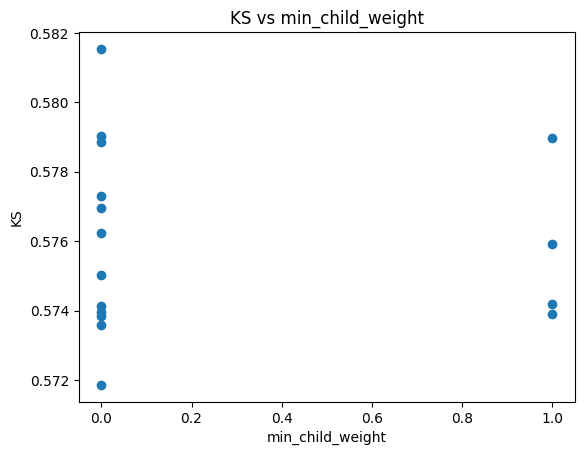

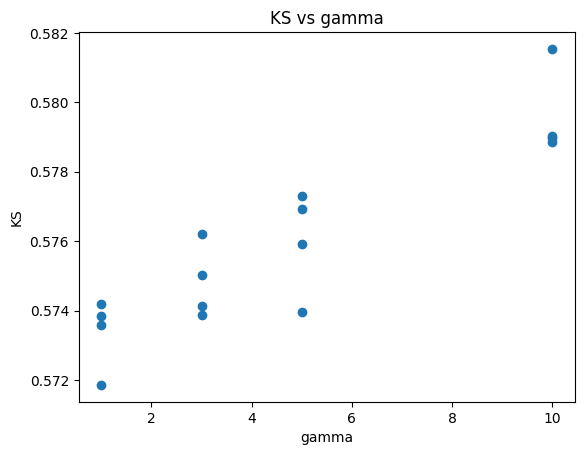

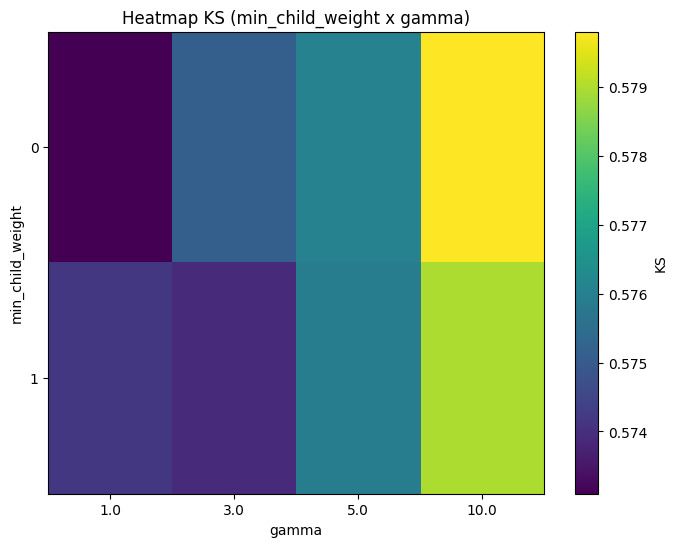

In [ ]:
df = pd.DataFrame(all_results)

# Converter ks e auc (estão como np.float64)
df["ks"] = df["ks"].astype(float)
df["auc"] = df["auc"].astype(float)

plt.figure()
plt.scatter(df["min_child_weight"], df["ks"])
plt.xlabel("min_child_weight")
plt.ylabel("KS")
plt.title("KS vs min_child_weight")
plt.show()

plt.figure()
plt.scatter(df["gamma"], df["ks"])
plt.xlabel("gamma")
plt.ylabel("KS")
plt.title("KS vs gamma")
plt.show()

pivot = df.pivot_table(
    values="ks",
    index="min_child_weight",
    columns="gamma",
    aggfunc="mean"
)

plt.figure(figsize=(8,6))
plt.imshow(pivot, aspect="auto")
plt.colorbar(label="KS")
plt.xticks(range(len(pivot.columns)), pivot.columns)
plt.yticks(range(len(pivot.index)), pivot.index)
plt.xlabel("gamma")
plt.ylabel("min_child_weight")
plt.title("Heatmap KS (min_child_weight x gamma)")
plt.show()


## Regularization

In [ ]:
def optuna_objective_xgb(trial, reg_alpha, reg_lambda):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_categorical("max_depth", [5, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 0.00001, 0.0005, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [800, 1200, 1600]),
        "subsample": trial.suggest_categorical("subsample", [0.6]),
        "colsample_bytree": trial.suggest_categorical("colsample_bytree", [0.8, 0.1]),
        "min_child_weight": trial.suggest_categorical("min_child_weight", [0]),
        "gamma": trial.suggest_categorical("gamma", [10]),
        "reg_alpha": trial.suggest_float("reg_alpha", reg_alpha, reg_alpha),
        "reg_lambda": trial.suggest_float("reg_lambda", reg_lambda, reg_lambda),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


[I 2025-12-18 22:18:53,753] A new study created in memory with name: no-name-4f5c1f1a-0635-4571-92a4-74b6cae02772



===== REG_ALPHA = 0 ===== REG_LAMBDA = 1


[I 2025-12-18 22:18:57,717] Trial 0 finished with value: 0.5504658385093167 and parameters: {'max_depth': 8, 'learning_rate': 0.00013874312244919814, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 1.0}. Best is trial 0 with value: 0.5504658385093167.
[I 2025-12-18 22:18:59,061] Trial 1 finished with value: 0.5613354037267081 and parameters: {'max_depth': 5, 'learning_rate': 7.324149491549768e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.5613354037267081.
[I 2025-12-18 22:19:01,678] Trial 2 finished with value: 0.562888198757764 and parameters: {'max_depth': 5, 'learning_rate': 0.0001594503077479451, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 1.0}. Best is trial 2 with value: 0.56288819875

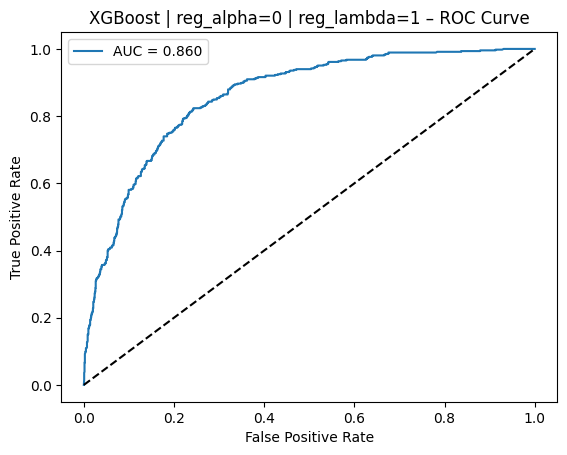

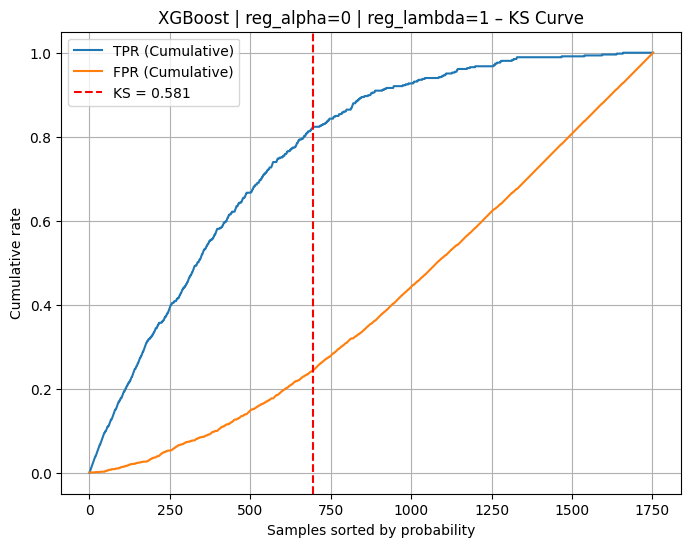

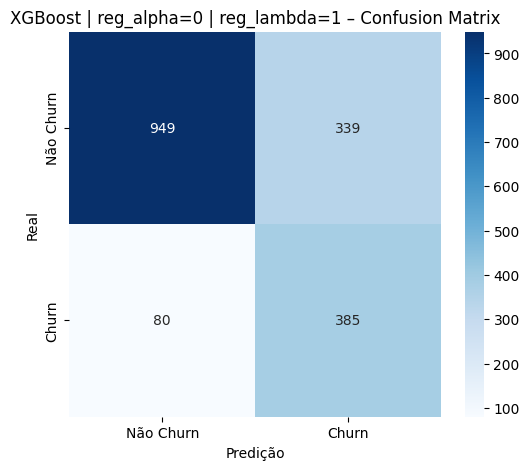

[I 2025-12-18 22:20:13,043] A new study created in memory with name: no-name-81a87d77-b135-46a1-8d89-0bb7480a7d6f



===== REG_ALPHA = 0 ===== REG_LAMBDA = 3


[I 2025-12-18 22:20:17,369] Trial 0 finished with value: 0.5636645962732919 and parameters: {'max_depth': 5, 'learning_rate': 3.1425900547884126e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.5636645962732919.
[I 2025-12-18 22:20:18,325] Trial 1 finished with value: 0.5512422360248448 and parameters: {'max_depth': 8, 'learning_rate': 0.00046991368058120996, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.5636645962732919.
[I 2025-12-18 22:20:20,362] Trial 2 finished with value: 0.562111801242236 and parameters: {'max_depth': 8, 'learning_rate': 2.7048384596750415e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.563664596

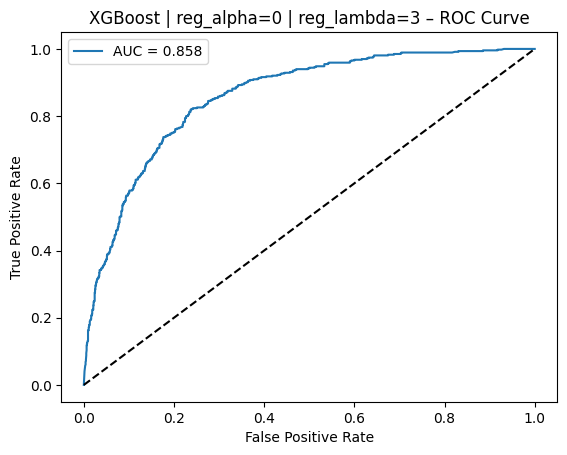

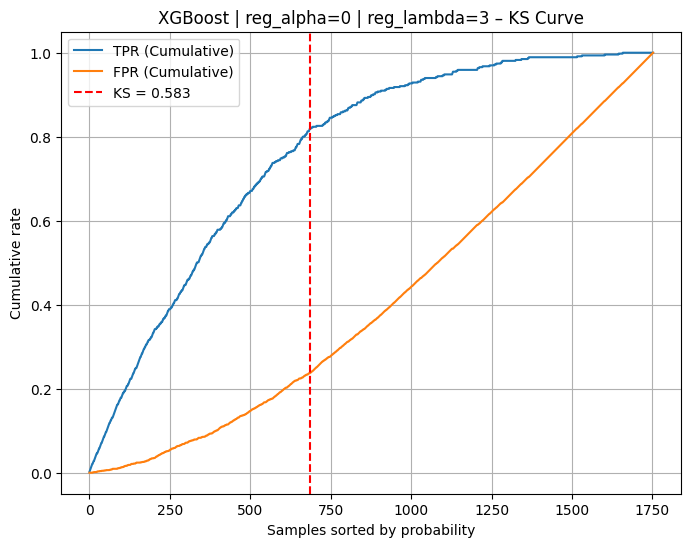

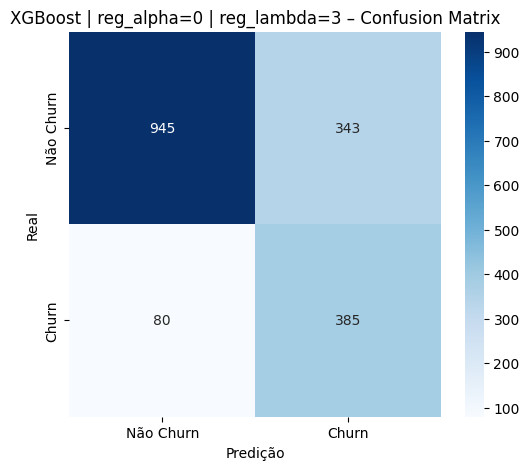

[I 2025-12-18 22:21:24,519] A new study created in memory with name: no-name-b8dcae02-0c8a-4f8b-87d4-1a75fd5c1e6f



===== REG_ALPHA = 0 ===== REG_LAMBDA = 5


[I 2025-12-18 22:21:25,929] Trial 0 finished with value: 0.5527950310559007 and parameters: {'max_depth': 5, 'learning_rate': 0.00028663212744250326, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5527950310559007.
[I 2025-12-18 22:21:28,380] Trial 1 finished with value: 0.56444099378882 and parameters: {'max_depth': 5, 'learning_rate': 0.00013012050514779087, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 5.0}. Best is trial 1 with value: 0.56444099378882.
[I 2025-12-18 22:21:29,651] Trial 2 finished with value: 0.5644409937888198 and parameters: {'max_depth': 5, 'learning_rate': 0.00010539324037942729, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 5.0}. Best is trial 1 with value: 0.564440993788

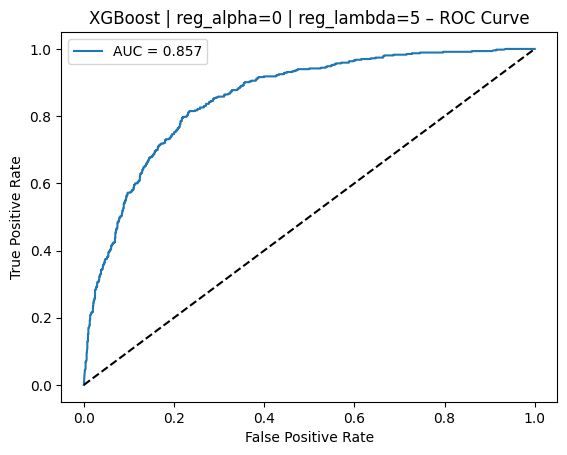

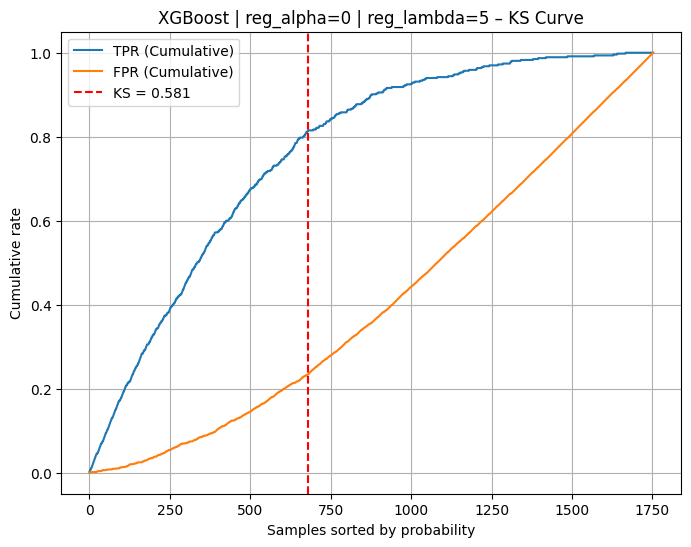

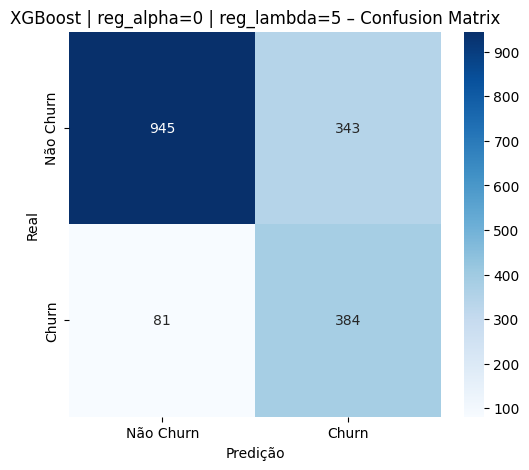

[I 2025-12-18 22:22:38,919] A new study created in memory with name: no-name-a9a91307-46e4-475b-9128-b2b8ec7e7495



===== REG_ALPHA = 0 ===== REG_LAMBDA = 10


[I 2025-12-18 22:22:39,877] Trial 0 finished with value: 0.5535714285714286 and parameters: {'max_depth': 5, 'learning_rate': 2.755250103530996e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 22:22:41,740] Trial 1 finished with value: 0.5473602484472049 and parameters: {'max_depth': 5, 'learning_rate': 8.649797698106543e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 22:22:42,974] Trial 2 finished with value: 0.5652173913043478 and parameters: {'max_depth': 5, 'learning_rate': 9.499179338828298e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.0, 'reg_lambda': 10.0}. Best is trial 2 with value: 0.565217391

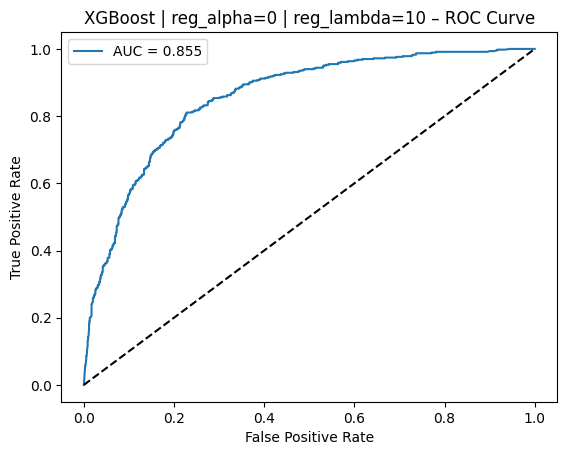

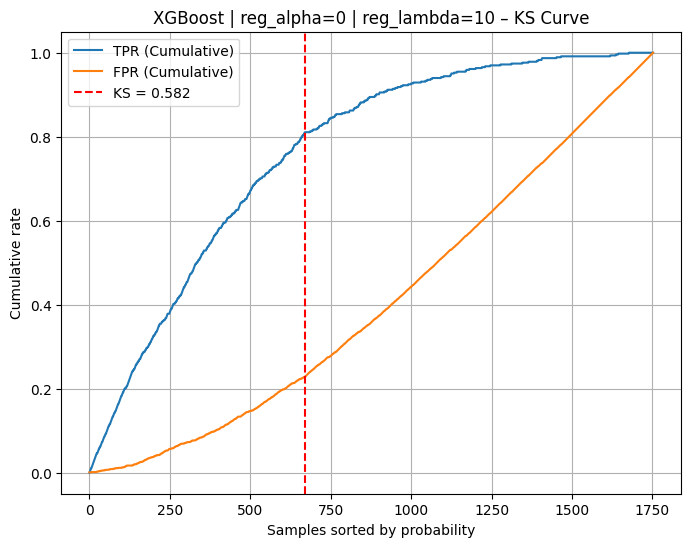

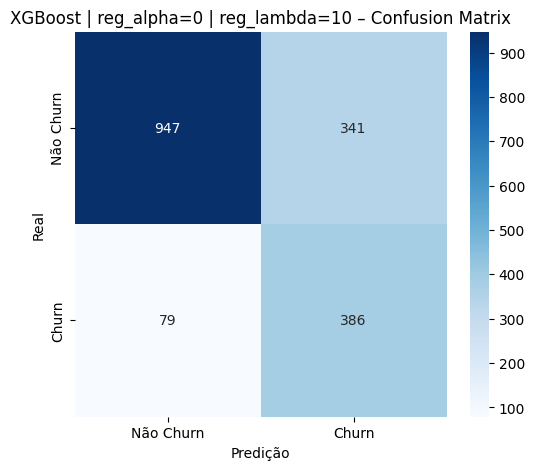

[I 2025-12-18 22:23:38,327] A new study created in memory with name: no-name-b0ae651c-176c-4a02-99b3-cb455c0bf039



===== REG_ALPHA = 0.01 ===== REG_LAMBDA = 1


[I 2025-12-18 22:23:43,182] Trial 0 finished with value: 0.5574534161490683 and parameters: {'max_depth': 8, 'learning_rate': 0.00047355082239641707, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 1.0}. Best is trial 0 with value: 0.5574534161490683.
[I 2025-12-18 22:23:45,158] Trial 1 finished with value: 0.562111801242236 and parameters: {'max_depth': 5, 'learning_rate': 3.633201233747999e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.562111801242236.
[I 2025-12-18 22:23:46,464] Trial 2 finished with value: 0.5605590062111802 and parameters: {'max_depth': 5, 'learning_rate': 3.7576779176381924e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.56211180

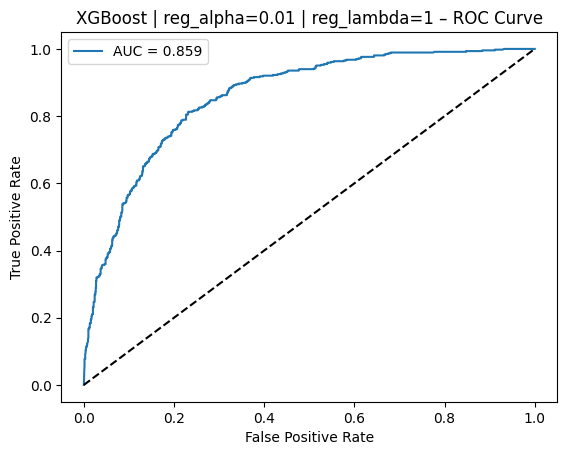

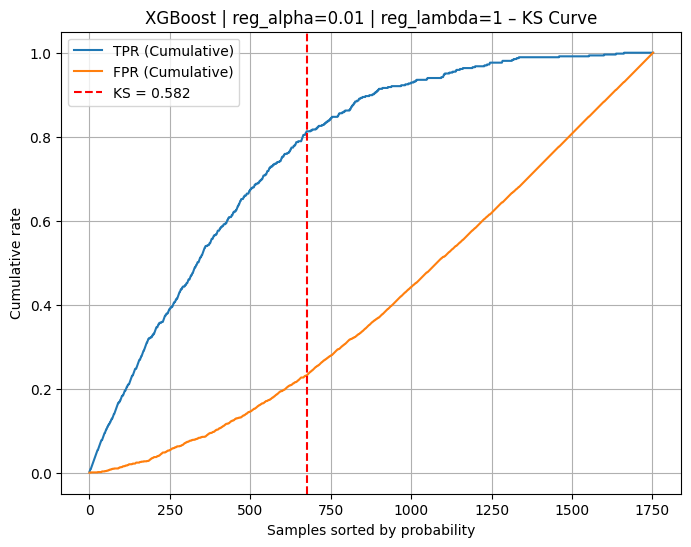

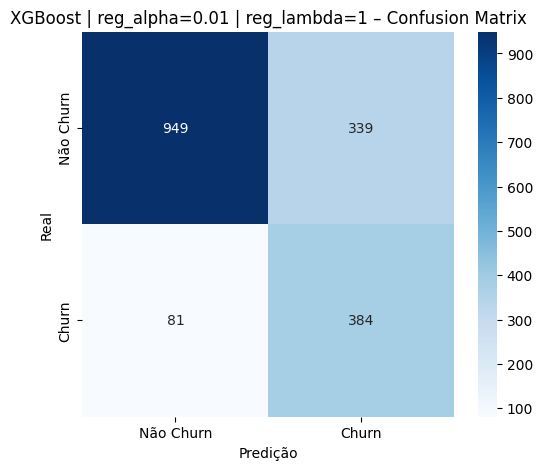

[I 2025-12-18 22:24:55,008] A new study created in memory with name: no-name-f857ec6b-8e51-44a4-93df-f6e83de2aea1



===== REG_ALPHA = 0.01 ===== REG_LAMBDA = 3


[I 2025-12-18 22:24:56,910] Trial 0 finished with value: 0.562111801242236 and parameters: {'max_depth': 5, 'learning_rate': 0.00011842103880501198, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.562111801242236.
[I 2025-12-18 22:24:59,835] Trial 1 finished with value: 0.5520186335403727 and parameters: {'max_depth': 8, 'learning_rate': 0.00010399518133140009, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.562111801242236.
[I 2025-12-18 22:25:02,029] Trial 2 finished with value: 0.562111801242236 and parameters: {'max_depth': 8, 'learning_rate': 1.5178097501446683e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.562111801

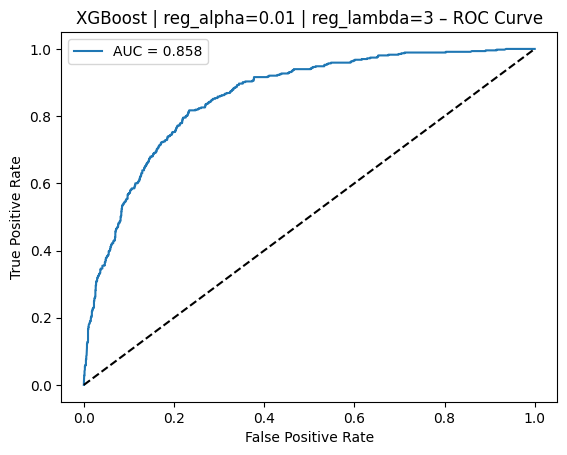

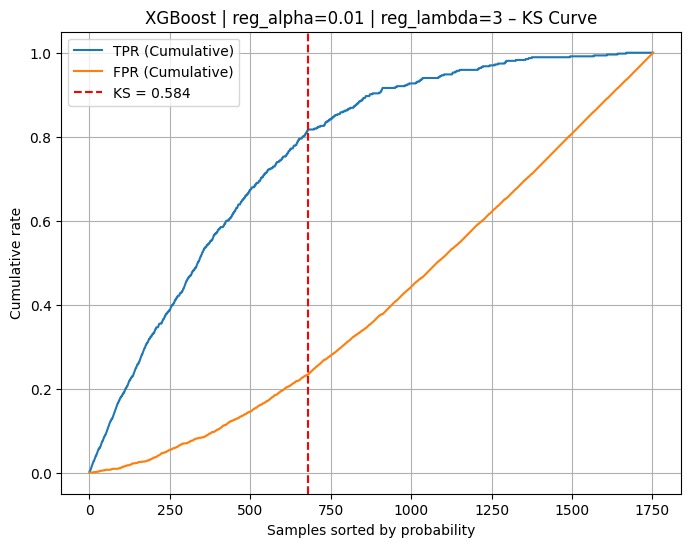

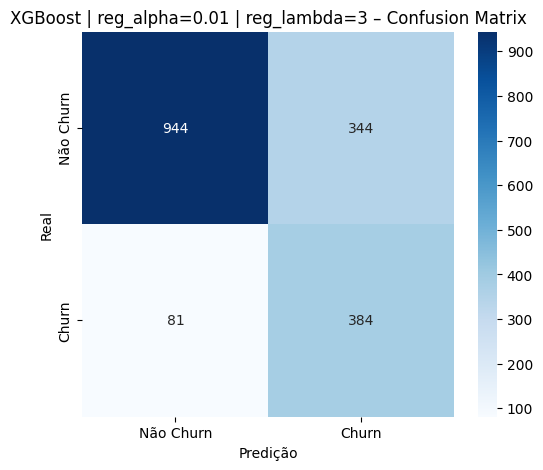

[I 2025-12-18 22:26:12,255] A new study created in memory with name: no-name-6277d08d-1e70-4dab-aac4-0a040a012ca2



===== REG_ALPHA = 0.01 ===== REG_LAMBDA = 5


[I 2025-12-18 22:26:13,233] Trial 0 finished with value: 0.5535714285714286 and parameters: {'max_depth': 8, 'learning_rate': 4.326803694926676e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 22:26:15,157] Trial 1 finished with value: 0.5504658385093169 and parameters: {'max_depth': 5, 'learning_rate': 1.8591793780146812e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5535714285714286.
[I 2025-12-18 22:26:19,024] Trial 2 finished with value: 0.5636645962732919 and parameters: {'max_depth': 5, 'learning_rate': 0.00011297560236327583, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 5.0}. Best is trial 2 with value: 0.563664

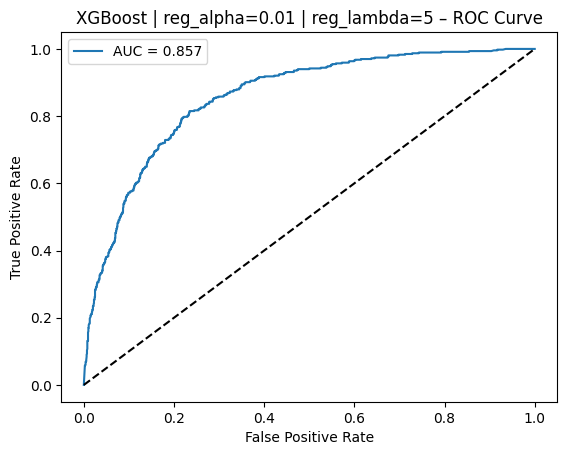

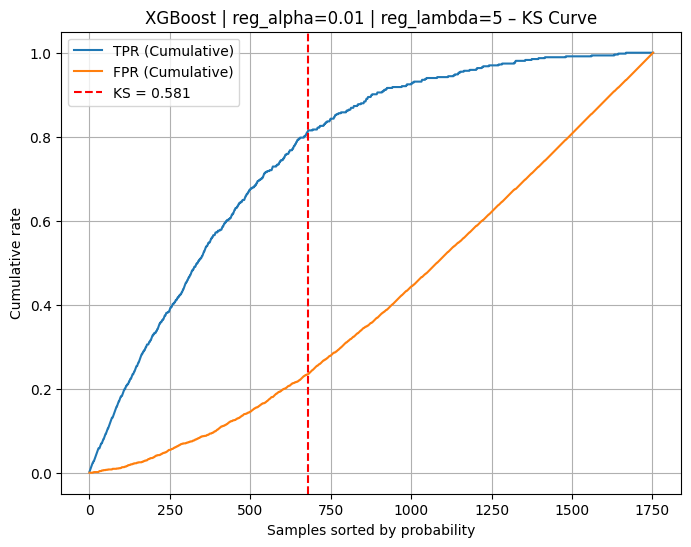

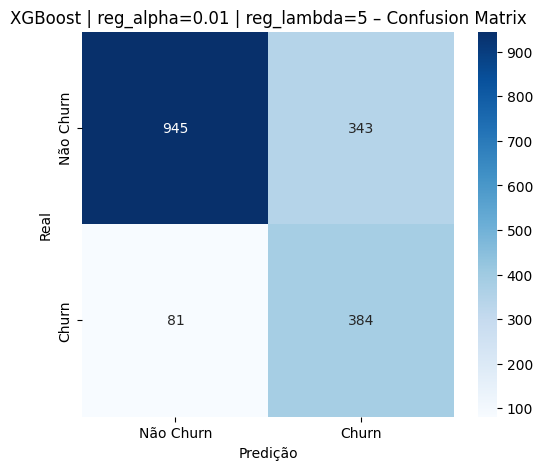

[I 2025-12-18 22:27:19,864] A new study created in memory with name: no-name-1915d229-0d45-46af-b233-2774b6284b98



===== REG_ALPHA = 0.01 ===== REG_LAMBDA = 10


[I 2025-12-18 22:27:23,776] Trial 0 finished with value: 0.5675465838509317 and parameters: {'max_depth': 8, 'learning_rate': 0.00017669404480861542, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5675465838509317.
[I 2025-12-18 22:27:25,614] Trial 1 finished with value: 0.5481366459627329 and parameters: {'max_depth': 8, 'learning_rate': 1.4992613842192003e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5675465838509317.
[I 2025-12-18 22:27:27,500] Trial 2 finished with value: 0.5473602484472049 and parameters: {'max_depth': 5, 'learning_rate': 5.332196880539097e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.56

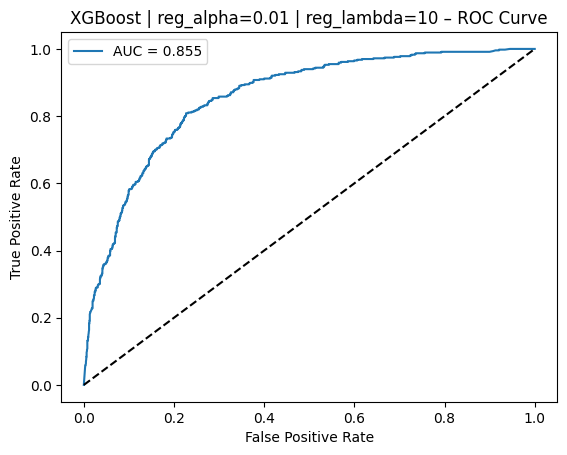

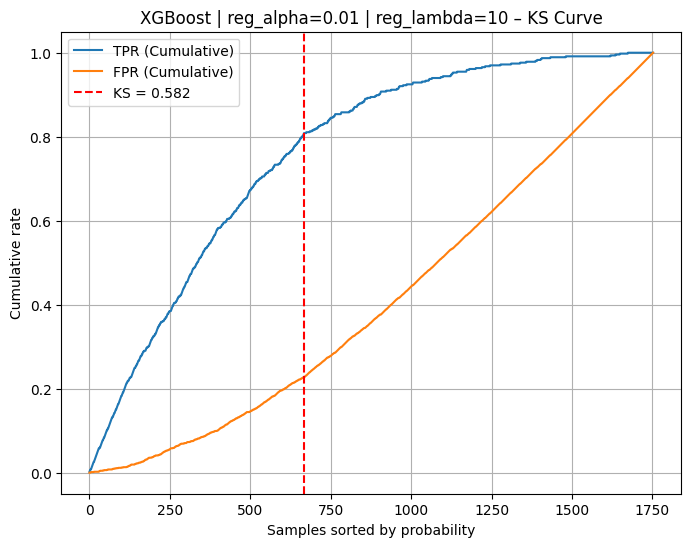

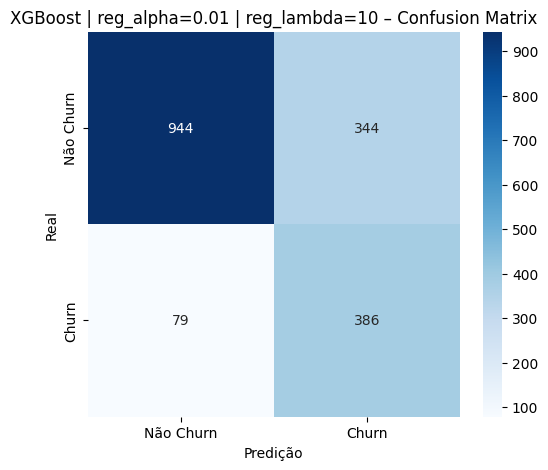

[I 2025-12-18 22:28:22,830] A new study created in memory with name: no-name-d25d2efd-4bc0-465a-8fff-2cbdfa92ea8e



===== REG_ALPHA = 0.1 ===== REG_LAMBDA = 1


[I 2025-12-18 22:28:23,838] Trial 0 finished with value: 0.5504658385093169 and parameters: {'max_depth': 8, 'learning_rate': 5.9691525807413894e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 1.0}. Best is trial 0 with value: 0.5504658385093169.
[I 2025-12-18 22:28:28,543] Trial 1 finished with value: 0.5621118012422361 and parameters: {'max_depth': 5, 'learning_rate': 6.801222073664137e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.5621118012422361.
[I 2025-12-18 22:28:29,866] Trial 2 finished with value: 0.5621118012422361 and parameters: {'max_depth': 5, 'learning_rate': 9.234629984031437e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.56211180124

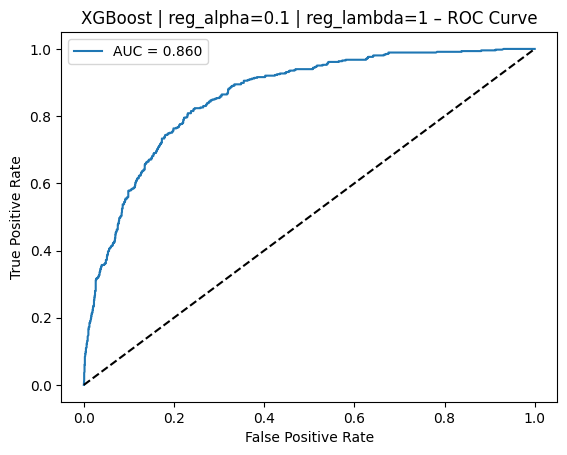

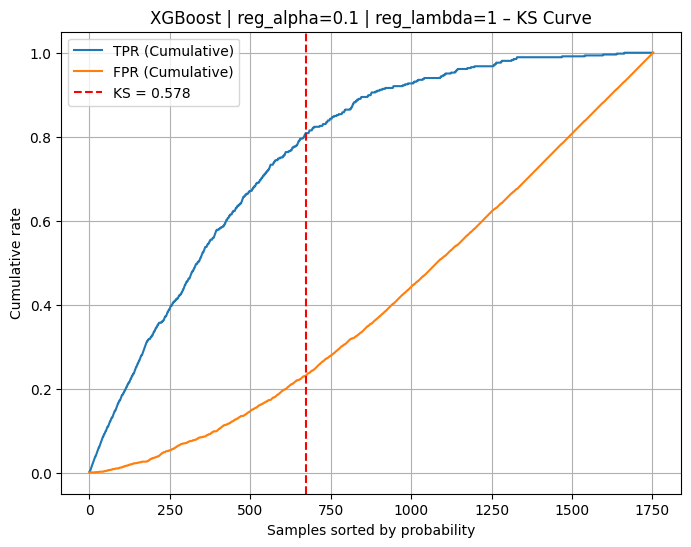

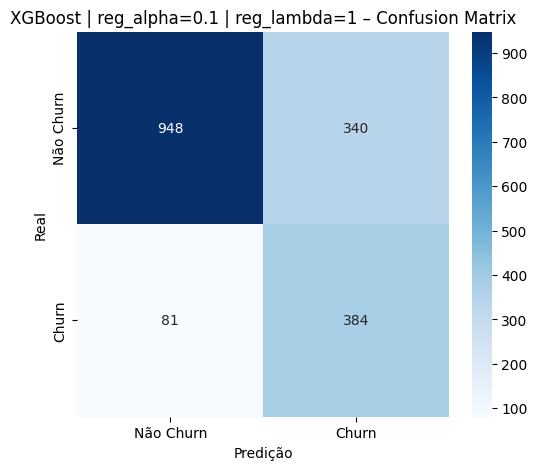

[I 2025-12-18 22:29:32,989] A new study created in memory with name: no-name-84cfc0a2-b561-40e0-be3d-bd3f1fed1a55



===== REG_ALPHA = 0.1 ===== REG_LAMBDA = 3


[I 2025-12-18 22:29:33,989] Trial 0 finished with value: 0.5512422360248448 and parameters: {'max_depth': 8, 'learning_rate': 0.00039379827538876924, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.5512422360248448.
[I 2025-12-18 22:29:35,900] Trial 1 finished with value: 0.5613354037267081 and parameters: {'max_depth': 5, 'learning_rate': 4.0639067905111637e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 3.0}. Best is trial 1 with value: 0.5613354037267081.
[I 2025-12-18 22:29:38,648] Trial 2 finished with value: 0.5613354037267081 and parameters: {'max_depth': 8, 'learning_rate': 1.141037284687243e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 3.0}. Best is trial 1 with value: 0.561335403

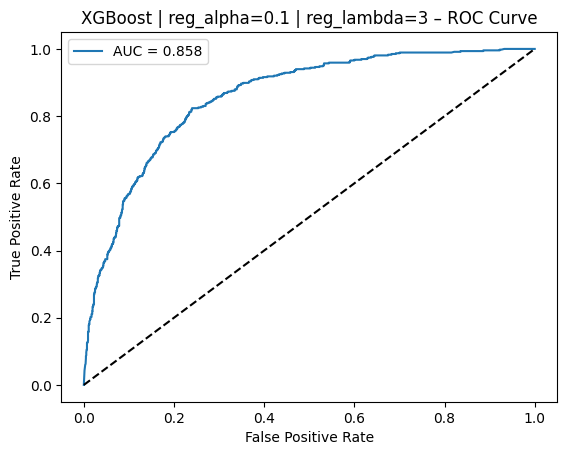

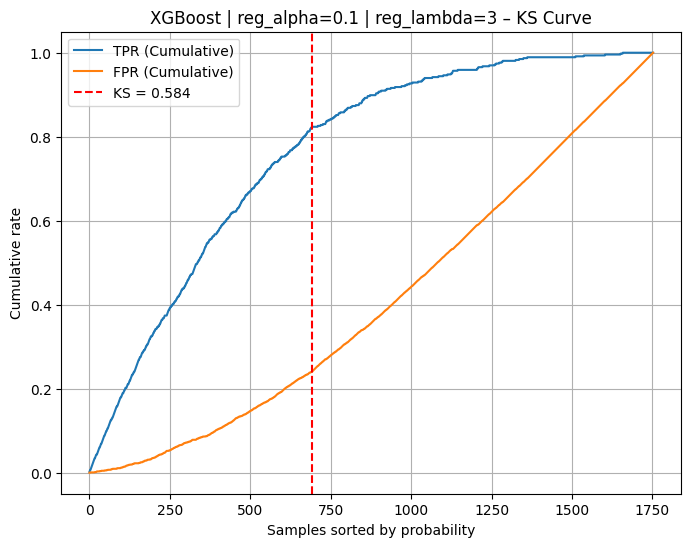

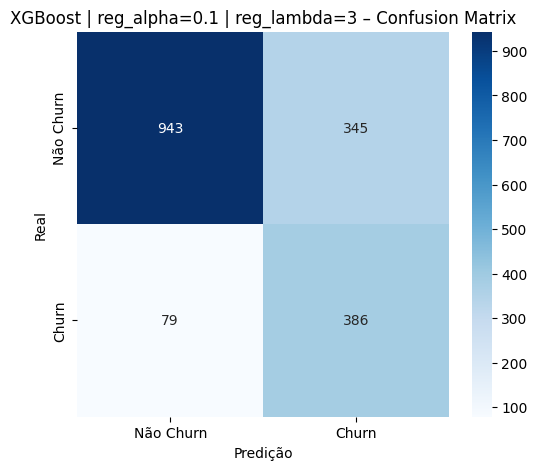

[I 2025-12-18 22:30:38,327] A new study created in memory with name: no-name-9fc607aa-f797-4393-8835-3f7579773414



===== REG_ALPHA = 0.1 ===== REG_LAMBDA = 5


[I 2025-12-18 22:30:41,027] Trial 0 finished with value: 0.5652173913043478 and parameters: {'max_depth': 8, 'learning_rate': 4.588856160603207e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5652173913043478.
[I 2025-12-18 22:30:41,975] Trial 1 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 0.00042570862767805147, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5652173913043478.
[I 2025-12-18 22:30:44,019] Trial 2 finished with value: 0.5659937888198757 and parameters: {'max_depth': 8, 'learning_rate': 3.67624296336784e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 5.0}. Best is trial 2 with value: 0.56599378881

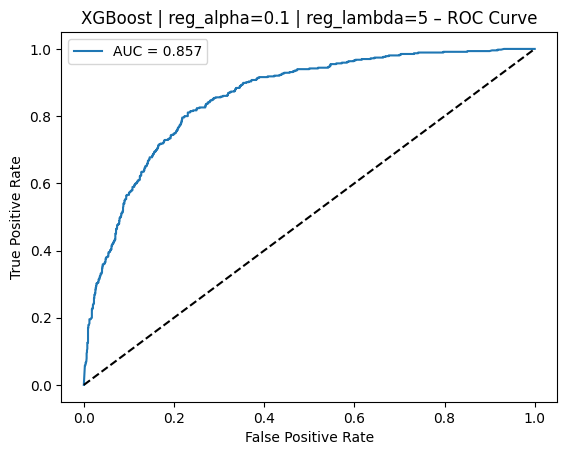

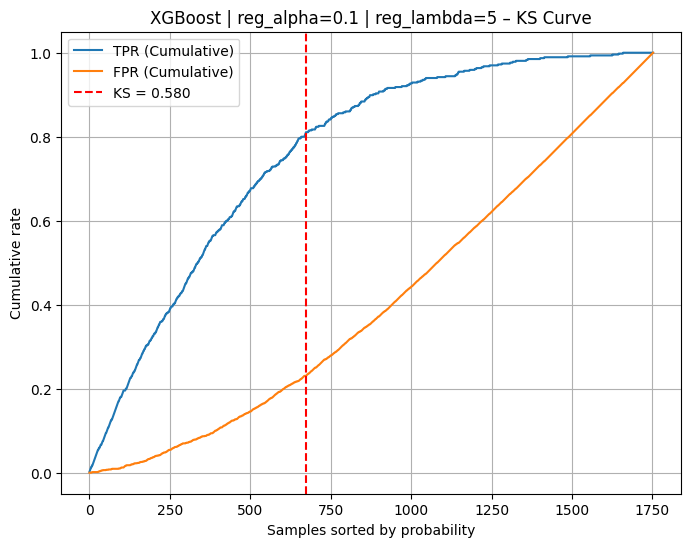

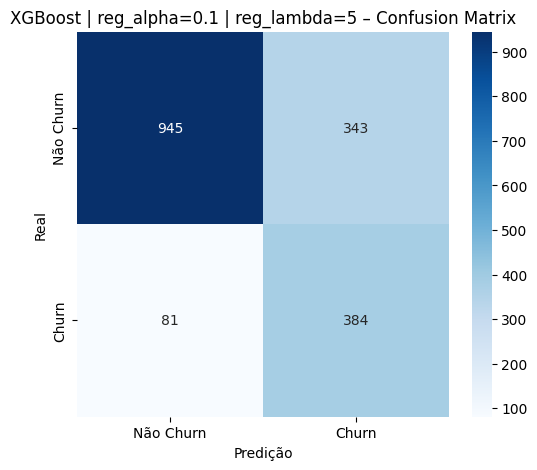

[I 2025-12-18 22:31:47,510] A new study created in memory with name: no-name-c0bda6ef-cc8b-4583-b42a-87c65cbfd9c5



===== REG_ALPHA = 0.1 ===== REG_LAMBDA = 10


[I 2025-12-18 22:31:48,512] Trial 0 finished with value: 0.5527950310559007 and parameters: {'max_depth': 5, 'learning_rate': 0.00034678829005149763, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5527950310559007.
[I 2025-12-18 22:31:49,936] Trial 1 finished with value: 0.5527950310559007 and parameters: {'max_depth': 5, 'learning_rate': 0.0001544368702870284, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5527950310559007.
[I 2025-12-18 22:31:52,811] Trial 2 finished with value: 0.5636645962732919 and parameters: {'max_depth': 8, 'learning_rate': 2.250337180096557e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 10.0}. Best is trial 2 with value: 0.5636645

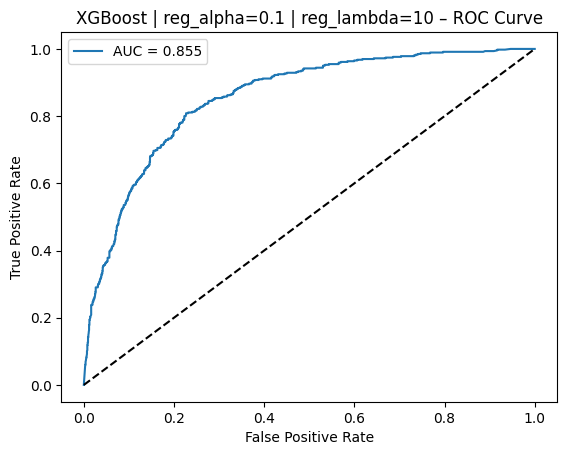

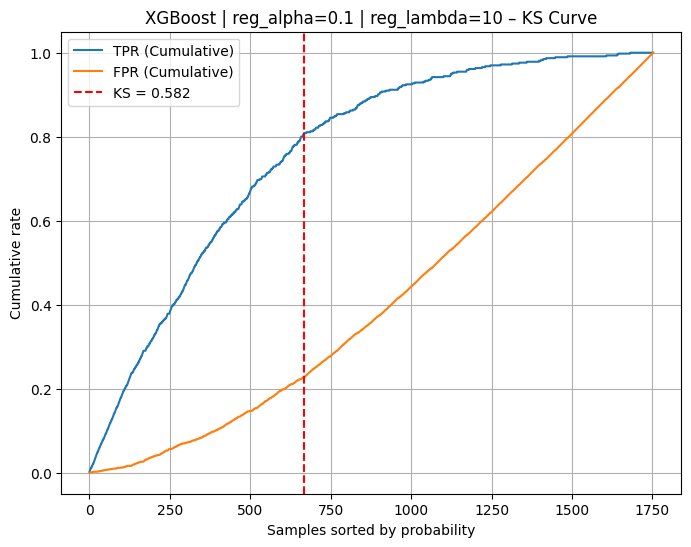

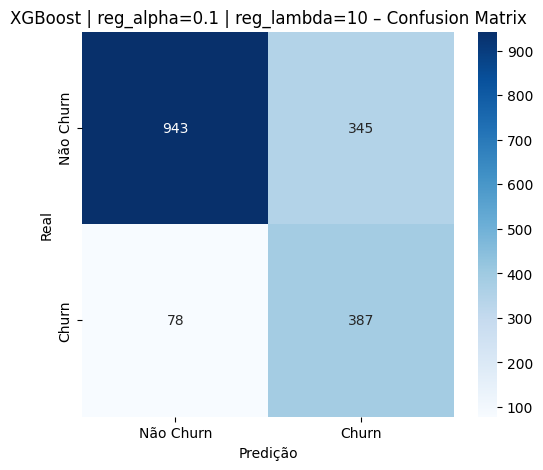

[I 2025-12-18 22:33:05,152] A new study created in memory with name: no-name-beb79314-8c15-4a34-b842-958fd74eb952



===== REG_ALPHA = 1 ===== REG_LAMBDA = 1


[I 2025-12-18 22:33:06,138] Trial 0 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 8.729666836341557e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 1.0}. Best is trial 0 with value: 0.5512422360248448.
[I 2025-12-18 22:33:07,567] Trial 1 finished with value: 0.5520186335403727 and parameters: {'max_depth': 5, 'learning_rate': 0.00011560676653145789, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 1.0}. Best is trial 1 with value: 0.5520186335403727.
[I 2025-12-18 22:33:09,662] Trial 2 finished with value: 0.5613354037267081 and parameters: {'max_depth': 8, 'learning_rate': 1.7904989881755805e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 1.0}. Best is trial 2 with value: 0.561335403

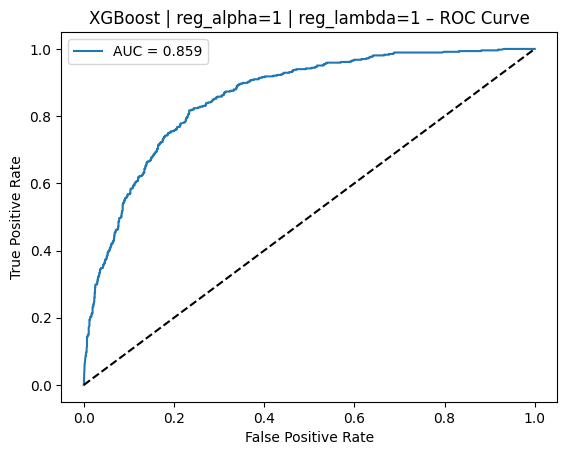

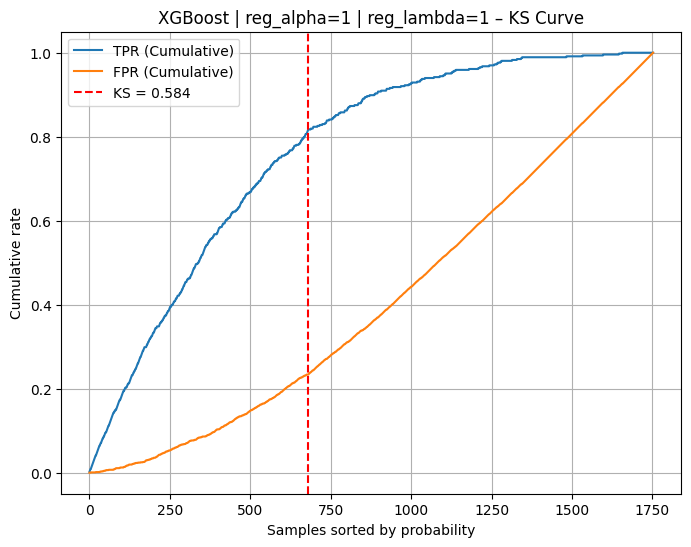

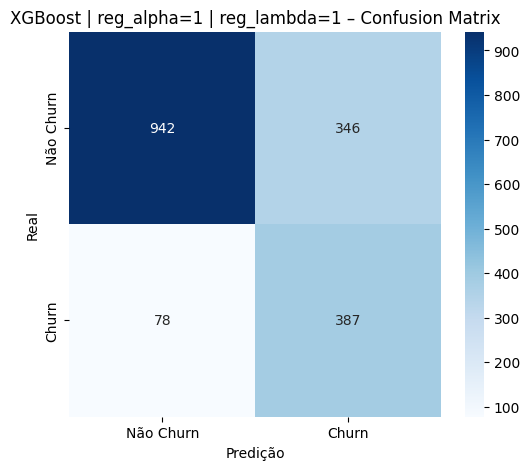

[I 2025-12-18 22:34:00,172] A new study created in memory with name: no-name-11260346-446b-49db-8759-a7917d9d83ad



===== REG_ALPHA = 1 ===== REG_LAMBDA = 3


[I 2025-12-18 22:34:01,632] Trial 0 finished with value: 0.5512422360248448 and parameters: {'max_depth': 8, 'learning_rate': 5.353056824535938e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 3.0}. Best is trial 0 with value: 0.5512422360248448.
[I 2025-12-18 22:34:06,450] Trial 1 finished with value: 0.562888198757764 and parameters: {'max_depth': 8, 'learning_rate': 1.2080877938236988e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 3.0}. Best is trial 1 with value: 0.562888198757764.
[I 2025-12-18 22:34:08,922] Trial 2 finished with value: 0.5659937888198758 and parameters: {'max_depth': 5, 'learning_rate': 0.00025610248590740337, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 3.0}. Best is trial 2 with value: 0.5659937888

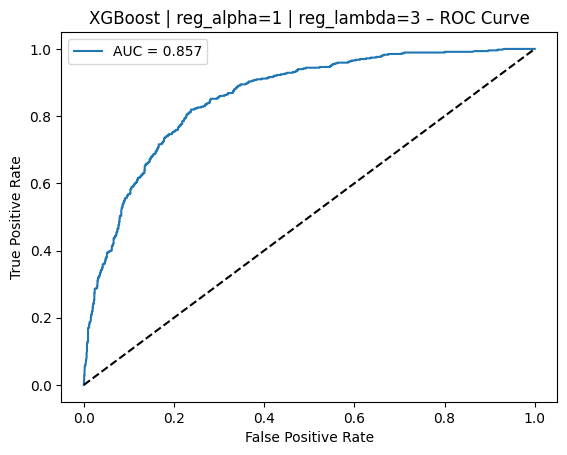

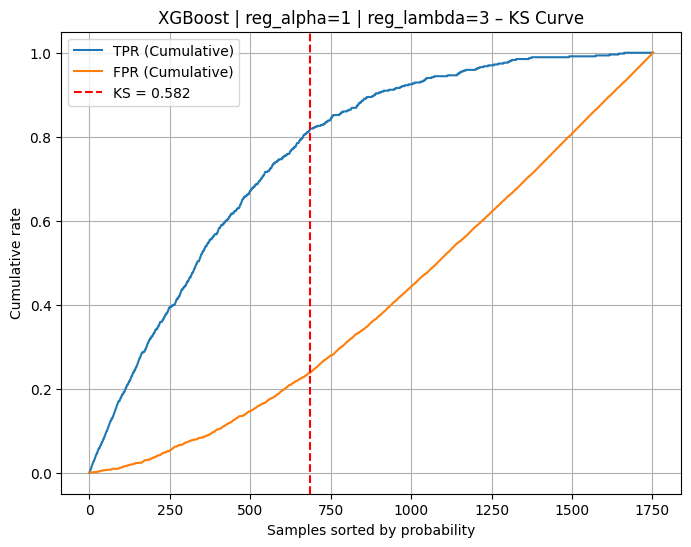

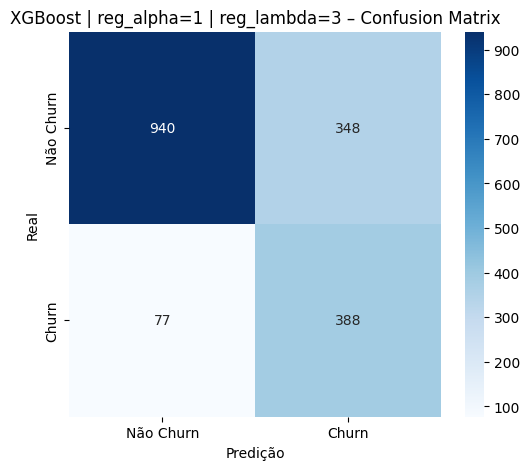

[I 2025-12-18 22:35:17,375] A new study created in memory with name: no-name-e10bf8a9-baf6-4405-963e-fb0a18e5d3e8



===== REG_ALPHA = 1 ===== REG_LAMBDA = 5


[I 2025-12-18 22:35:19,284] Trial 0 finished with value: 0.5489130434782609 and parameters: {'max_depth': 8, 'learning_rate': 7.3135969252259e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 5.0}. Best is trial 0 with value: 0.5489130434782609.
[I 2025-12-18 22:35:24,000] Trial 1 finished with value: 0.5652173913043478 and parameters: {'max_depth': 8, 'learning_rate': 0.000160839178508907, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 5.0}. Best is trial 1 with value: 0.5652173913043478.
[I 2025-12-18 22:35:24,967] Trial 2 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 1.0187937878507684e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 5.0}. Best is trial 1 with value: 0.5652173913043

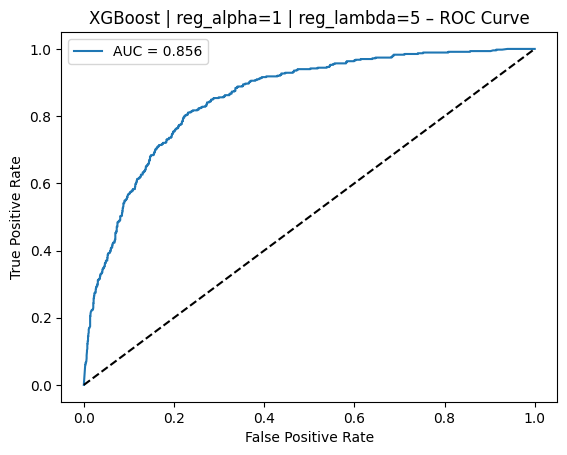

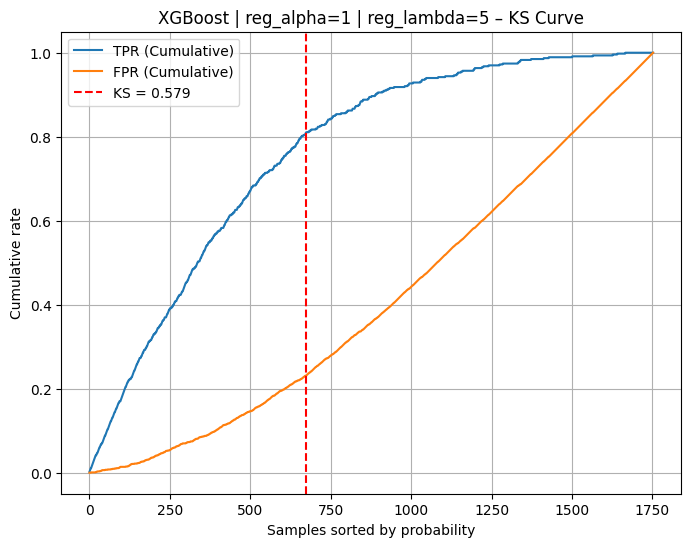

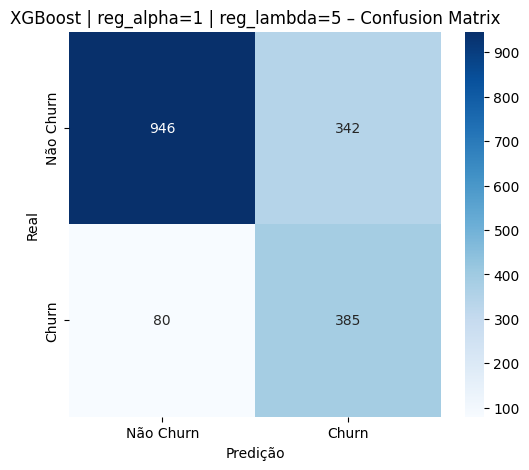

[I 2025-12-18 22:36:21,811] A new study created in memory with name: no-name-c31a9146-56d4-4d45-96ec-35b7cab215ac



===== REG_ALPHA = 1 ===== REG_LAMBDA = 10


[I 2025-12-18 22:36:23,803] Trial 0 finished with value: 0.5496894409937889 and parameters: {'max_depth': 8, 'learning_rate': 0.00036322714670498246, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 10.0}. Best is trial 0 with value: 0.5496894409937889.
[I 2025-12-18 22:36:26,584] Trial 1 finished with value: 0.5652173913043479 and parameters: {'max_depth': 8, 'learning_rate': 0.00011787900427175136, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 10.0}. Best is trial 1 with value: 0.5652173913043479.
[I 2025-12-18 22:36:28,579] Trial 2 finished with value: 0.5512422360248448 and parameters: {'max_depth': 5, 'learning_rate': 1.79777389095571e-05, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 1.0, 'reg_lambda': 10.0}. Best is trial 1 with value: 0.5652173

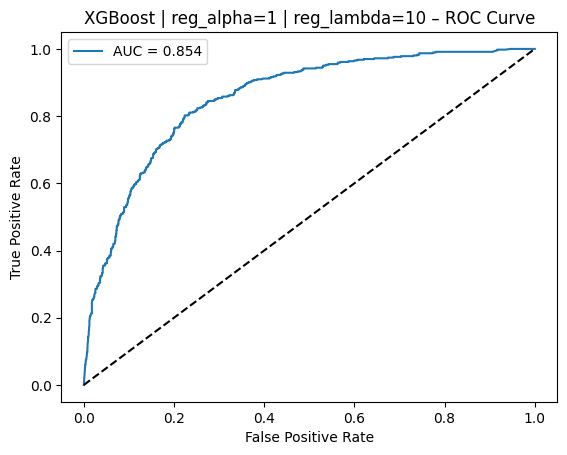

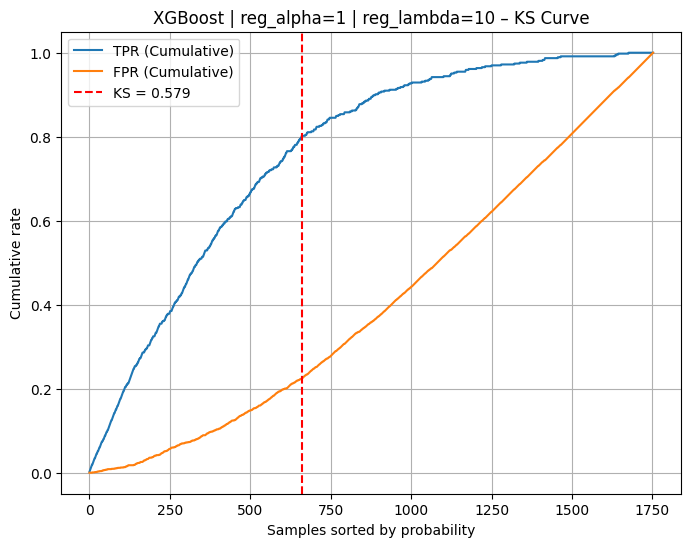

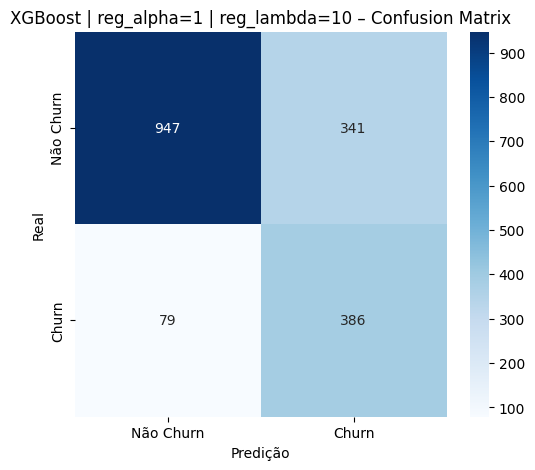

In [ ]:
REG_ALPHA = [0, 0.01, 0.1, 1]
REG_LAMBDA = [1, 3, 5, 10]

all_results = []

for reg_alpha in REG_ALPHA:
  for reg_lambda in REG_LAMBDA:
      print(f"\n===== REG_ALPHA = {reg_alpha} ===== REG_LAMBDA = {reg_lambda}")

      study = optuna.create_study(direction="maximize")
      study.optimize(
          lambda trial: optuna_objective_xgb(trial, reg_alpha, reg_lambda),
          n_trials=30
      )

      best_params = {**study.best_params}

      # ─── Treina modelo final para ESTE reg_alpha ───────────────
      model = XGBClassifier(
          **best_params,
          eval_metric="logloss",
          random_state=42
      )

      model.fit(
          X_train, y_train,
          eval_set=[(X_val, y_val)],
          verbose=False
      )

      # ─── Avaliação + Gráficos ─────────────────────────────
      metrics = show_results(
          model=model,
          X=X_test,
          y=y_test,
          threshold=0.5,
          title_prefix=f"XGBoost | reg_alpha={reg_alpha} | reg_lambda={reg_lambda}"
      )

      # ─── Log estruturado ──────────────────────────────────
      all_results.append({
          "reg_alpha": reg_alpha,
          "reg_lambda": reg_lambda,
          "ks": metrics["ks"],
          "auc": metrics["auc"],
          **study.best_params
      })

In [ ]:
for result in all_results:
  print(result)

{'reg_alpha': 0.0, 'reg_lambda': 1.0, 'ks': np.float64(0.5806434916182461), 'auc': np.float64(0.8596565484538837), 'max_depth': 5, 'learning_rate': 0.00020471625102608975, 'n_estimators': 1200, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10}
{'reg_alpha': 0.0, 'reg_lambda': 3.0, 'ks': np.float64(0.5825535964736526), 'auc': np.float64(0.8582598677619715), 'max_depth': 5, 'learning_rate': 0.00036313957323835414, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10}
{'reg_alpha': 0.0, 'reg_lambda': 5.0, 'ks': np.float64(0.5805817137514192), 'auc': np.float64(0.8565993788819874), 'max_depth': 8, 'learning_rate': 3.940821458281175e-05, 'n_estimators': 1600, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10}
{'reg_alpha': 0.0, 'reg_lambda': 10.0, 'ks': np.float64(0.5824918186068256), 'auc': np.float64(0.8550975088492621), 'max_depth': 8, 'learning_rate': 0.0001235428458661641, 'n_estimato

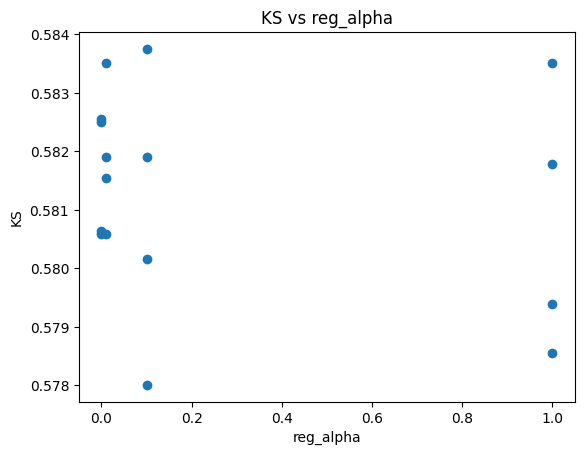

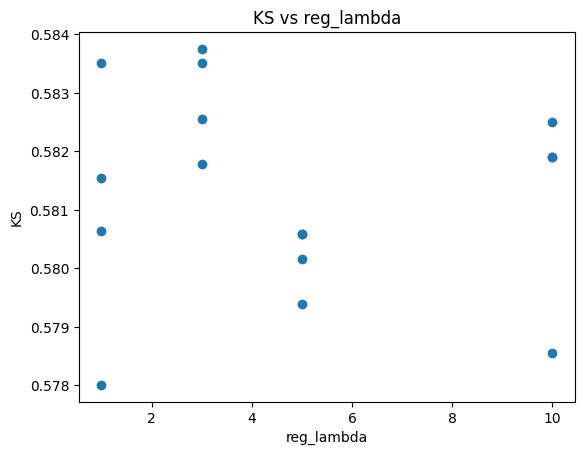

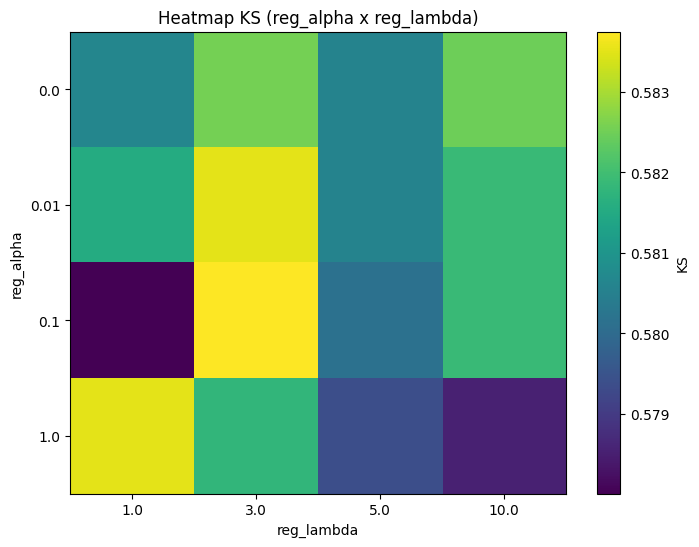

In [ ]:
df = pd.DataFrame(all_results)

# Converter ks e auc (estão como np.float64)
df["ks"] = df["ks"].astype(float)
df["auc"] = df["auc"].astype(float)

plt.figure()
plt.scatter(df["reg_alpha"], df["ks"])
plt.xlabel("reg_alpha")
plt.ylabel("KS")
plt.title("KS vs reg_alpha")
plt.show()

plt.figure()
plt.scatter(df["reg_lambda"], df["ks"])
plt.xlabel("reg_lambda")
plt.ylabel("KS")
plt.title("KS vs reg_lambda")
plt.show()

pivot = df.pivot_table(
    values="ks",
    index="reg_alpha",
    columns="reg_lambda",
    aggfunc="mean"
)

plt.figure(figsize=(8,6))
plt.imshow(pivot, aspect="auto")
plt.colorbar(label="KS")
plt.xticks(range(len(pivot.columns)), pivot.columns)
plt.yticks(range(len(pivot.index)), pivot.index)
plt.xlabel("reg_lambda")
plt.ylabel("reg_alpha")
plt.title("Heatmap KS (reg_alpha x reg_lambda)")
plt.show()


## Treinamento com os melhores Hiperparâmetros

In [ ]:
def optuna_objective_xgb(trial):

    params = {
        "objective": "binary:logistic",
        "eval_metric": "logloss",
        "random_state": 42,
        "n_jobs": -1,

        "max_depth": trial.suggest_categorical("max_depth", [5, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 0.00001, 0.0005, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [800, 1200, 1600]),
        "subsample": trial.suggest_categorical("subsample", [0.6]),
        "colsample_bytree": trial.suggest_categorical("colsample_bytree", [0.8, 0.1]),
        "min_child_weight": trial.suggest_categorical("min_child_weight", [0]),
        "gamma": trial.suggest_categorical("gamma", [10]),
        "reg_alpha": trial.suggest_categorical("reg_alpha", [0.01, 0.1, 1]),
        "reg_lambda": trial.suggest_categorical("reg_lambda", [1, 3]),


    }

    model = xgb.XGBClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_val_prob = model.predict_proba(X_val)[:, 1]
    ks = ks_statistic(y_val, y_val_prob)

    return ks


[I 2025-12-18 22:42:37,206] A new study created in memory with name: no-name-81d16dff-66b5-403e-9a5c-2a756579792d
[I 2025-12-18 22:42:40,787] Trial 0 finished with value: 0.5597826086956522 and parameters: {'max_depth': 8, 'learning_rate': 3.0333123751605384e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.1, 'reg_lambda': 3}. Best is trial 0 with value: 0.5597826086956522.
[I 2025-12-18 22:42:42,271] Trial 1 finished with value: 0.5582298136645962 and parameters: {'max_depth': 8, 'learning_rate': 1.598300844819775e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.8, 'min_child_weight': 0, 'gamma': 10, 'reg_alpha': 0.01, 'reg_lambda': 1}. Best is trial 0 with value: 0.5597826086956522.
[I 2025-12-18 22:42:43,200] Trial 2 finished with value: 0.5527950310559007 and parameters: {'max_depth': 8, 'learning_rate': 3.0066569199984e-05, 'n_estimators': 800, 'subsample': 0.6, 'colsample_bytree': 0.1, 'min_ch

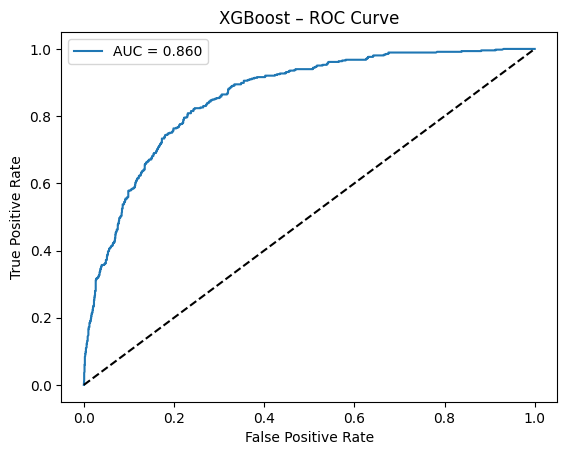

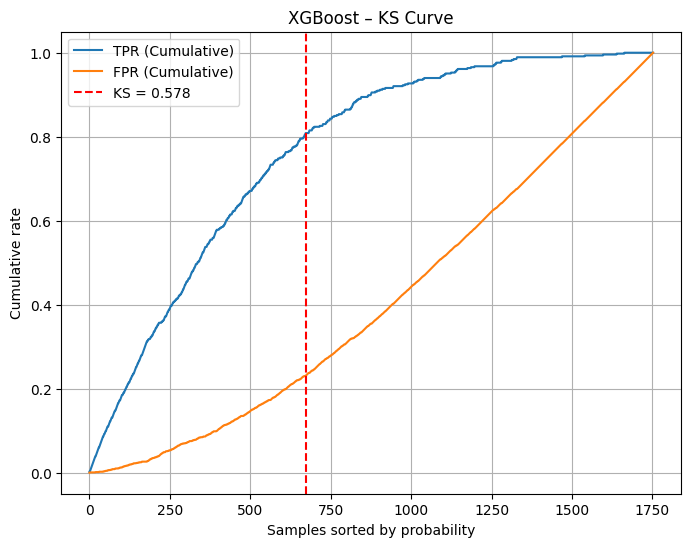

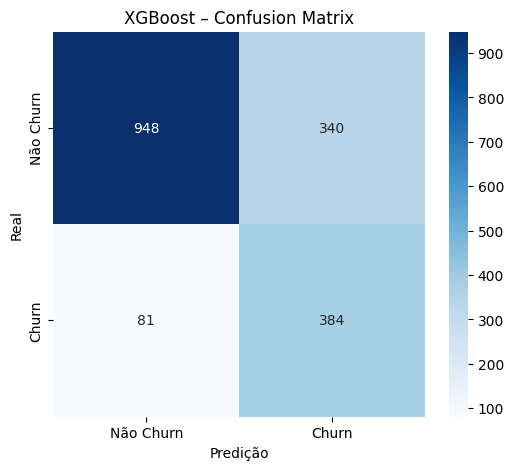

In [ ]:
study = optuna.create_study(direction="maximize")
study.optimize(
    lambda trial: optuna_objective_xgb(trial),
    n_trials=100
)

best_params = {**study.best_params}

model = XGBClassifier(
    **best_params,
    eval_metric="logloss",
    random_state=42
)

model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=False
)

# ─── Avaliação + Gráficos ─────────────────────────────
metrics = show_results(
    model=model,
    X=X_test,
    y=y_test,
    threshold=0.5,
    title_prefix=f"XGBoost"
)

##